## Part One

## DOMAIN: Automobile 
### CONTEXT: The data concerns city-cycle fuel consumption in miles per gallon, to be predicted in terms of 3 multivalued discrete and 5 continuous attributes 
### DATA DESCRIPTION: The data concerns city-cycle fuel consumption in miles per gallon 
### Attribute Information: 
1. mpg: continuous
2. cylinders: multi-valued discrete
3. displacement: continuous
4. horsepower: continuous
5. weight: continuous
6. acceleration: continuous
7. model year: multi-valued discrete
8. origin: multi-valued discrete
9. car name: string (unique for each instance) 

### PROJECT OBJECTIVE: Goal is to cluster the data and treat them as individual datasets to train Regression models to predict ‘mpg’

In [1]:
import numpy as np   
import pandas as pd    
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from scipy.spatial.distance import pdist  #Pairwise distribution between data points
from sklearn.cluster import AgglomerativeClustering 
from sklearn.cluster import KMeans

###### import and warehouse data:

    • Import all the given datasets and explore shape and size. 
    • Merge all datasets onto one and explore final shape and size.
    • Export the final dataset and store it on local machine in .csv, .xlsx and .json format for future use.
    • Import the data from above steps into python.

###### Import all the given datasets and explore shape and size.

In [2]:
autoDetailsRaw = pd.read_json("./Part1 - Car-Attributes.json")

In [3]:
print("Number of Rows of automobile dataset",autoDetailsRaw.shape[0])
print("Number of Columns of automobile dataset",autoDetailsRaw.shape[1])
print("Size of automobile dataset",autoDetailsRaw.size)

Number of Rows of automobile dataset 398
Number of Columns of automobile dataset 8
Size of automobile dataset 3184


In [4]:
carNamesRaw = pd.read_csv("./Part1 - Car name.csv")

In [5]:
print("Number of Rows of car name dataset",carNamesRaw.shape[0])
print("Number of Columns of car name  dataset",carNamesRaw.shape[1])
print("Size of car name  dataset",carNamesRaw.size)

Number of Rows of car name dataset 398
Number of Columns of car name  dataset 1
Size of car name  dataset 398


######  Merge all datasets onto one and explore final shape and size.

In [6]:
mergedDataFrame = pd.merge(autoDetailsRaw, carNamesRaw, left_index=True, right_index=True)
print("Number of Rows of merged dataset",mergedDataFrame.shape[0])
print("Number of Columns of merged dataset",mergedDataFrame.shape[1])
print("Size of merged  dataset",mergedDataFrame.size)

Number of Rows of merged dataset 398
Number of Columns of merged dataset 9
Size of merged  dataset 3582


###### Export the final dataset and store it on local machine in .csv, .xlsx and .json format for future use.

In [7]:
mergedDataFrame.to_csv("./automobileDataSetAsCSV.csv",index=False)

In [8]:
mergedDataFrame.to_excel("./automobileDataSetAsExcel.xlsx",sheet_name='automobileData',index=False)

In [9]:
mergedDataFrame.to_json("./automobileDataSetAsJson.json",orient="records")

###### Import the data from above steps into python.

In [10]:
dataFrameFromcsv = pd.read_csv("./automobileDataSetAsCSV.csv")

In [11]:
dataFrameFromcsv.head(3)

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite


In [12]:
dataFrameFromExcel = pd.read_excel("./automobileDataSetAsExcel.xlsx")

In [13]:
dataFrameFromExcel.head(3)

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite


In [14]:
dataFrameFromJson = pd.read_json("./automobileDataSetAsJson.json",orient="records")

In [15]:
dataFrameFromJson.head(3)

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite


### Data cleansing: 
    • Missing/incorrect value treatment
    • Drop attribute/s if required using relevant functional knowledge
    • Perform another kind of corrections/treatment on the data.

In [16]:
autoMobileDataFrame = mergedDataFrame.copy()

In [17]:
autoMobileDataFrame.isnull().sum()

mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
car_name    0
dtype: int64

    There are no missing values observed.

In [18]:
autoMobileDataFrame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   mpg       398 non-null    float64
 1   cyl       398 non-null    int64  
 2   disp      398 non-null    float64
 3   hp        398 non-null    object 
 4   wt        398 non-null    int64  
 5   acc       398 non-null    float64
 6   yr        398 non-null    int64  
 7   origin    398 non-null    int64  
 8   car_name  398 non-null    object 
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


    Finding column which is having defective column values

In [19]:
for j in autoMobileDataFrame.columns:
    if(autoMobileDataFrame[j].dtypes == 'object' and  j != 'car_name' and  j != 'origin'):
        colIsDigit = pd.DataFrame(autoMobileDataFrame[j].str.isdigit())  
        TFList = colIsDigit[j].unique()
        if(False in TFList):
            print("Column :", j)

Column : hp


In [20]:
autoMobileDataFrame['hp'] = autoMobileDataFrame['hp'].replace('?', np.nan)
autoMobileDataFrame[colIsDigit['hp'] == False] 

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
32,25.0,4,98.0,NaN,2046,19.0,71,1,ford pinto
126,21.0,6,200.0,NaN,2875,17.0,74,1,ford maverick
330,40.9,4,85.0,NaN,1835,17.3,80,2,renault lecar deluxe
336,23.6,4,140.0,NaN,2905,14.3,80,1,ford mustang cobra
354,34.5,4,100.0,NaN,2320,15.8,81,2,renault 18i
374,23.0,4,151.0,NaN,3035,20.5,82,1,amc concord dl


    Based on the viewing dataset values, replace NaN of hp column with median values.

In [21]:
if ('car_name' in autoMobileDataFrame.columns):
    autoMobileDataFrame = autoMobileDataFrame.drop(['car_name'], axis=1)

In [22]:
# replace the missing values with median value.
# Note, we do not need to specify the column names below
# every column's missing value is replaced with that column's median respectively  (axis =0 means columnwise)
# cData = cData.fillna(cData.median())

medianFiller = lambda x: x.fillna(x.median())
autoMobileDataFrame = autoMobileDataFrame.apply(medianFiller,axis=0)
autoMobileDataFrame['hp'] = autoMobileDataFrame['hp'].astype('float64')

###### Data analysis & visualisation
    • Perform detailed statistical analysis on the data.
    • Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis. 
    Hint: Use your best analytical approach. Even you can mix match columns to create new colum

In [23]:
autoMobileDataFrame.describe()

,mpg,cyl,disp,hp,wt,acc,yr,origin
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,23.514573,5.454774,193.425879,104.304020,2970.424623,15.568090,76.010050,1.572864
std,7.815984,1.701004,104.269838,38.222625,846.841774,2.757689,3.697627,0.802055
min,9.000000,3.000000,68.000000,46.000000,1613.000000,8.000000,70.000000,1.000000
25%,17.500000,4.000000,104.250000,76.000000,2223.750000,13.825000,73.000000,1.000000
50%,23.000000,4.000000,148.500000,93.500000,2803.500000,15.500000,76.000000,1.000000
75%,29.000000,8.000000,262.000000,125.000000,3608.000000,17.175000,79.000000,2.000000
max,46.600000,8.000000,455.000000,230.000000,5140.000000,24.800000,82.000000,3.000000


**observation**:

    mpg: 
        mean and median are almost similar, so the distribution seems to be normal, we can confirm it upon ploting distribution plot
        75% of the observed vehicles are having less then or equal to 29 miles per gallon fuel efficacy
        The are possible outlier, since max value differs a lot from 75 percentile.
        
    cyl:
        Minimum number of cylinder are 3
        Maximum number of cylinder are 8
        
    disp:
        engine displacement seems to be  positively skewed (right skewed) since  mean is greater than the median.
        75% of the observed vehicles are having less then or equal to 262 inches in engine displacement.
        
    hp:
        horse power seems to be  positively skewed (right skewed) since  mean is greater than the median.
        There are possible outliers in the data.
     
    wt:
        mean and median are almost similar, data observed for Weight column seems to be normally distributed
        
    acc:
        mean and median are almost similar, data observed for accelerate column seems to be normally distributed       

    lets check the outlier in the data.

In [24]:
listofcolumns = list(autoMobileDataFrame)
for indexOfList in  listofcolumns[0:-1]:
    quant25 = np.percentile(autoMobileDataFrame[indexOfList],25)
    quant75 = np.percentile(autoMobileDataFrame[indexOfList],75)
    Threshold=(quant75-quant25)*1.5
    lower=quant25-Threshold
    upper=quant75+Threshold
    Outliers=[i for i in autoMobileDataFrame[indexOfList] if i < lower or i > upper]
    print('{} Total Number of outliers in {} : {}'.format('\033[1m',indexOfList,len(Outliers)))

 Total Number of outliers in mpg : 1
 Total Number of outliers in cyl : 0
 Total Number of outliers in disp : 0
 Total Number of outliers in hp : 11
 Total Number of outliers in wt : 0
 Total Number of outliers in acc : 9
 Total Number of outliers in yr : 0


In [25]:
autoMobileDataFrame.corr()

,mpg,cyl,disp,hp,wt,acc,yr,origin
mpg,1.000000,-0.775396,-0.804203,-0.773453,-0.831741,0.420289,0.579267,0.563450
cyl,-0.775396,1.000000,0.950721,0.841284,0.896017,-0.505419,-0.348746,-0.562543
disp,-0.804203,0.950721,1.000000,0.895778,0.932824,-0.543684,-0.370164,-0.609409
hp,-0.773453,0.841284,0.895778,1.000000,0.862442,-0.686590,-0.413733,-0.452096
wt,-0.831741,0.896017,0.932824,0.862442,1.000000,-0.417457,-0.306564,-0.581024
acc,0.420289,-0.505419,-0.543684,-0.686590,-0.417457,1.000000,0.288137,0.205873
yr,0.579267,-0.348746,-0.370164,-0.413733,-0.306564,0.288137,1.000000,0.180662
origin,0.563450,-0.562543,-0.609409,-0.452096,-0.581024,0.205873,0.180662,1.000000


**Observation**:
    
    mpg and cyl are negatively correlated, as number of cyl grows mpg of vehicle decreases.
    mpg and disp are negatively correlated, as number of displacement inches increases mpg of vehicle decreases.
    mpg and hp are negatively correlated, as number of horse power increases mpg of vehicle decreases.
    mpg and wt are negatively correlated, as weight increases mpg of vehicle decreases.
    cyl and disp are positively correlated, as number of cyliders increases, vehicles temds to have higher displacement.
    cyl and hp are positively correlated, as number of cyliders increases, vehicles temds to have higher horse power. 
    cyl and weight of the vehicle is positively correlated, heavier vehicles tends to have more cylinders.
    disp and hp are positively correlated, more displacement (inches) more Horse power.
    disp and wt are positively correlated, Heavier vehicle tends to have larger engine displacement.
    acceleration has negative correlation with cyl, dsip, hp and wt.

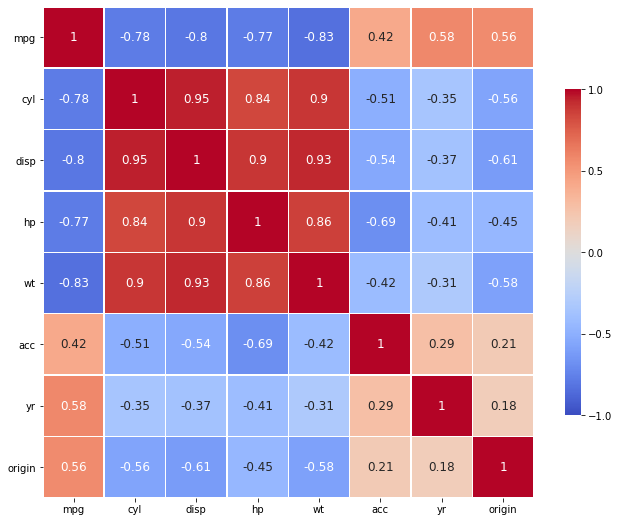

In [26]:
f, ax = plt.subplots(figsize=(11, 15))

heatmap = sns.heatmap(autoMobileDataFrame.corr(),square = True,linewidths = .5,cmap = 'coolwarm',cbar_kws = {'shrink': .4,'ticks' : [-1, -.5, 0, 0.5, 1]}, vmin = -1, vmax = 1, annot = True, annot_kws = {"size": 12})
ax.set_yticklabels(autoMobileDataFrame.columns, rotation = 0)
ax.set_xticklabels(autoMobileDataFrame.columns)

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

D:\anaconda\envs\gl\lib\site-packages\ipykernel_launcher.py:14: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


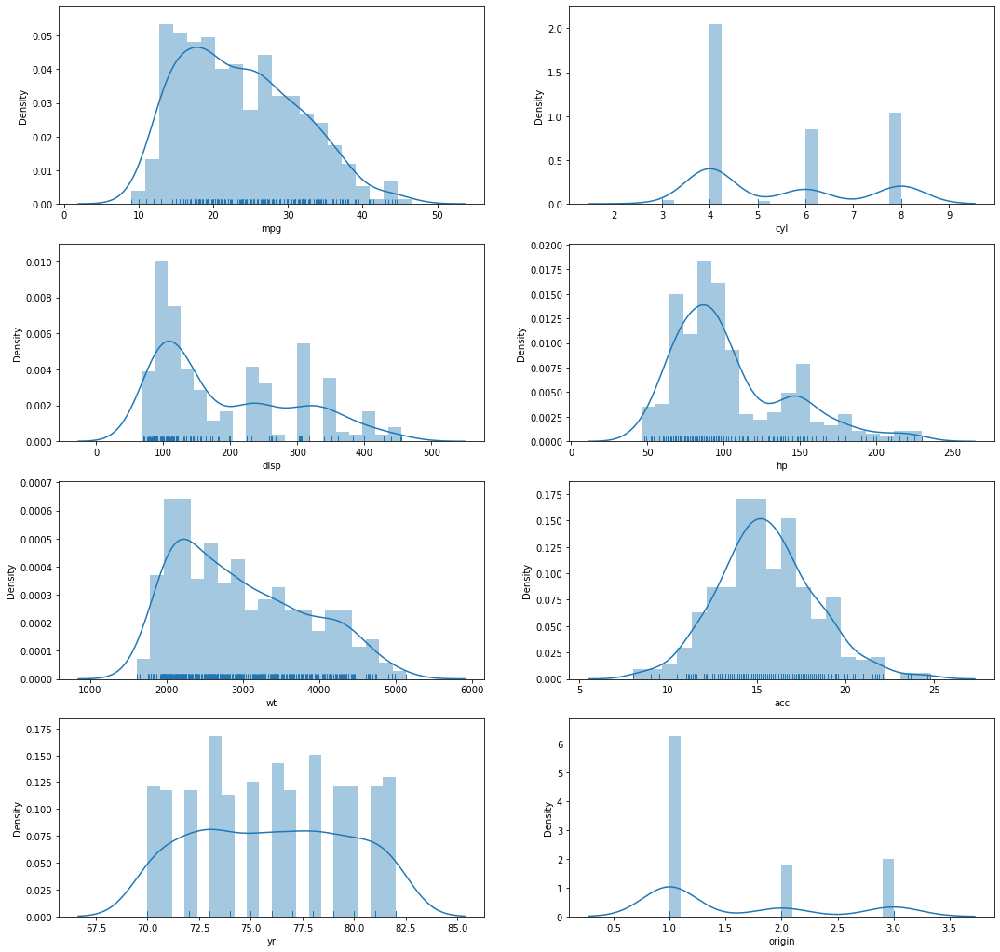

In [27]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig, ax = plt.subplots(4,2, figsize=(18,18))
listOfColumns = autoMobileDataFrame.columns
len_listOfColumns = len(listOfColumns)
index = 0

for j in range(len(ax)):
    for i in range(len(ax[j])):
        if(index < len_listOfColumns):
            ax[j][i] = sns.distplot(autoMobileDataFrame[listOfColumns[index]],bins=20,rug=True,ax = ax[j][i]);            
            index = index + 1 
fig.show()

**Observation**:

    More cars are having MPG between 12 and 20 mpg, the data distribution (normal) is bit right skewed.
    There are more even numberd cylinders observed.
    engine displacement is following right skewed distribution, more cars are having displacement between 80 to 160.
    There are more cars with horsepower between 50 and 100, The data is right skewed.
    vehicle weight (lbs.) is having right skewedness, more cars are having weight between 2000 and 3000.
    Time to accelerate from O to 60 mph (sec.) is following a oraml distribution.
    model year (modulo 100) shows that each year almost equal number of cars being released to market.
    origin of car (1. American, 2. European,3. Japanese), most cars are with american origin.

D:\anaconda\envs\gl\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


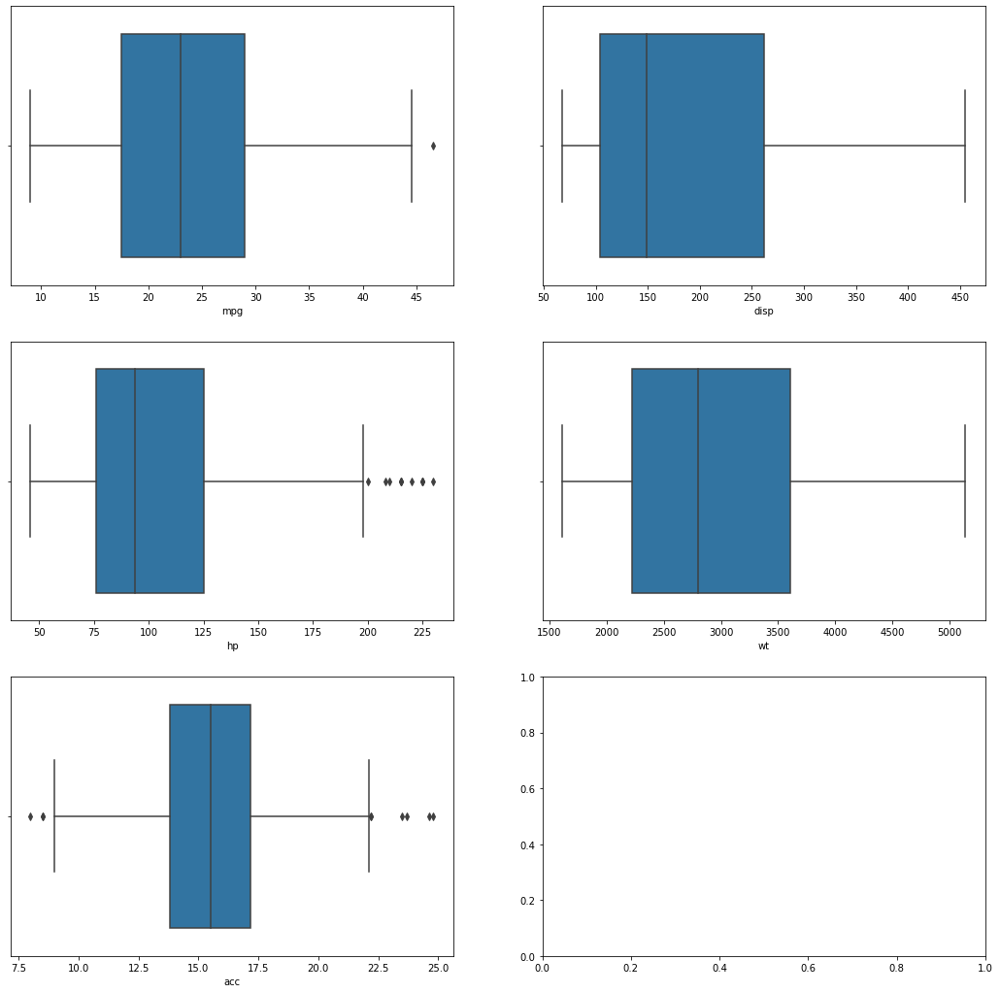

In [28]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig, ax = plt.subplots(3,2, figsize=(18,18))
listOfColumns = list(autoMobileDataFrame)
excludeColumnsBoxPlot = ['cyl','origin','yr']
for elem in excludeColumnsBoxPlot:
    listOfColumns.remove(elem)
len_listOfColumns = len(listOfColumns)
index = 0

for j in range(len(ax)):
    for i in range(len(ax[j])):
        if(index < len_listOfColumns):
            ax[j][i] = sns.boxplot(autoMobileDataFrame[listOfColumns[index]],ax = ax[j][i]);            
            index = index + 1 
fig.show()

    Outliers observed in columns - MPG (miles per gallon), horsepower (hp), time to accelerate from O to 60 mph (sec.) (acc),

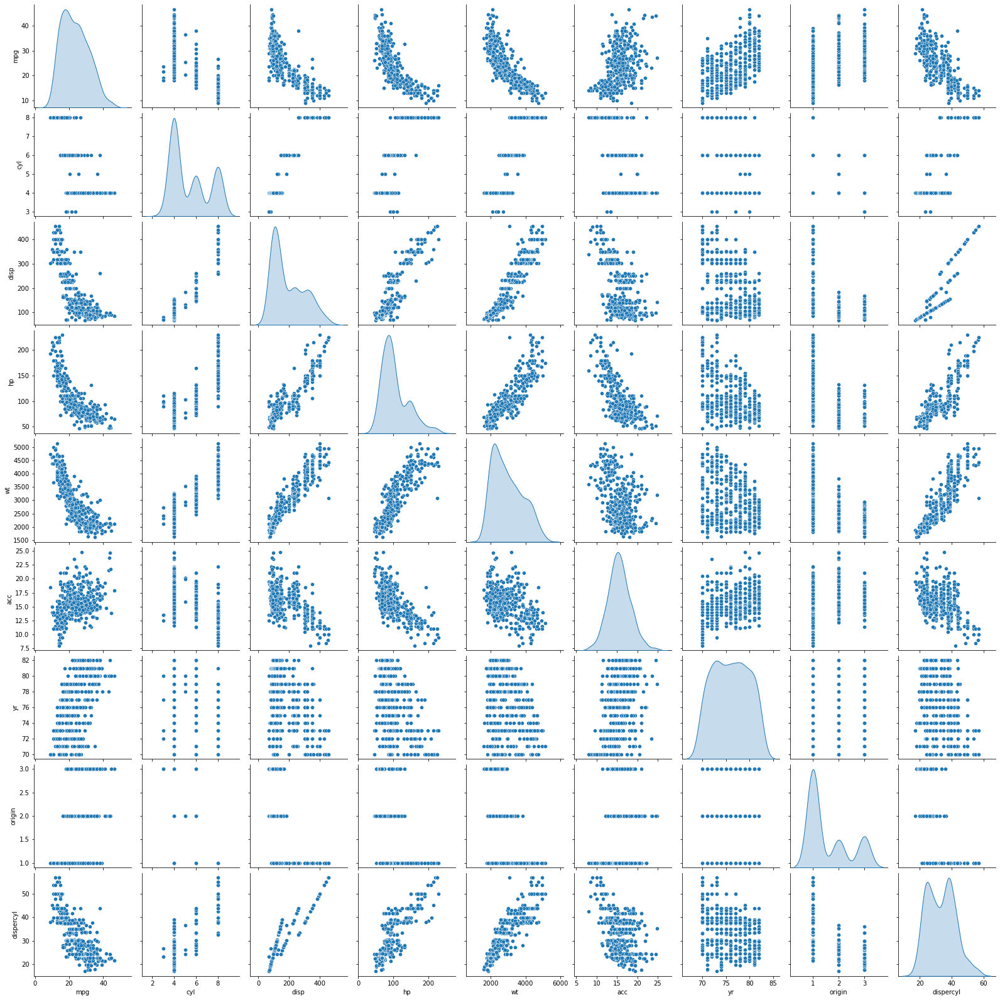

In [29]:
#**density curve instead of histogram on the diag
autoMobileDataFramePairPlot = autoMobileDataFrame.copy()
autoMobileDataFramePairPlot['dispercyl'] = autoMobileDataFrame['disp'] / autoMobileDataFrame['cyl']
sns.pairplot(autoMobileDataFramePairPlot, diag_kind='kde')   

    The above graph shows that variables are dependent on one another.
    
    By observation, we can say that most variables are having either positive or negative correlation and PCA can be applied to reduce the number of column which can then be used for training the machine learning models.
    
    Origin column distribution also shows that the data are overlapping for mpg, acc, yr. disp, hp, wt and dispercyl may contribute to different clusters in the data. So inclusion of this column needs to be tried and decide if this is needed for model building.
    
    When we look at the origin column - it looks like the data is combined from 3 disparate sources.
    
    acc column is having negative correlation with cyl, disp, hp, wt. We can deduce few relationships on this data which could be like - heavier the car, it tends to accelerate less.
    acc vs mpg shows a cloud on scatter plot, which doesn't signify a good relationship, but there is a tail  which depicts that it could have a positive correlation.
    
    The new column dispercyl is combination of disp column over cyl column signify displacement of engine over cylinder and when this column is observed against other columns - we can see minimum 3 cluster formation.
    
    

###### Machine learning: 
    • Use K Means and Hierarchical clustering to find out the optimal number of clusters in the data. 
    • Share your insights about the difference in using these two methods.

In [30]:
autoMobileDataFrame

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130.0,3504,12.0,70,1
1,15.0,8,350.0,165.0,3693,11.5,70,1
2,18.0,8,318.0,150.0,3436,11.0,70,1
3,16.0,8,304.0,150.0,3433,12.0,70,1
4,17.0,8,302.0,140.0,3449,10.5,70,1
...,...,...,...,...,...,...,...,...
393,27.0,4,140.0,86.0,2790,15.6,82,1
394,44.0,4,97.0,52.0,2130,24.6,82,2
395,32.0,4,135.0,84.0,2295,11.6,82,1
396,28.0,4,120.0,79.0,2625,18.6,82,1


In [31]:
autoMobileDataFrame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   cyl     398 non-null    int64  
 2   disp    398 non-null    float64
 3   hp      398 non-null    float64
 4   wt      398 non-null    int64  
 5   acc     398 non-null    float64
 6   yr      398 non-null    int64  
 7   origin  398 non-null    int64  
dtypes: float64(4), int64(4)
memory usage: 25.0 KB


In [32]:
#Scaling the data.
from scipy.stats import zscore
autoMobileDataFrame['origin'] = autoMobileDataFrame['origin'].replace({1: 'america', 2: 'europe', 3: 'asia'})
autoMobileDataFrame11 = autoMobileDataFrame[['mpg','cyl','disp','hp','wt','acc','yr','origin']].copy()
autoMobileDataFrame11_Scaled = pd.get_dummies(autoMobileDataFrame11, columns=['origin'])
autoMobileDataFrame1_Scaled = autoMobileDataFrame11_Scaled.apply(zscore)
# autoMobileDataFrameScaled=autoMobileDataFrame[['mpg', 'cyl', 'disp', 'hp', 'wt', 'acc', 'yr']].apply(zscore)

In [33]:
autoMobileDataFrame1_Scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   mpg             398 non-null    float64
 1   cyl             398 non-null    float64
 2   disp            398 non-null    float64
 3   hp              398 non-null    float64
 4   wt              398 non-null    float64
 5   acc             398 non-null    float64
 6   yr              398 non-null    float64
 7   origin_america  398 non-null    float64
 8   origin_asia     398 non-null    float64
 9   origin_europe   398 non-null    float64
dtypes: float64(10)
memory usage: 31.2 KB


###### K Means

D:\anaconda\envs\gl\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  f"KMeans is known to have a memory leak on Windows "


Text(0.5, 1.0, 'Selecting k with the Elbow Method')

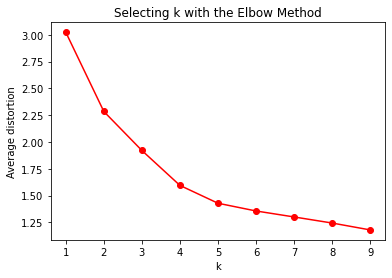

In [34]:
#Finding optimal no. of clusters
from scipy.spatial.distance import cdist
clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(autoMobileDataFrame1_Scaled)
    prediction=model.predict(autoMobileDataFrame1_Scaled)
    meanDistortions.append(sum(np.min(cdist(autoMobileDataFrame1_Scaled, model.cluster_centers_, 'euclidean'), axis=1)) / autoMobileDataFrame1_Scaled.shape[0])


plt.plot(clusters, meanDistortions, 'or-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

In [35]:
autoMobileDataFrame1_Scaled

,mpg,cyl,disp,hp,wt,acc,yr,origin_america,origin_asia,origin_europe
0,-0.706439,1.498191,1.090604,0.673118,0.630870,-1.295498,-1.627426,0.773559,-0.497643,-0.461968
1,-1.090751,1.498191,1.503514,1.589958,0.854333,-1.477038,-1.627426,0.773559,-0.497643,-0.461968
2,-0.706439,1.498191,1.196232,1.197027,0.550470,-1.658577,-1.627426,0.773559,-0.497643,-0.461968
3,-0.962647,1.498191,1.061796,1.197027,0.546923,-1.295498,-1.627426,0.773559,-0.497643,-0.461968
4,-0.834543,1.498191,1.042591,0.935072,0.565841,-1.840117,-1.627426,0.773559,-0.497643,-0.461968
...,...,...,...,...,...,...,...,...,...,...
393,0.446497,-0.856321,-0.513026,-0.479482,-0.213324,0.011586,1.621983,0.773559,-0.497643,-0.461968
394,2.624265,-0.856321,-0.925936,-1.370127,-0.993671,3.279296,1.621983,-1.292726,-0.497643,2.164651
395,1.087017,-0.856321,-0.561039,-0.531873,-0.798585,-1.440730,1.621983,0.773559,-0.497643,-0.461968
396,0.574601,-0.856321,-0.705077,-0.662850,-0.408411,1.100822,1.621983,0.773559,-0.497643,-0.461968


D:\anaconda\envs\gl\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  f"KMeans is known to have a memory leak on Windows "


[3979.9999999999995, 2230.299148754932, 1657.0127086326613, 1152.2829079053504, 951.651808064819, 870.0785252546775, 793.3629019249897, 720.7254308420172, 655.6584068188055]


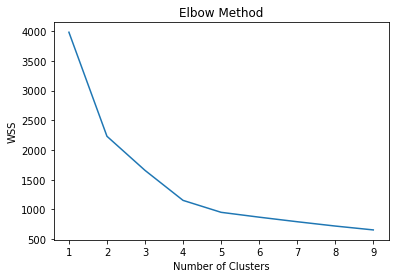

In [36]:
#calculatint the within sum of squares
wss =[] 
for i in range(1,10):
    model = KMeans(n_clusters=i)
    model.fit(autoMobileDataFrame1_Scaled)
    wss.append(model.inertia_)
print(wss)
# using Elbow-method :: plotting the WSS against the number of cluster to come up with optimal number of clusters
plt.plot(range(1,10), wss);
plt.title('Elbow Method');
plt.xlabel("Number of Clusters")
plt.ylabel("WSS");

**observation**:
    
    Using elbow method we can determine optimal number of clusters ie the point after which the average distortion start decreasing in a linear fashion. Thus for the given data, we conclude that the optimal number of clusters for the data is 4.

    Checking effectiveness of cluster using silhouette analysis.

For n_clusters = 2 The average silhouette_score is : 0.38
For n_clusters = 3 The average silhouette_score is : 0.36
For n_clusters = 4 The average silhouette_score is : 0.44
For n_clusters = 5 The average silhouette_score is : 0.41
For n_clusters = 6 The average silhouette_score is : 0.39


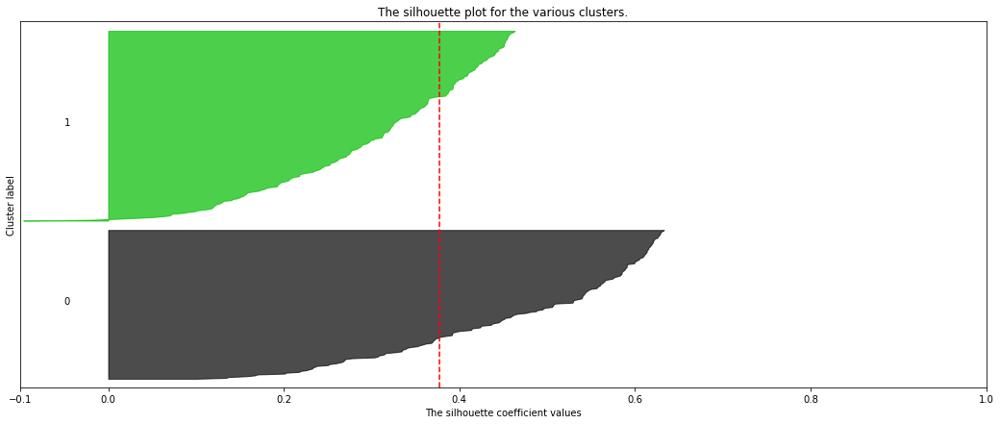

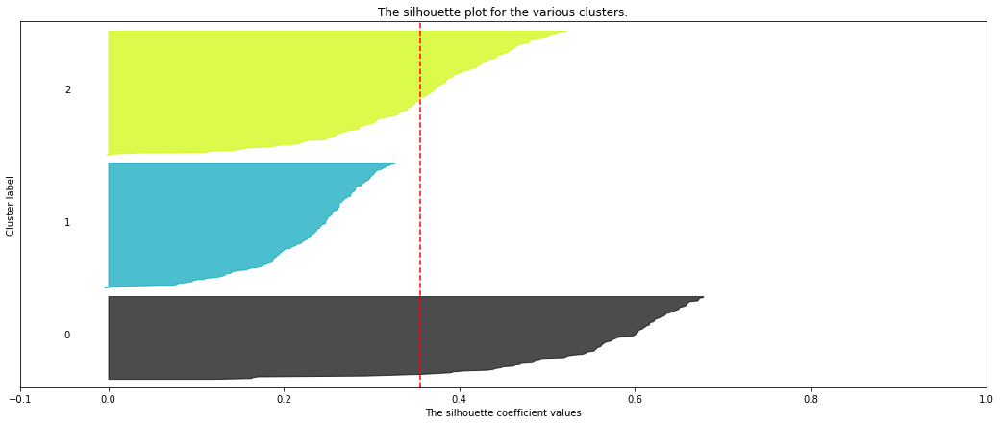

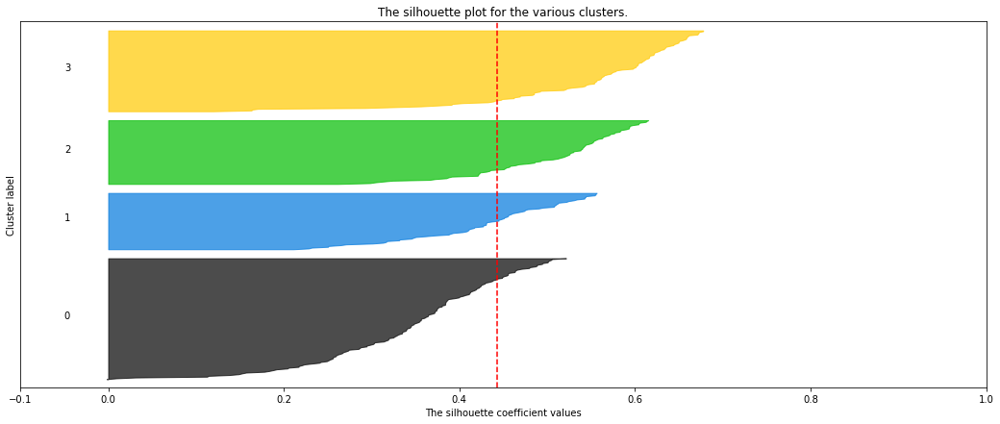

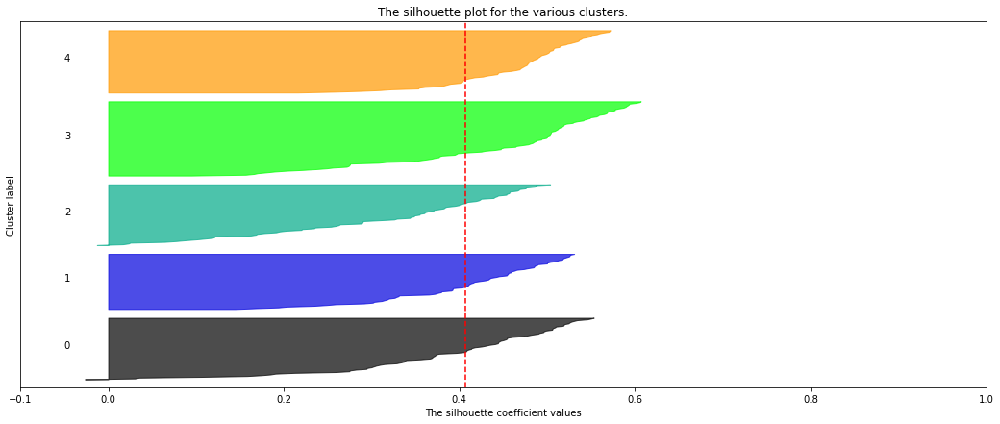

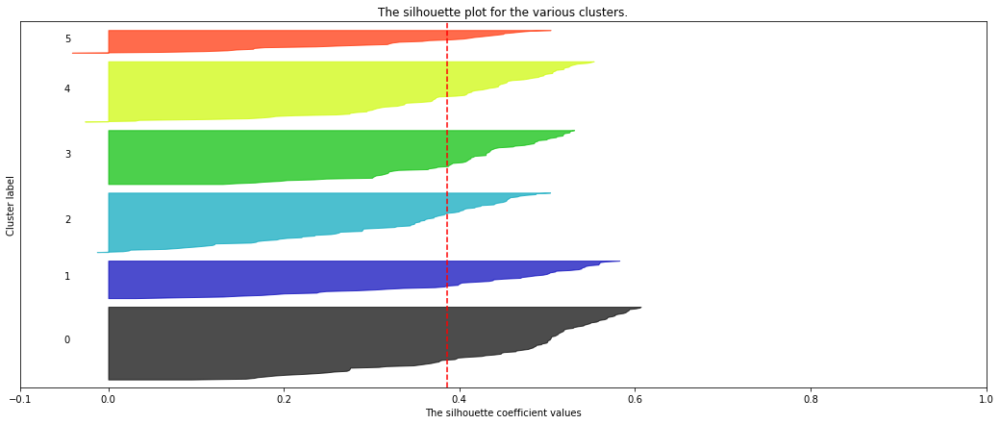

In [37]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from sklearn.metrics import silhouette_samples, silhouette_score
#below mentioned code is derived from https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
#Since there is elbow observed - we can choose to check silhoutte graph for k under 6
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(autoMobileDataFrame1_Scaled) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(autoMobileDataFrame1_Scaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(autoMobileDataFrame1_Scaled, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", round(silhouette_avg,2))

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(autoMobileDataFrame1_Scaled, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

**Observation**:

    With k value as 4 (clusters), the silhouette coefficient values for each cluster is above average silhouette score.
    Thickness of each silhouette plot is almost uniform and hence can be decided the value of k as 4 is optimal.

###### Hierarchical clustering

In [38]:
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist  
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage

dataAttr=autoMobileDataFrame1_Scaled.iloc[:,:]

model = AgglomerativeClustering(n_clusters=4, affinity='euclidean',  linkage='complete')
model.fit(autoMobileDataFrame1_Scaled)
dataAttr['labels'] = model.labels_
dataClust = dataAttr.groupby(['labels'])

In [39]:
for i in ['complete','ward','average']:
    Z = linkage(autoMobileDataFrame1_Scaled, metric='euclidean', method=i)
    c, coph_dists = cophenet(Z , pdist(autoMobileDataFrame1_Scaled))
    print(i, " ", round(c,2))

complete   0.79
ward   0.8
average   0.82


    There are different methods of finding distance between clusters, here we have used 3 methods and results are having slight variation and are acceptable.
    
    The cophenetic correlation for a cluster tree is defined as the linear correlation coefficient between the cophenetic distances obtained from the tree, and the original distances (or dissimilarities) used to construct the tree.

    The cophenetic distance between two observations is represented in a dendrogram by the height of the link at which those two observations are first joined. That height is the distance between the two subclusters that are merged by that link.

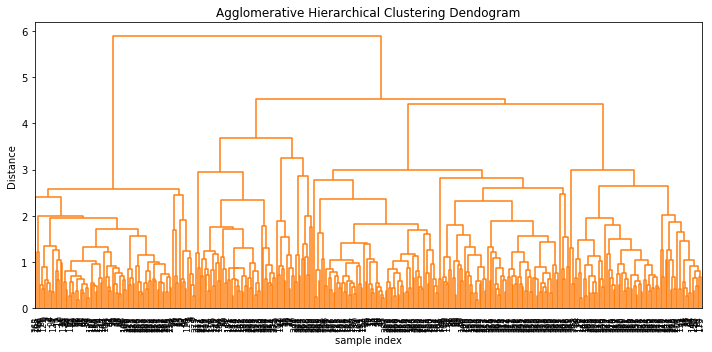

In [40]:
plt.figure(figsize=(10, 5))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90.,color_threshold = 40, leaf_font_size=8. )
plt.tight_layout()

**Observations**: **Optimal clusters**
    
    To find optimal number of clusters, we have to look for the clusters with the longest branches, the distance/length determines how good the clusters are. This is just rule of thumb saying look for the clusters with the longest ‘branches’, the shorter they are, the more similar they are to following ‘twigs’ and ‘leaves’. 
    
    Here we can observe that by drawing a line close to distance 3 - we will have 4 clusters.

- Share your insights about the difference in using these two methods

| K-means clustering | Hierarchical  Clustering |
| ---- | -----| 
| k-means algorithm iteratively tries to find the centroids.  | Hierarchical methods can be  either divisive or agglomerative. |
| k-means algorithm is parameterized by the value k. | In Hierarchical, it is not mandatory to mention number of clusters |
| In K means, users of algorithm needs to k value before using algorithm properly | In hierarchical clustering  users can stop at any number of clusters by interpreting  the dendrogram. |
| median or mean is used as a cluster centre to represent each cluster. | Agglomerative sequentially combine similar clusters until only one cluster is obtained.|
| For every iteration of k means there is a chance of a point shifting cluster | In Hierarchical clustering, the clusters are formed based on the distance calculated and shifting of points is not observed |
|K-Means is implicitly based on pairwise Euclidean distances between data points |  Hierarchical clustering, different metric can be used to find the distance|

**Answer below questions based on outcomes of using ML based methods.**

    • Mention how many optimal clusters are present in the data and what could be the possible reason behind it.
    • Use linear regression model on different clusters separately and print the coefficients of the models individually
    • How using different models for different clusters will be helpful in this case and how it will be different than using one single model without clustering? Mention how it impacts performance and prediction.

    Applying K means with determined number of clusters and preparing data for Linear regression

In [41]:
autoMobileDataFrame_ln =  autoMobileDataFrame1_Scaled[['mpg','cyl','disp','hp','wt','acc','yr','origin_america','origin_asia','origin_europe']].copy()

In [42]:
autoMobileDataFrame_ln

,mpg,cyl,disp,hp,wt,acc,yr,origin_america,origin_asia,origin_europe
0,-0.706439,1.498191,1.090604,0.673118,0.630870,-1.295498,-1.627426,0.773559,-0.497643,-0.461968
1,-1.090751,1.498191,1.503514,1.589958,0.854333,-1.477038,-1.627426,0.773559,-0.497643,-0.461968
2,-0.706439,1.498191,1.196232,1.197027,0.550470,-1.658577,-1.627426,0.773559,-0.497643,-0.461968
3,-0.962647,1.498191,1.061796,1.197027,0.546923,-1.295498,-1.627426,0.773559,-0.497643,-0.461968
4,-0.834543,1.498191,1.042591,0.935072,0.565841,-1.840117,-1.627426,0.773559,-0.497643,-0.461968
...,...,...,...,...,...,...,...,...,...,...
393,0.446497,-0.856321,-0.513026,-0.479482,-0.213324,0.011586,1.621983,0.773559,-0.497643,-0.461968
394,2.624265,-0.856321,-0.925936,-1.370127,-0.993671,3.279296,1.621983,-1.292726,-0.497643,2.164651
395,1.087017,-0.856321,-0.561039,-0.531873,-0.798585,-1.440730,1.621983,0.773559,-0.497643,-0.461968
396,0.574601,-0.856321,-0.705077,-0.662850,-0.408411,1.100822,1.621983,0.773559,-0.497643,-0.461968


In [43]:
model=KMeans(n_clusters=4, max_iter=500, n_init=1, verbose=0, random_state=100)
model.fit(autoMobileDataFrame1_Scaled)
prediction=model.predict(autoMobileDataFrame1_Scaled)

# autoMobileDataFrame_labels = autoMobileDataFrame.copy()
autoMobileDataFrame11['cluster'] = model.labels_
autoMobileDataFrame_ln['cluster'] = model.labels_
zeroClusters_autoMobileDataFrame_ln = autoMobileDataFrame1_Scaled[autoMobileDataFrame_ln.cluster == 0]
oneClusters_autoMobileDataFrame_ln = autoMobileDataFrame1_Scaled[autoMobileDataFrame_ln.cluster == 1]
twoClusters_autoMobileDataFrame_ln = autoMobileDataFrame1_Scaled[autoMobileDataFrame_ln.cluster == 2]
threeClusters_autoMobileDataFrame_ln = autoMobileDataFrame1_Scaled[autoMobileDataFrame_ln.cluster == 3]

In [44]:
zeroClusters_autoMobileDataFrame_ln.shape

(97, 11)

In [45]:
oneClusters_autoMobileDataFrame_ln.shape

(152, 11)

In [46]:
twoClusters_autoMobileDataFrame_ln.shape

(79, 11)

In [47]:
threeClusters_autoMobileDataFrame_ln.shape

(70, 11)

In [48]:
# # This cell is required
autoMobileDataFrame_ln.groupby('cluster').mean()

,mpg,cyl,disp,hp,wt,acc,yr,origin_america,origin_asia,origin_europe
cluster,,,,,,,,,,
0,-1.147143,1.486055,1.480250,1.500840,1.379989,-1.069791,-0.655953,0.773559,-0.497643,-0.461968
1,0.012039,-0.182496,-0.119162,-0.342645,-0.122354,0.364871,0.241341,0.773559,-0.497643,-0.461968
2,0.888537,-0.796713,-0.871117,-0.640965,-0.885809,0.219322,0.388030,-1.292726,2.009471,-0.461968
3,0.560693,-0.763822,-0.809334,-0.612330,-0.646890,0.442612,-0.053010,-1.292726,-0.497643,2.164651


In [49]:
autoMobileDataFrame_ln

,mpg,cyl,disp,hp,wt,acc,yr,origin_america,origin_asia,origin_europe,cluster
0,-0.706439,1.498191,1.090604,0.673118,0.630870,-1.295498,-1.627426,0.773559,-0.497643,-0.461968,0
1,-1.090751,1.498191,1.503514,1.589958,0.854333,-1.477038,-1.627426,0.773559,-0.497643,-0.461968,0
2,-0.706439,1.498191,1.196232,1.197027,0.550470,-1.658577,-1.627426,0.773559,-0.497643,-0.461968,0
3,-0.962647,1.498191,1.061796,1.197027,0.546923,-1.295498,-1.627426,0.773559,-0.497643,-0.461968,0
4,-0.834543,1.498191,1.042591,0.935072,0.565841,-1.840117,-1.627426,0.773559,-0.497643,-0.461968,0
...,...,...,...,...,...,...,...,...,...,...,...
393,0.446497,-0.856321,-0.513026,-0.479482,-0.213324,0.011586,1.621983,0.773559,-0.497643,-0.461968,1
394,2.624265,-0.856321,-0.925936,-1.370127,-0.993671,3.279296,1.621983,-1.292726,-0.497643,2.164651,3
395,1.087017,-0.856321,-0.561039,-0.531873,-0.798585,-1.440730,1.621983,0.773559,-0.497643,-0.461968,1
396,0.574601,-0.856321,-0.705077,-0.662850,-0.408411,1.100822,1.621983,0.773559,-0.497643,-0.461968,1


In [50]:
autoMobileDataFrame11.groupby('cluster').mean()

,mpg,cyl,disp,hp,wt,acc,yr
cluster,,,,,,,
0,14.559794,7.979381,347.577320,161.597938,4137.587629,12.621649,73.587629
1,23.608553,5.144737,181.016447,91.223684,2866.940789,16.573026,76.901316
2,30.450633,4.101266,102.708861,79.835443,2221.227848,16.172152,77.443038
3,27.891429,4.157143,109.142857,80.928571,2423.300000,16.787143,75.814286


In [51]:
autoMobileDataFrame11

,mpg,cyl,disp,hp,wt,acc,yr,origin,cluster
0,18.0,8,307.0,130.0,3504,12.0,70,america,0
1,15.0,8,350.0,165.0,3693,11.5,70,america,0
2,18.0,8,318.0,150.0,3436,11.0,70,america,0
3,16.0,8,304.0,150.0,3433,12.0,70,america,0
4,17.0,8,302.0,140.0,3449,10.5,70,america,0
...,...,...,...,...,...,...,...,...,...
393,27.0,4,140.0,86.0,2790,15.6,82,america,1
394,44.0,4,97.0,52.0,2130,24.6,82,europe,3
395,32.0,4,135.0,84.0,2295,11.6,82,america,1
396,28.0,4,120.0,79.0,2625,18.6,82,america,1


In [52]:
dfScore = pd.DataFrame()
dfCoeff = pd.DataFrame()
for i in [0,1,2,3]:
    zeroClusters_autoMobileDataFrame_ln = autoMobileDataFrame_ln[autoMobileDataFrame_ln.cluster == i]
    zeroClusters_autoMobileDataFrame_ln_MPG = autoMobileDataFrame11[autoMobileDataFrame11.cluster == i]
    
    df = zeroClusters_autoMobileDataFrame_ln#.apply(zscore)
    X = df.drop(['mpg','cluster','origin_america','origin_asia','origin_europe'], axis=1)
    # the dependent variable
    y = zeroClusters_autoMobileDataFrame_ln_MPG[['mpg']]
    # Split X and y into training and test set in 70:30 ratio
    from sklearn.model_selection import train_test_split
    from sklearn.linear_model import LinearRegression
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=100)
    regression_model = LinearRegression()
    regression_model.fit(X_train, y_train)
    
    
    score_coll = ['TrainScore','TestScore','Cluster']
    score_listt = []
    score_listt.append(regression_model.score(X_train, y_train))
    score_listt.append(regression_model.score(X_test, y_test))
    score_listt.append(i)
    
    dfRegScore = pd.DataFrame([score_listt], columns = score_coll) 
    
    
    listt = []
    coll = []
    for idx, col_name in enumerate(X_train.columns):
        listt.append(regression_model.coef_[0][idx])
        coll.append(col_name)
    listt.append(i)
    coll.append("cluster")
        
    dfOne = pd.DataFrame([listt], columns = coll) 
    
    
    dfScore = dfScore.append(dfRegScore)
    dfCoeff = dfCoeff.append(dfOne)
    

In [53]:
dfCoeff

,cyl,disp,hp,wt,acc,yr,cluster
0,-0.554536,-0.741114,-1.110195,-0.727444,-1.793581,1.376908,0
0,0.345629,0.520849,-3.307616,-5.570178,-1.229138,2.837566,1
0,0.417177,8.654614,0.993959,-12.536556,1.389996,3.488384,2
0,-1.136775,-4.330119,-1.579218,-3.988320,1.336740,3.670497,3


In [54]:
dfScore

,TrainScore,TestScore,Cluster
0,0.622603,0.332287,0
0,0.805475,0.783581,1
0,0.714556,0.625107,2
0,0.686048,0.772374,3


In [55]:
## Regression on Main dataset
autoMobileDataFrame

#Scaling the data.
autoMobileDataFrame_Dummies = pd.get_dummies(autoMobileDataFrame11, columns=['origin'])
autoMobileDataFrame_Dummies_Scaled = autoMobileDataFrame_Dummies.apply(zscore)

df = autoMobileDataFrame_Dummies_Scaled
# X = df.drop(['mpg'], axis=1)
X = df.drop(['mpg','cluster','origin_america','origin_asia','origin_europe'], axis=1)
# the dependent variable
y = df[['mpg']]
# Split X and y into training and test set in 70:30 ratio
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=15)
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

score_coll = ['TrainScore','TestScore','Cluster']
score_listt = []
score_listt.append(regression_model.score(X_train, y_train))
score_listt.append(regression_model.score(X_test, y_test))
score_listt.append(99)

dfRegScore = pd.DataFrame([score_listt], columns = score_coll) 

listt = []
coll = []
for idx, col_name in enumerate(X_train.columns):
    listt.append(regression_model.coef_[0][idx])
    coll.append(col_name)
listt.append(99)
coll.append("cluster")
    
dfOne = pd.DataFrame([listt], columns = coll) 

dfScore = dfScore.append(dfRegScore)
dfCoeff = dfCoeff.append(dfOne)
    

In [56]:
dfCoeff['cluster'] = dfCoeff['cluster'].replace({0: 'Cluster One', 1: 'Cluster Two', 2: 'Cluster Three', 3: 'Cluster Four', 99: 'Main DS'})
dfCoeff

,cyl,disp,hp,wt,acc,yr,cluster
0,-0.554536,-0.741114,-1.110195,-0.727444,-1.793581,1.376908,Cluster One
0,0.345629,0.520849,-3.307616,-5.570178,-1.229138,2.837566,Cluster Two
0,0.417177,8.654614,0.993959,-12.536556,1.389996,3.488384,Cluster Three
0,-1.136775,-4.330119,-1.579218,-3.988320,1.336740,3.670497,Cluster Four
0,-0.033736,0.027704,0.069283,-0.754389,0.046964,0.364552,Main DS


In [57]:
# dfScore['Cluster'] = dfScore.replace({0: 'Cluster One', 1: 'Cluster Two', 2: 'Cluster Three', 3: 'Cluster Four', 99: 'Main DS'})
dfScore1 = dfScore.copy()
dfScore1 = dfScore1.replace({0: 'Cluster One', 1: 'Cluster Two', 2: 'Cluster Three', 3: 'Cluster Four', 99: 'Main DS'})
dfScore1

,TrainScore,TestScore,Cluster
0,0.622603,0.332287,Cluster One
0,0.805475,0.783581,Cluster Two
0,0.714556,0.625107,Cluster Three
0,0.686048,0.772374,Cluster Four
0,0.811606,0.800385,Main DS


    As compared Main dataset with clustered dataset, it has negative impact!. Perhaps gathering more data would help in solving this problem. Expectation is to have better score of LinearRegression upon applying clustering

**Improvisation**:

- Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points collected by the company to perform a better data analysis in future

    Other Parameters can be collected in the dataset so as to predict the mpg column better. Fuel Injector , aerodynamic drag indicator, Oil Usage will be helpful if collected.
    Usage of cargo racks on top of car, this info would also be helpful if collected. If users use this rack, increase aerodynamic drag and lower fuel economy.
    Towing a trailer or carrying excessive weight decreases fuel economy. Indicator of this facility would also be helpful.
    Using 4-wheel drive reduces fuel economy. Four-wheel drive vehicles are tested in 2-wheel drive. Engaging all four wheels makes the engine work harder and increases transfer case and differential losses.
    Indicator of 2-wheel or 4-wheel drive will also be helpful.
    Number of gears will also be helpful in determination of mpg of the vehicle.

## Part Two

**DOMAIN**: Manufacturing 

**CONTEXT**: Company X curates and packages wine across various vineyards spread throughout the country.

**DATA DESCRIPTION**: The data concerns the chemical composition of the wine and its respective quality.
- Attribute Information: 

    1. A, B, C, D: specific chemical composition measure of the wine
    2. Quality: quality of wine
    
**PROJECT OBJECTIVE**: Goal is to build a synthetic data generation model using the existing data provided by the company.


###### Steps and tasks: 

    1. Design a synthetic data generation model which can impute values [Attribute: Quality] wherever empty the company has missed recording the data

In [58]:
#importing required libraries
import numpy as np   
import pandas as pd    
import matplotlib.pyplot as plt 
%matplotlib inline 
from sklearn.cluster import KMeans
from scipy.stats import zscore
from scipy.spatial.distance import cdist

In [59]:
#reading the data 
manufacturingDataRaw = pd.read_excel("./Part2 - Company.xlsx")

In [60]:
print("Number of rows in the dataset :: ", manufacturingDataRaw.shape[0], "  , Number of columns in dataset ::" , manufacturingDataRaw.shape[1])

Number of rows in the dataset ::  61   , Number of columns in dataset :: 5


In [61]:
#Checking of there are any null values
manufacturingDataRaw.isnull().sum()

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

    There are 18 rows having Quality as null or NAN which has to be imputed

In [62]:
manufacturingDataRaw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   A        61 non-null     int64 
 1   B        61 non-null     int64 
 2   C        61 non-null     int64 
 3   D        61 non-null     int64 
 4   Quality  43 non-null     object
dtypes: int64(4), object(1)
memory usage: 2.5+ KB


In [63]:
#Scaling before clustering data
manufacturingData_Columns = manufacturingDataRaw[['A', 'B', 'C', 'D']]
manufacturingData_scaled = manufacturingData_Columns.apply(zscore)

In [64]:
#Using K means algorithm with 2 clusters to find the values for missing/NAN values in Quality column
model=KMeans(n_clusters=2, max_iter=100, n_init=1, verbose=0, random_state=42)
model.fit(manufacturingData_scaled)
prediction=model.predict(manufacturingData_scaled)

In [65]:
#adding label column
manufacturingDataRaw['cluster'] = model.labels_

In [66]:
manufacturingDataRaw['Quality'] = np.select(
    [
        manufacturingDataRaw['cluster'] == 0, 
        manufacturingDataRaw['cluster'] == 1
    ], 
    [
        'Quality A', 
        'Quality B'
    ], 
    default='Unknown'
)

In [67]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(manufacturingDataRaw)

      A    B    C    D    Quality  cluster
0    47   27   45  108  Quality A        0
1   174  133  134  166  Quality B        1
2   159  163  135  131  Quality B        1
3    61   23    3   44  Quality A        0
4    59   60    9   68  Quality A        0
5   153  140  154  199  Quality B        1
6    34   28   78   22  Quality A        0
7   191  144  143  154  Quality B        1
8   160  181  194  178  Quality B        1
9   145  178  158  141  Quality B        1
10   76   94  107   37  Quality A        0
11  138  200  153  192  Quality B        1
12   27  106   57   37  Quality A        0
13   45   76   56   57  Quality A        0
14  186  142  146  174  Quality B        1
15  196  145  166  132  Quality B        1
16    4   61   72   98  Quality A        0
17   96  109   75   34  Quality A        0
18  167  171  163  191  Quality B        1
19  196  178  165  177  Quality B        1
20  159  181  142  166  Quality B        1
21    5  100   32  110  Quality A        0
22    3   6

In [68]:
#Cross checking the labeling done above

D:\anaconda\envs\gl\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  f"KMeans is known to have a memory leak on Windows "


Text(0.5, 1.0, 'Selecting k with the Elbow Method')

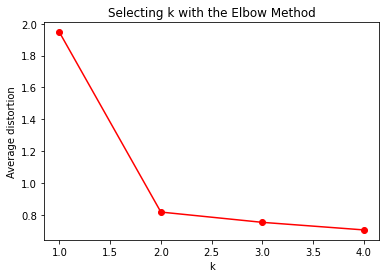

In [69]:
dfKM = manufacturingDataRaw[['A','B','C','D']]
dfKM_scaled = dfKM.apply(zscore)
clusters=range(1,5)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(dfKM_scaled)
    prediction=model.predict(dfKM_scaled)
    meanDistortions.append(sum(np.min(cdist(dfKM_scaled, model.cluster_centers_, 'euclidean'), axis=1)) / dfKM_scaled.shape[0])


plt.plot(clusters, meanDistortions, 'or-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

    Selected number of k values are fine and acceptable

D:\anaconda\envs\gl\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  f"KMeans is known to have a memory leak on Windows "


[244.00000000000006, 45.52255176619497, 38.362555855428184, 33.959527999277704]


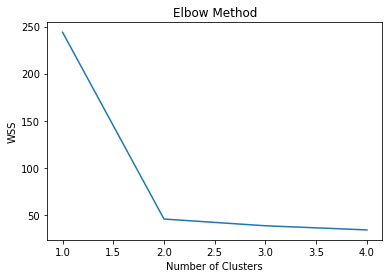

In [70]:
#calculatint the within sum of squares
wss =[] 
for i in range(1,5):
    model = KMeans(n_clusters=i)
    model.fit(dfKM_scaled)
    wss.append(model.inertia_)
print(wss)
# using Elbow-method :: plotting the WSS against the number of cluster to come up with optimal number of clusters
plt.plot(range(1,5), wss);
plt.title('Elbow Method');
plt.xlabel("Number of Clusters")
plt.ylabel("WSS");

    Even WSS shows same result.

In [71]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(manufacturingDataRaw)

      A    B    C    D    Quality  cluster
0    47   27   45  108  Quality A        0
1   174  133  134  166  Quality B        1
2   159  163  135  131  Quality B        1
3    61   23    3   44  Quality A        0
4    59   60    9   68  Quality A        0
5   153  140  154  199  Quality B        1
6    34   28   78   22  Quality A        0
7   191  144  143  154  Quality B        1
8   160  181  194  178  Quality B        1
9   145  178  158  141  Quality B        1
10   76   94  107   37  Quality A        0
11  138  200  153  192  Quality B        1
12   27  106   57   37  Quality A        0
13   45   76   56   57  Quality A        0
14  186  142  146  174  Quality B        1
15  196  145  166  132  Quality B        1
16    4   61   72   98  Quality A        0
17   96  109   75   34  Quality A        0
18  167  171  163  191  Quality B        1
19  196  178  165  177  Quality B        1
20  159  181  142  166  Quality B        1
21    5  100   32  110  Quality A        0
22    3   6

- As we observe in above cell the missing values are imputed.

## Part Three

### DOMAIN: Automobile 

**CONTEXT:** The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. 
    The vehicle may be viewed from one of many different angles.

**DATA DESCRIPTION:**        
    The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars.
    
    All the features are numeric i.e. geometric features extracted from the silhouette.

**PROJECT OBJECTIVE:**    
    Apply dimensionality reduction technique – PCA and train a model using principal components instead of training the model using just the raw data

In [72]:
#Importing required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn import metrics
from scipy.stats import zscore

###### Data: Import, clean and pre-process the data

In [73]:
#reading data and viewing few samples of data
vehicleDfRaw = pd.read_csv('Part3 - vehicle.csv')
vehicleDfRaw.sample(3)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
416,89,44.0,70.0,158.0,64.0,6,141.0,47.0,18.0,143,164.0,299.0,173.0,66.0,9.0,11.0,193.0,199,bus
21,84,37.0,53.0,121.0,59.0,5,123.0,55.0,17.0,125,141.0,221.0,133.0,82.0,7.0,1.0,179.0,183,van
437,84,40.0,71.0,131.0,55.0,7,150.0,45.0,19.0,134,167.0,330.0,165.0,80.0,12.0,1.0,180.0,186,car


In [74]:
#check the data types, size of dataframe in mem
vehicleDfRaw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

    Only class column is of object data type and rest are either float or int.

In [75]:
vehicleDfRaw.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


In [76]:
meanMedianComparison = vehicleDfRaw.describe().T[['mean','50%']]
meanMedianComparison['mean']-meanMedianComparison['50%']

compactness                     0.678487
circularity                     0.828775
distance_circularity            2.110451
radius_ratio                    1.888095
pr.axis_aspect_ratio            0.678910
max.length_aspect_ratio         0.567376
scatter_ratio                  11.901775
elongatedness                  -2.066272
pr.axis_rectangularity          0.582444
max.length_rectangularity       1.998818
scaled_variance                 9.631079
scaled_variance.1              75.994076
scaled_radius_of_gyration       1.209716
scaled_radius_of_gyration.1     0.947743
skewness_about                  0.364286
skewness_about.1                1.602367
skewness_about.2                0.919527
hollows_ratio                  -1.367612
dtype: float64

- Here column radius_ratio, pr.axis_aspect_ratio , max.length_aspect_ratio , scaled_variance.1, scaled_radius_of_gyration.1 columns seems to have outlier, we need to check the data using boxplot. The 75% value and max are having bit more difference  than expected.
- Mean and median are closed each other in terms of value for compactness, circularity,  distance_circularity, radius_ratio, pr.axis_aspect_ratio, max.length_aspect_ratio, pr.axis_rectangularity, max.length_rectangularity, scaled_radius_of_gyration, scaled_radius_of_gyration.1 , skewness_about, skewness_about.1, skewness_about.2 so these data are normally distributed.
- Mean is greater than Median for scatter_ratio, scaled_variance,  scaled_variance.1 so the data is right skewed for these columns.

In [77]:
#check if the values are null
vehicleDfRaw.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

- There are null values observed for few of the column - for all these we need replace null values with median

In [78]:
#convert class column as category
vehicleDfRaw['class']=vehicleDfRaw['class'].astype('category')

In [79]:
#Replacing the missing values by median - for all column except class column
for i in vehicleDfRaw.columns[:17]:
    median_value = vehicleDfRaw[i].median()
    vehicleDfRaw[i] = vehicleDfRaw[i].fillna(median_value)

In [80]:
vehicleDfRaw.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

- No more null values observed.

**EDA and visualisation**: 

- Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods.
- For example: Use your best analytical approach to build this report. Even you can mix match columns to create new columns which can be used for better analysis. Create your own features if required. Be highly experimental and analytical here to find hidden patterns.

D:\anaconda\envs\gl\lib\site-packages\ipykernel_launcher.py:14: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


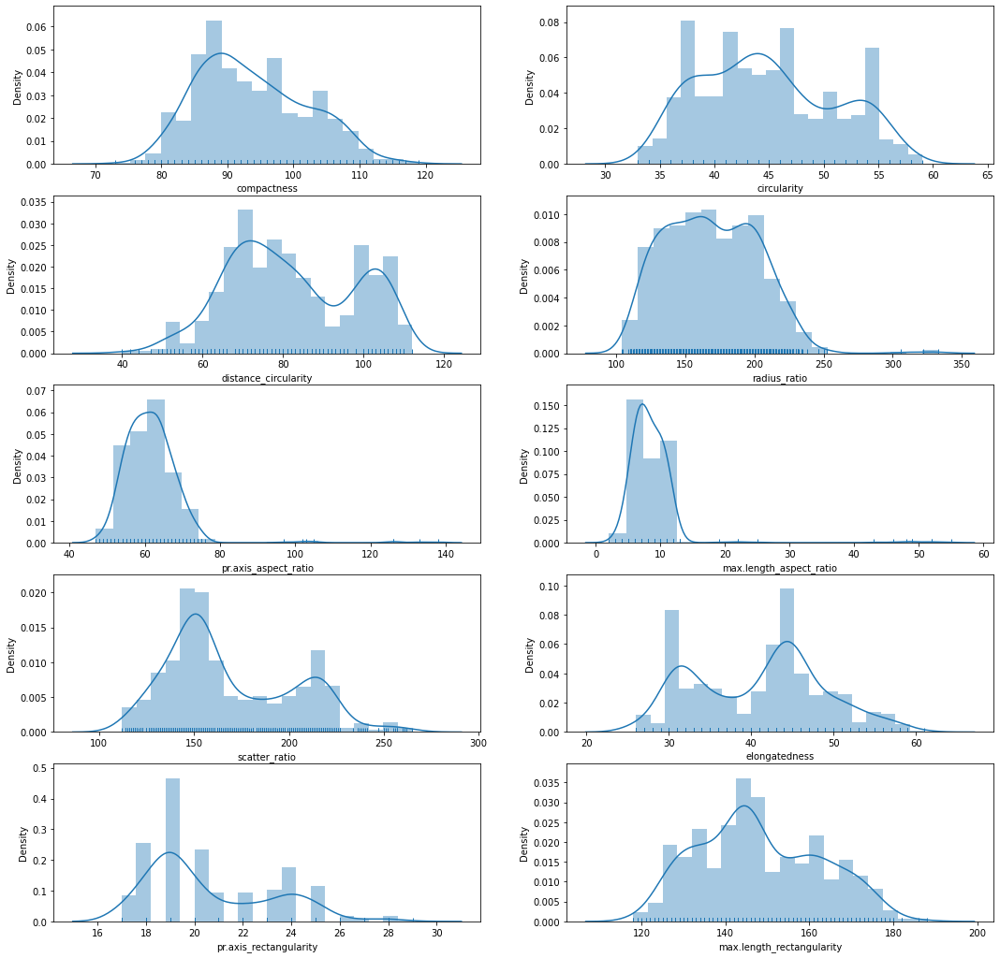

In [81]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig, ax = plt.subplots(5,2, figsize=(18,18))
listOfColumns = vehicleDfRaw.columns[:10]
len_listOfColumns = len(listOfColumns)
index = 0

for j in range(len(ax)):
    for i in range(len(ax[j])):
        if(index < len_listOfColumns):
            ax[j][i] = sns.distplot(vehicleDfRaw[listOfColumns[index]],bins=20,rug=True,ax = ax[j][i]);            
            index = index + 1 
fig.show()

- Bimodality is observed in  scatter_ratio, elongatedness, pr.axis_rectangularity, max.length_rectangularity, circularity, distance_circularity.
- Normal distribution observed in pr.axis_aspect_ratio, max.length_aspect_ratio, compactness columns.
- Right Skew data observed in circularity column.


D:\anaconda\envs\gl\lib\site-packages\ipykernel_launcher.py:14: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


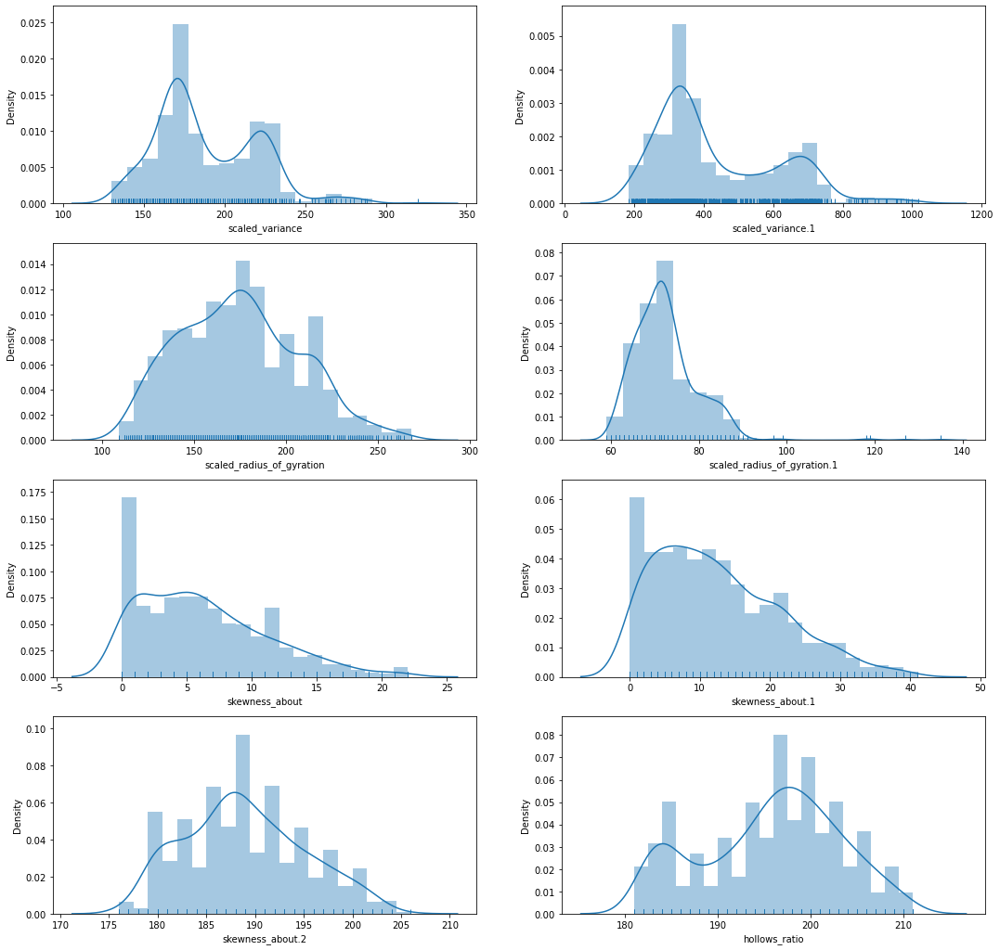

In [82]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig, ax = plt.subplots(4,2, figsize=(18,18))
listOfColumns = vehicleDfRaw.columns[10:18]
len_listOfColumns = len(listOfColumns)
index = 0

for j in range(len(ax)):
    for i in range(len(ax[j])):
        if(index < len_listOfColumns):
            ax[j][i] = sns.distplot(vehicleDfRaw[listOfColumns[index]],bins=20,rug=True,ax = ax[j][i]);            
            index = index + 1 
fig.show()

- Bimodality is observed in  hollows_ratio, scaled_variance , scaled_variance.1.
- Normal distribution observed in skewness_about.2, scaled_radius_of_gyration, scaled_radius_of_gyration.1 columns.
- Right Skew data observed in skewness_about , skewness_about.1 column.


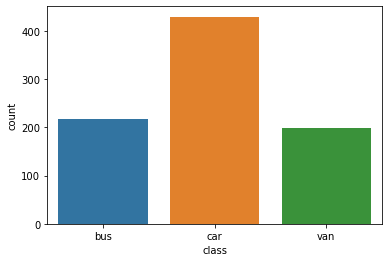

In [83]:
#check distribution of class column
sns.countplot(vehicleDfRaw['class']);

- Records with class column value as car is having more count

33 percentile :  89.0
66 percentile :  97.0


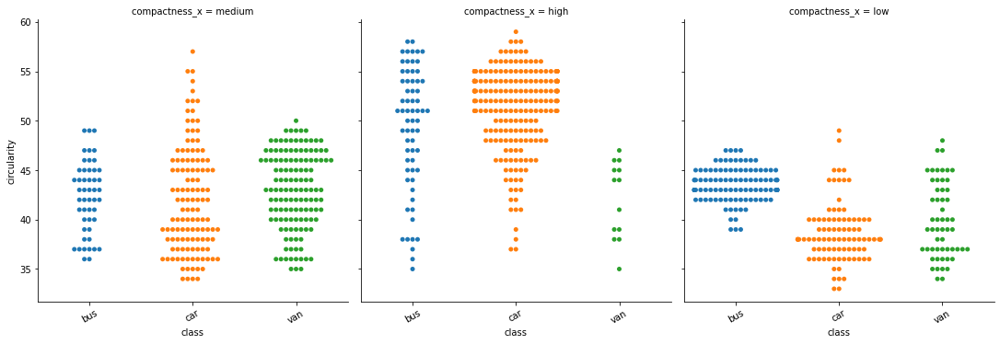

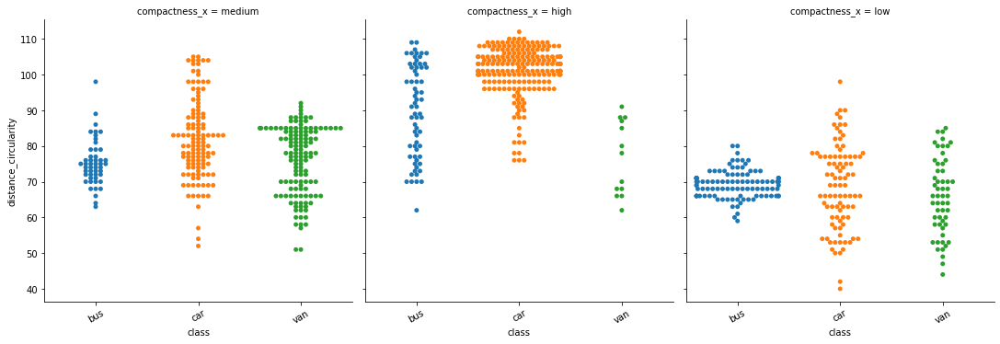

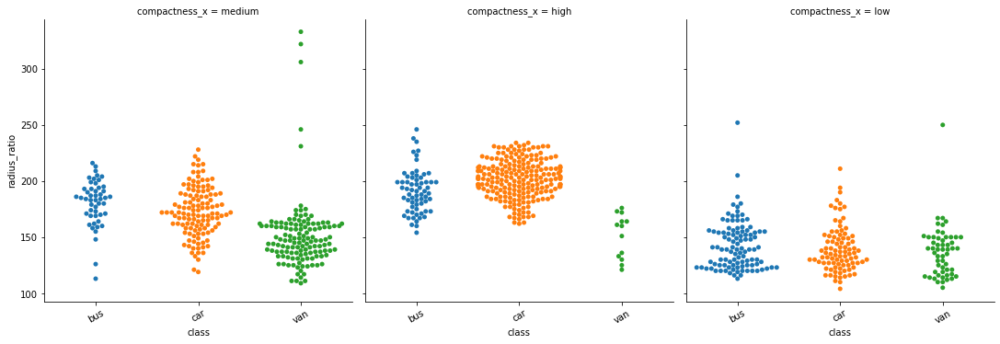

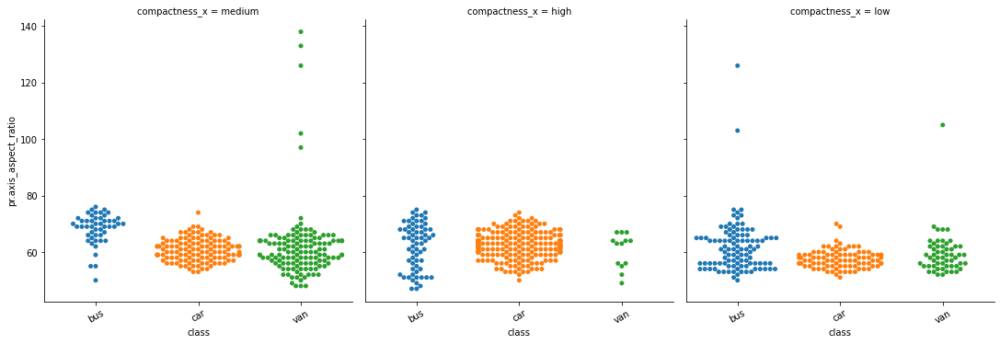

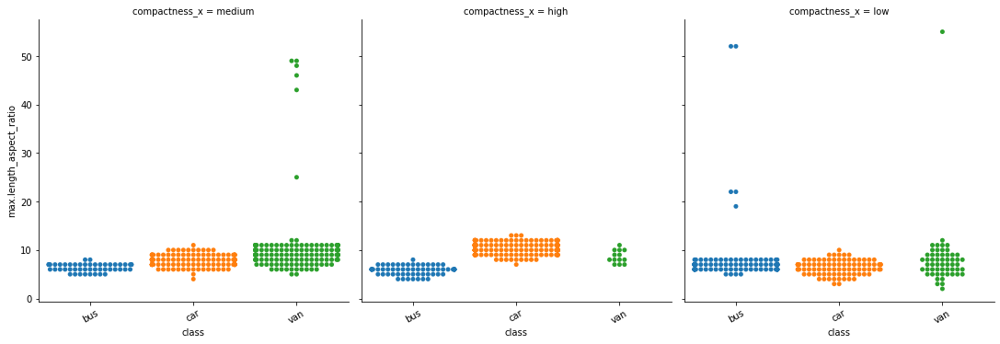

...

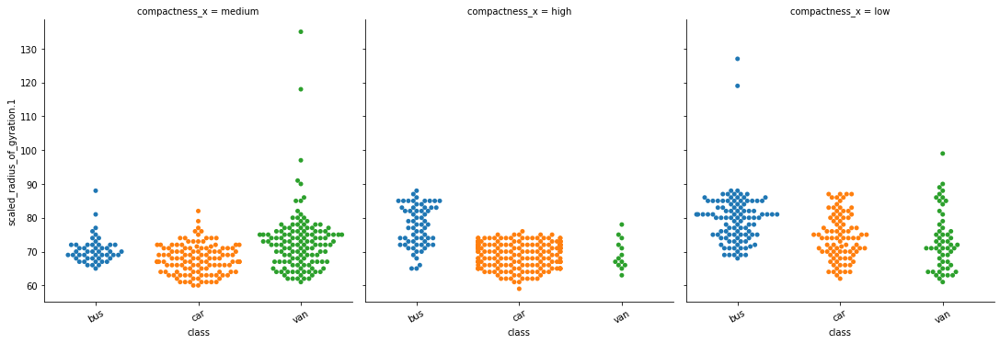

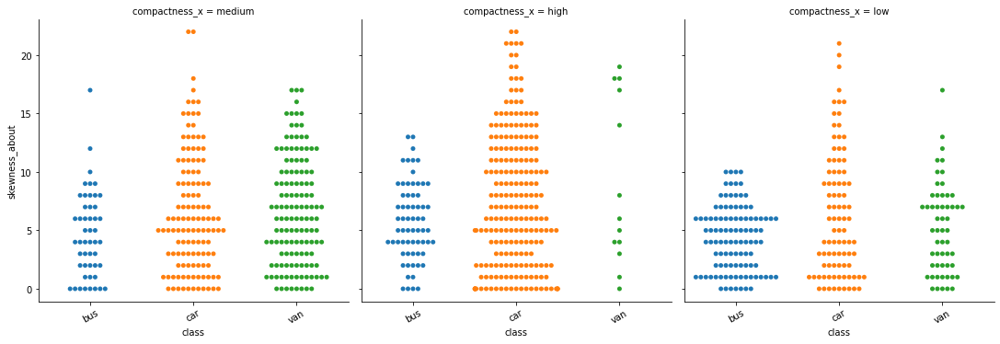

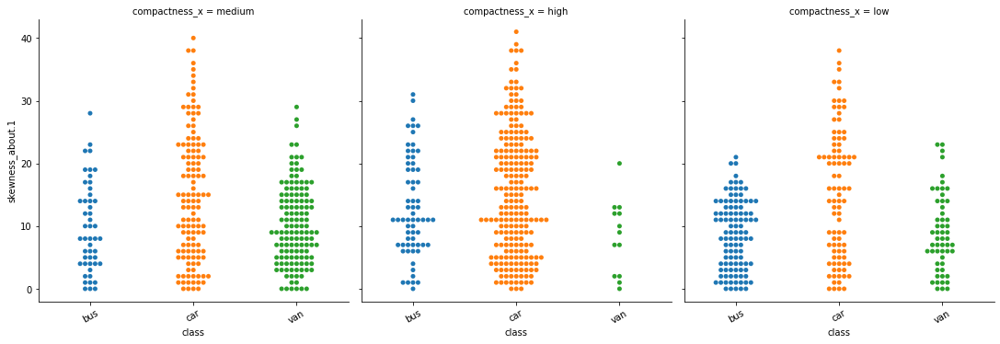

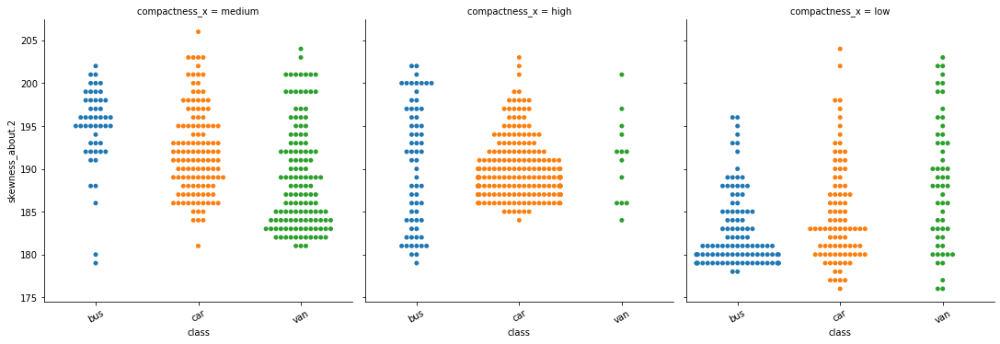

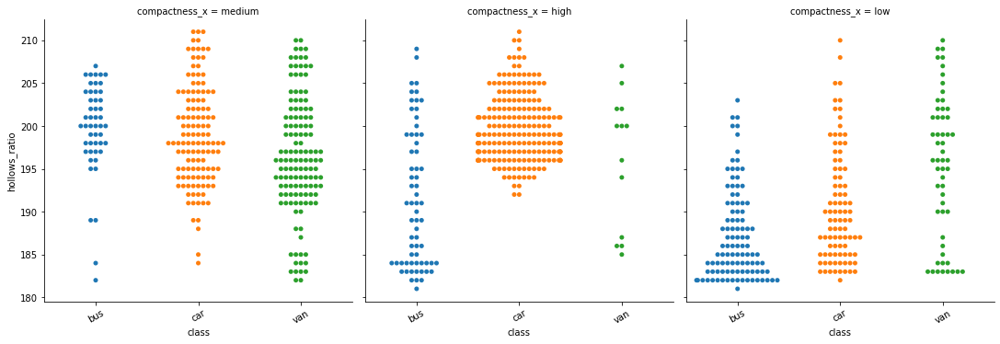

In [84]:
import warnings
warnings.simplefilter("ignore", UserWarning)

quant33 = np.percentile(vehicleDfRaw['compactness'],33)
quant66 = np.percentile(vehicleDfRaw['compactness'],66)

print("33 percentile : ",quant33)
print("66 percentile : ",quant66)

def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawCompactnessCat = vehicleDfRaw.compactness.apply(categoriseData)
vehicleDfRawCompactnessGraph = pd.merge(vehicleDfRawCompactnessCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    g = sns.catplot(x="class",y = i ,
               col="compactness_x",
               data=vehicleDfRawCompactnessGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the compactness column
- The compactness column are divided in 3 groups :: 
        
        below value 89  is considered as low
        value between  89 and 97 is considered as medium
        above value 97 are considered as High

- When we observe data the class car and bus have longer distribution against other variables.
- For class van, longer distribution observed for medium compactness when compared to other type of compactness

33 percentile :  42.0
66 percentile :  47.0


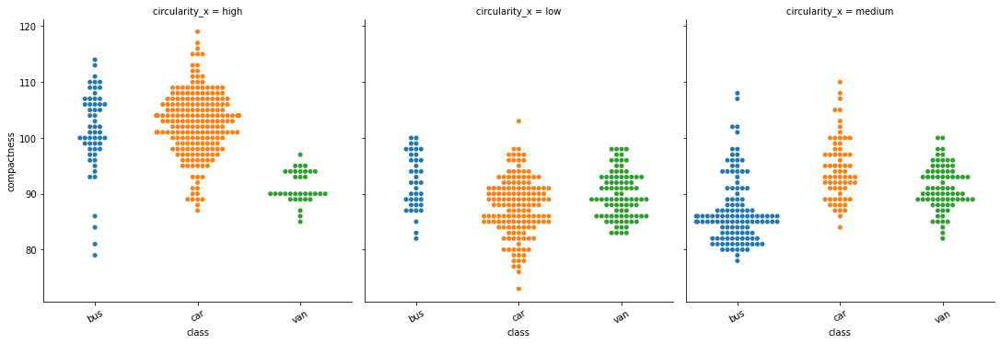

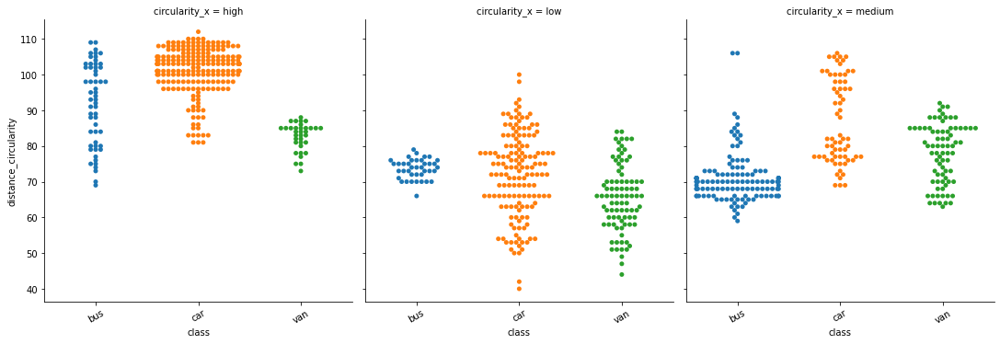

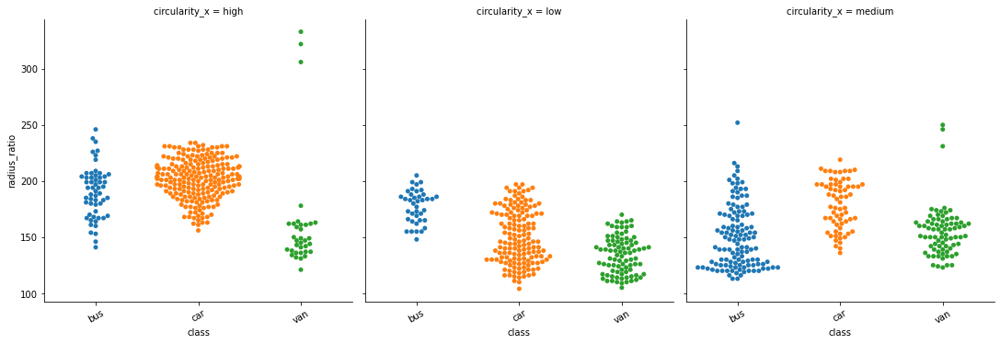

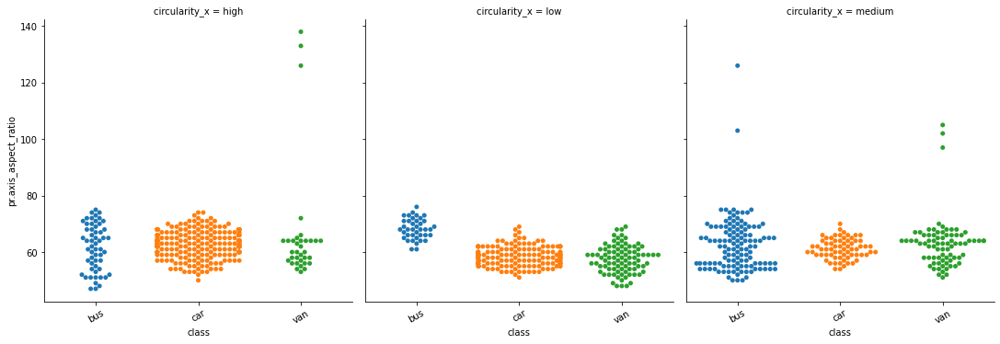

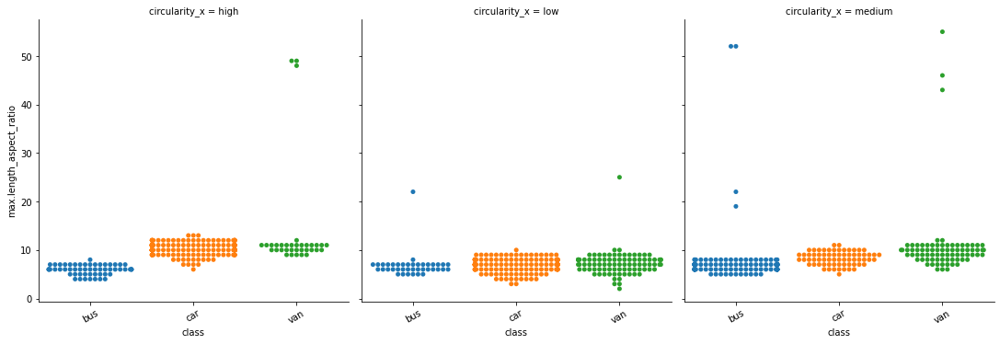

...

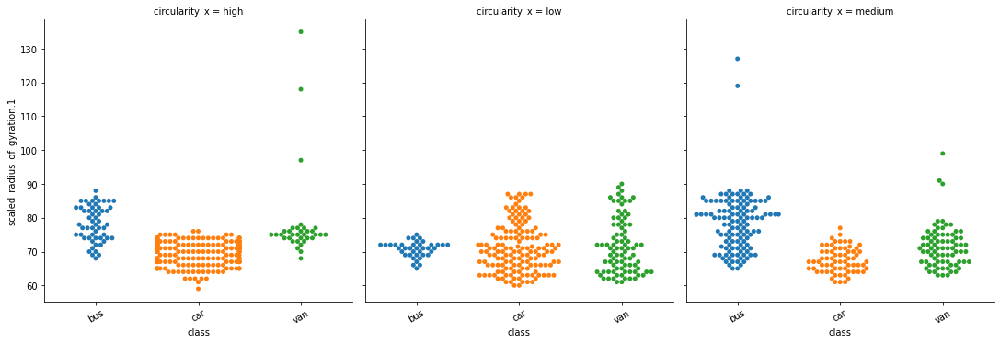

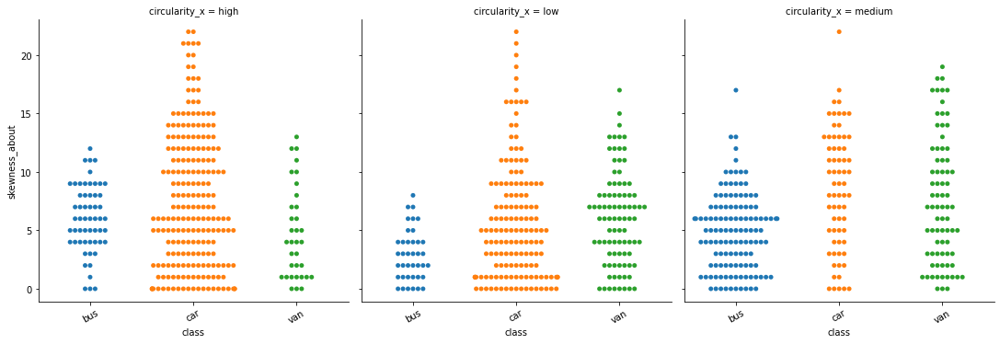

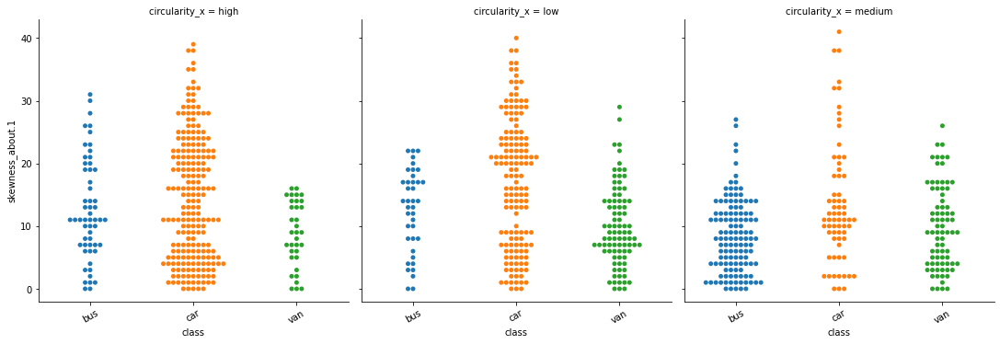

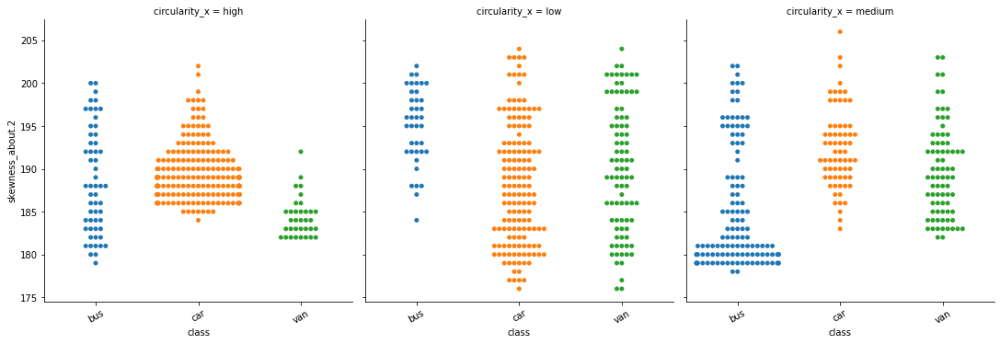

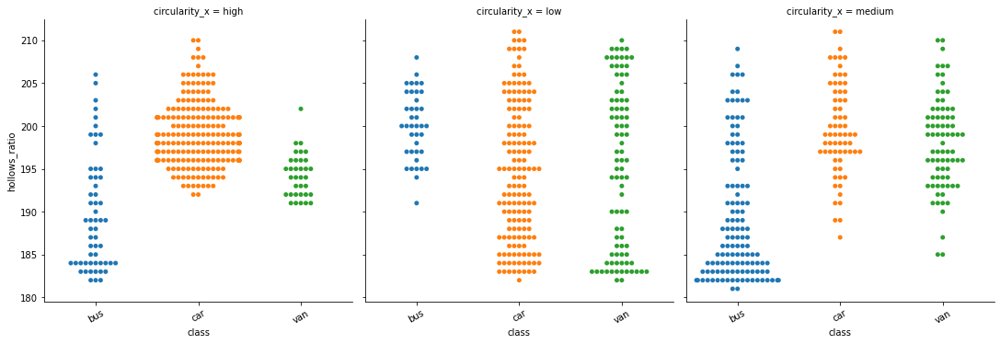

In [85]:
import warnings
warnings.simplefilter("ignore", UserWarning)


quant33 = np.percentile(vehicleDfRaw['circularity'],33)
quant66 = np.percentile(vehicleDfRaw['circularity'],66)

print("33 percentile : ",quant33)
print("66 percentile : ",quant66)

def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawCircularityCat = vehicleDfRaw.circularity.apply(categoriseData)
vehicleDfRawCircularityGraph = pd.merge(vehicleDfRawCircularityCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['compactness', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    g = sns.catplot(x="class",y = i ,
               col="circularity_x",
               data=vehicleDfRawCircularityGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the circularity column
- The circularity column are divided in 3 groups :: 
        
        below value 42  is considered as low
        value between  42 and 47 is considered as medium
        above value 47 are considered as High
        
- Frequncy of data  :: The distribution of data is  approximately  equal among different  circularity groups
- When we observe data, the class car and bus have longer distribution against other variables.
- When we observe data of class v/s elongatedness, van class seems to be higher than value 40 with different circularity.

33 percentile :  150.0
66 percentile :  186.0


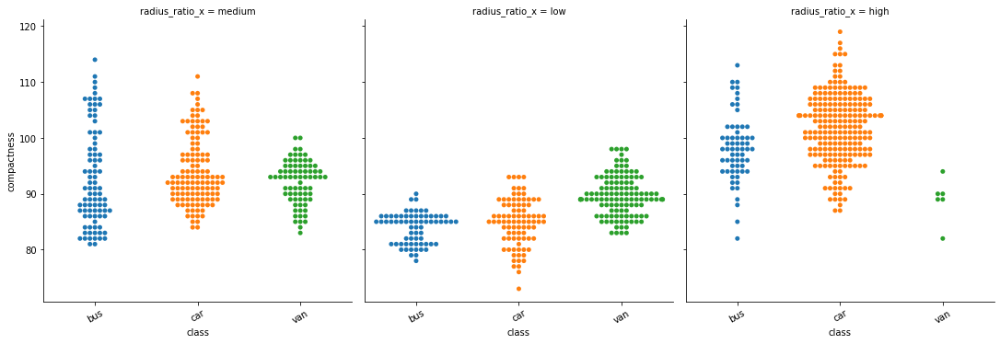

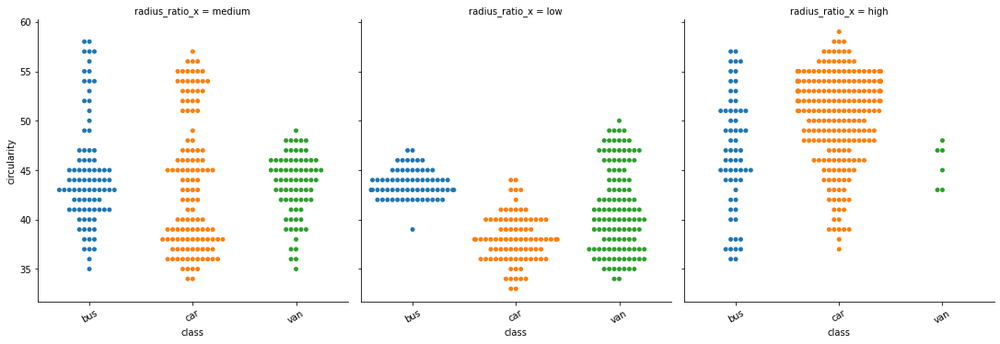

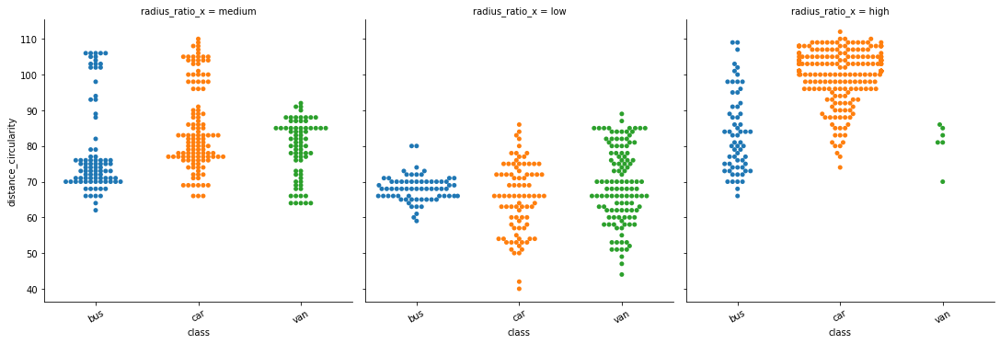

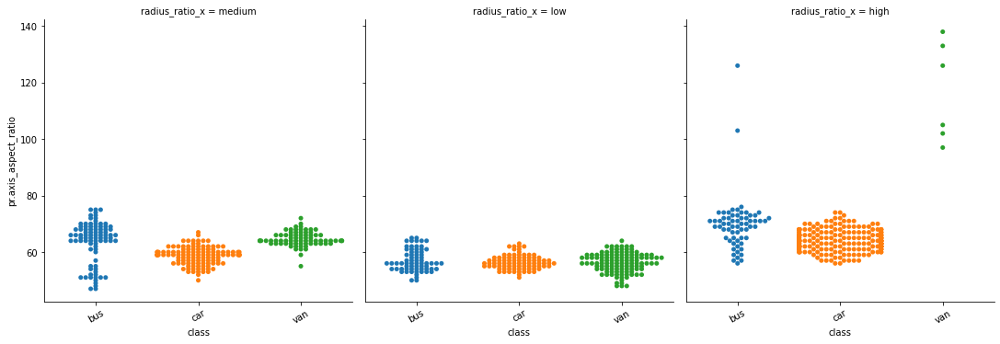

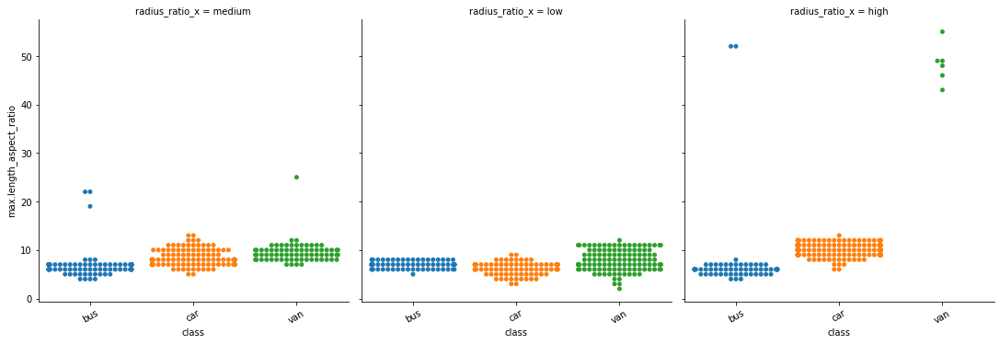

...

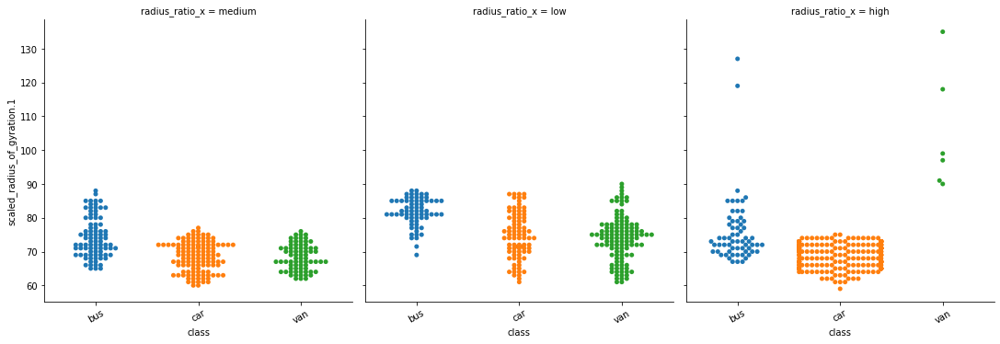

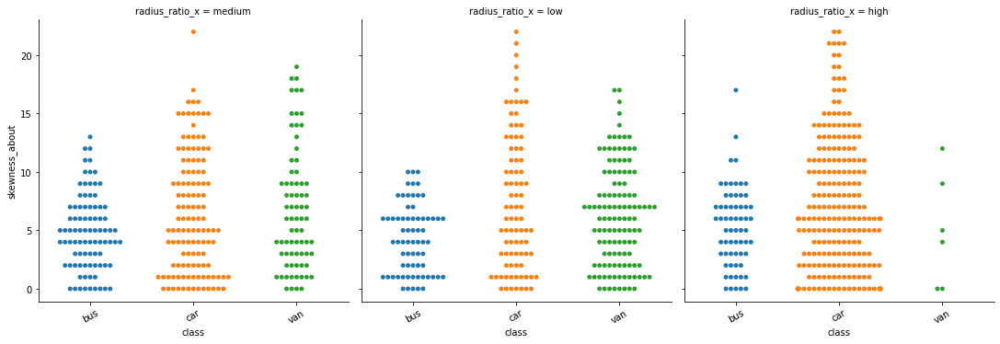

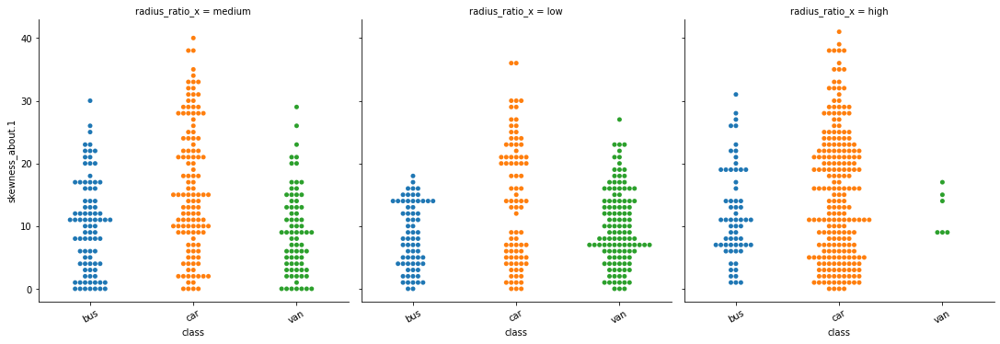

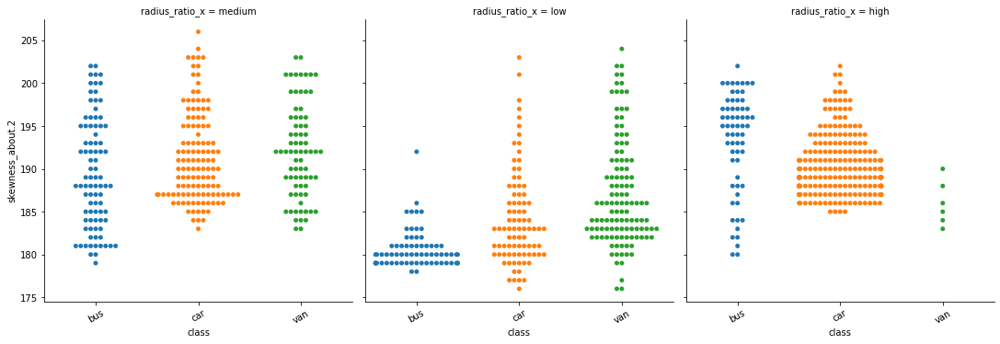

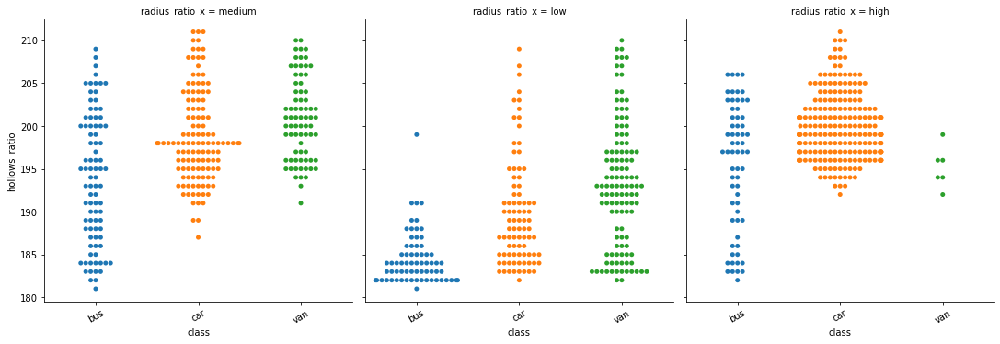

In [86]:
import warnings
warnings.simplefilter("ignore", UserWarning)


quant33 = np.percentile(vehicleDfRaw['radius_ratio'],33)
quant66 = np.percentile(vehicleDfRaw['radius_ratio'],66)

print("33 percentile : ",quant33)
print("66 percentile : ",quant66)

def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawRadiusRatioCat = vehicleDfRaw.radius_ratio.apply(categoriseData)
vehicleDfRawRadiusRatioGraph = pd.merge(vehicleDfRawRadiusRatioCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['compactness', 'circularity', 'distance_circularity',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    g = sns.catplot(x="class",y = i ,
               col="radius_ratio_x",
               data=vehicleDfRawRadiusRatioGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the radius_ratio column
- The radius_ratio column are divided in 3 groups :: 
        
        below value 150  is considered as low
        value between  150 and 186 is considered as medium
        above value 186 are considered as High
        
- Frequncy of data  :: The distribution of data is  approximately  equal among different  radius_ratio groups
- More Data point observed for Car class - for high radisu ratio group.
- When we observe data for radius_ratio medium and low, the class car and bus have longer distribution against other variables.
- When we observe data of class van among different column, the high radius_ratio seems to have very less data point.

33 percentile :  150.0
66 percentile :  177.70000000000005


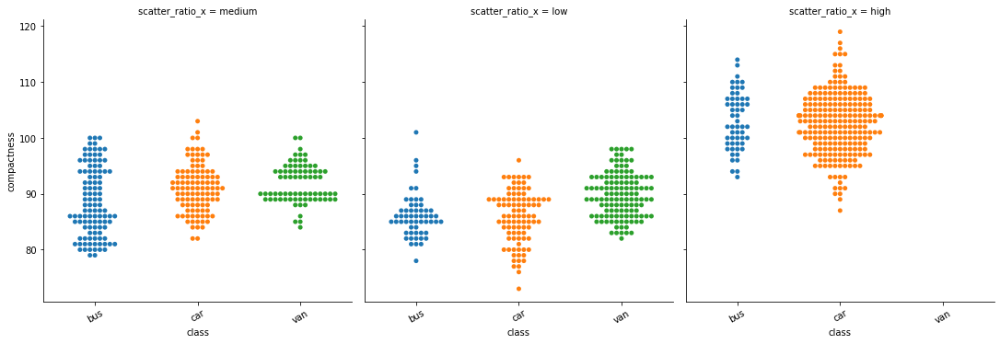

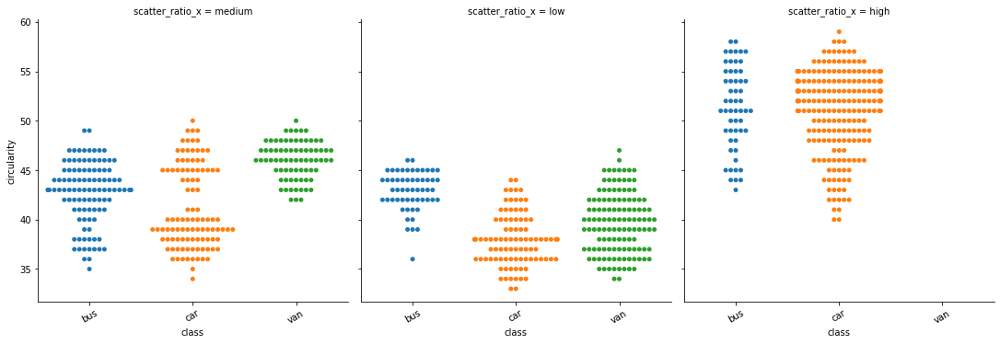

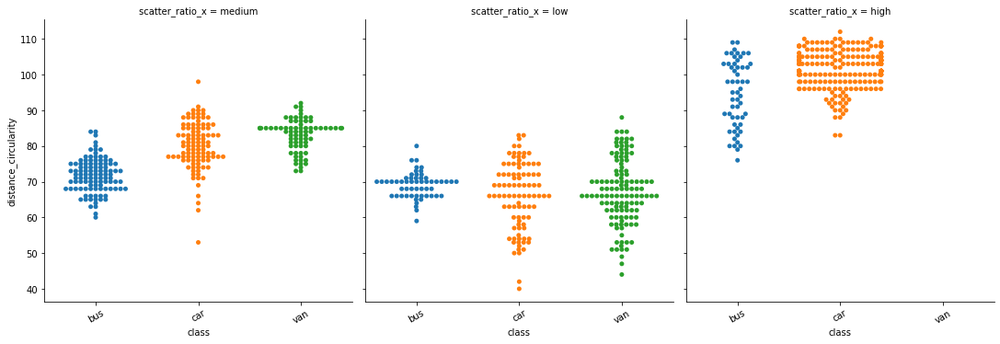

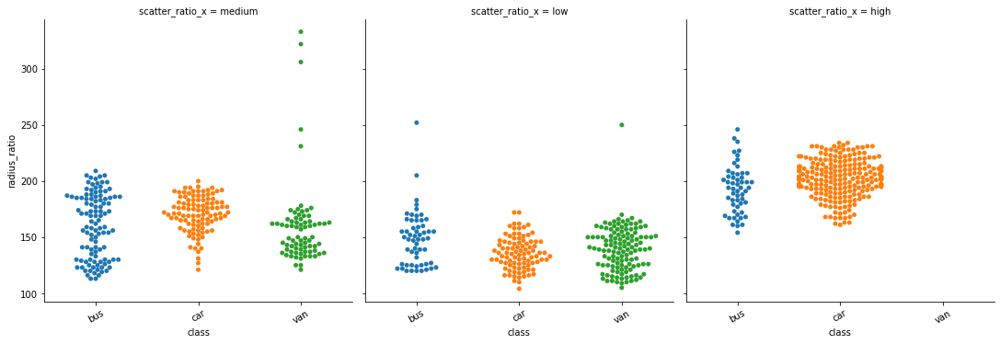

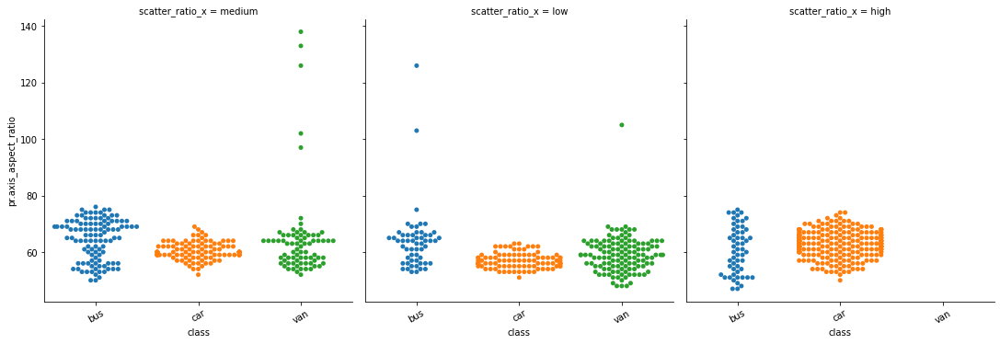

...

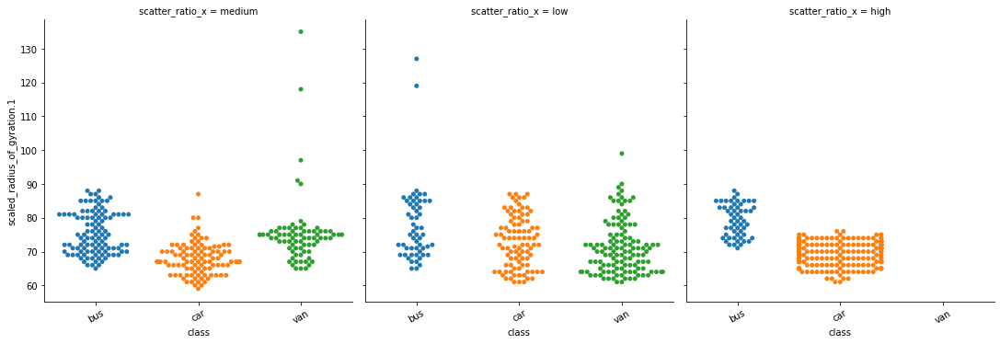

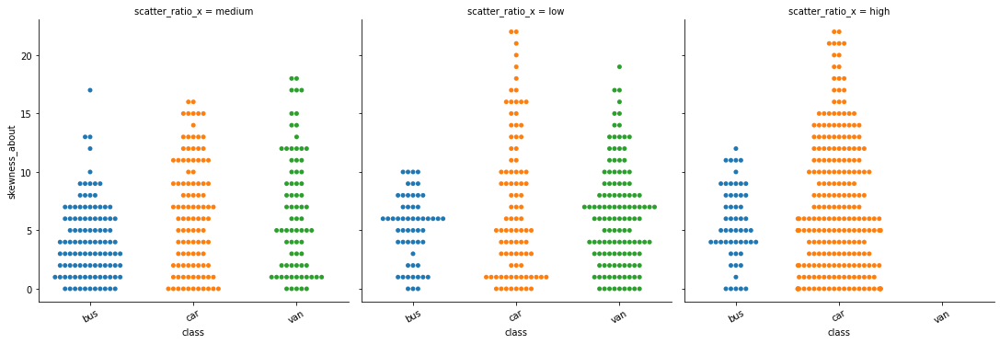

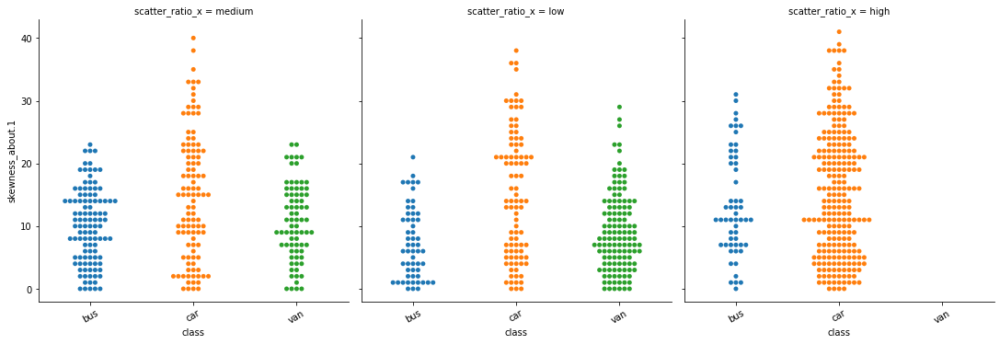

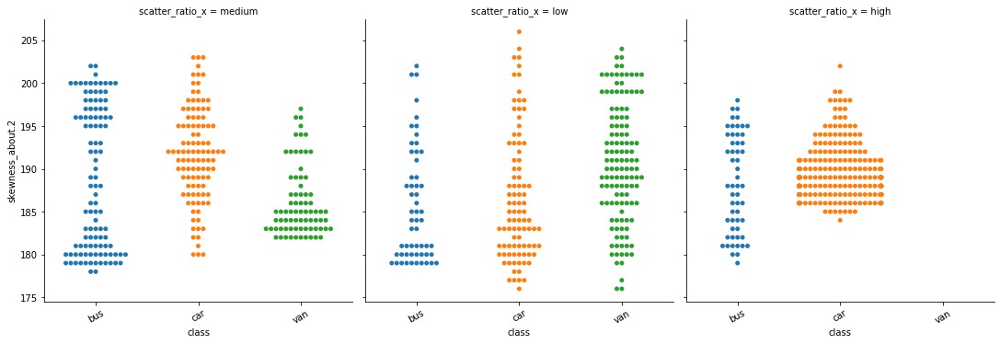

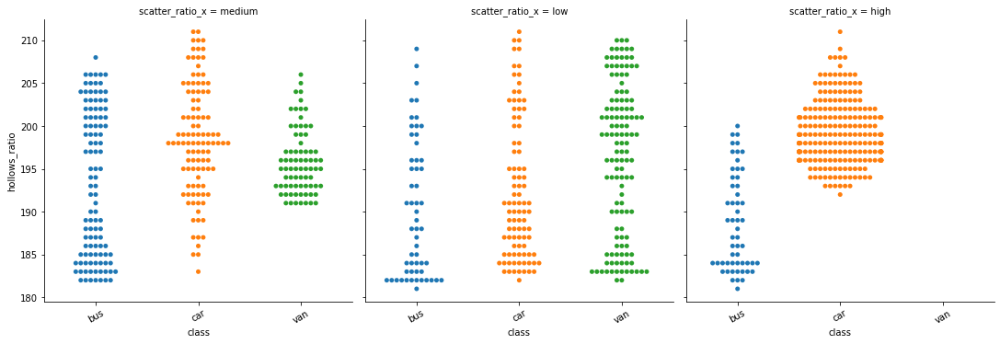

In [87]:
import warnings
warnings.simplefilter("ignore", UserWarning)


quant33 = np.percentile(vehicleDfRaw['scatter_ratio'],33)
quant66 = np.percentile(vehicleDfRaw['scatter_ratio'],66)

print("33 percentile : ",quant33)
print("66 percentile : ",quant66)


def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawScatterRatioCat = vehicleDfRaw.scatter_ratio.apply(categoriseData)
vehicleDfRawScatterRatioGraph = pd.merge(vehicleDfRawScatterRatioCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    g = sns.catplot(x="class",y = i ,
               col="scatter_ratio_x",
               data=vehicleDfRawScatterRatioGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the scatter_ratio column
- The scatter_ratio column are divided in 3 groups :: 
        
        below value 150 is considered as low
        value between 150 and 177 is considered as medium
        above value 177 are considered as High
        
- Class Car is having more data point (dominant) for High scatter ratio category.
- Frequncy of data  :: The distribution of data is  approximately equal among different scatter_ratio groups
- When we observe data for scatter_ratio medium and low, the class car and bus have longer distribution against other variables.
- When we observe data of class van among different column, the high scatter_ratio doesnt seems to data point.

 33 percentile : 36.0
 66 percentile : 45.0


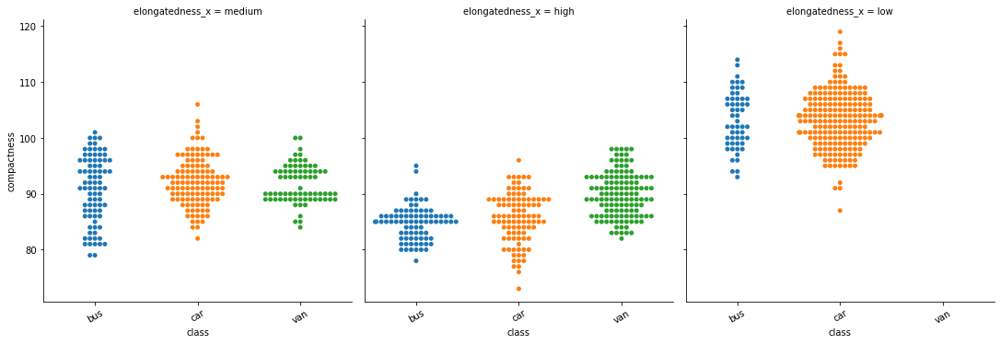

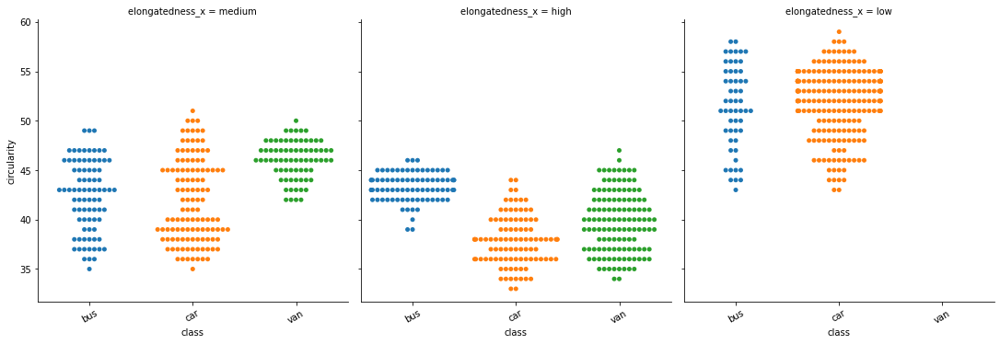

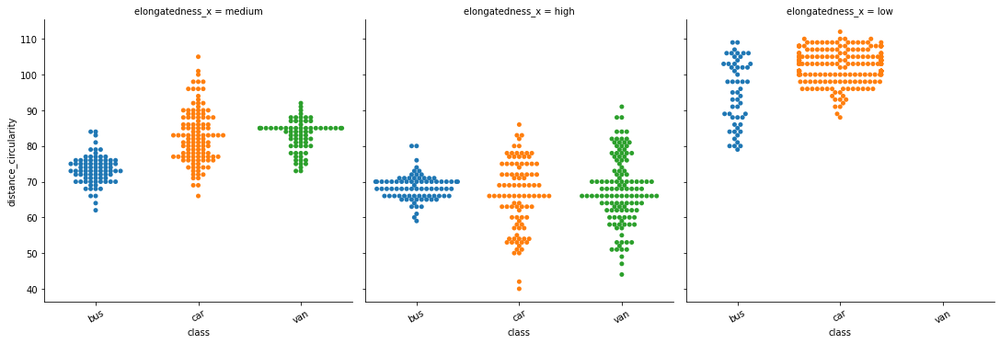

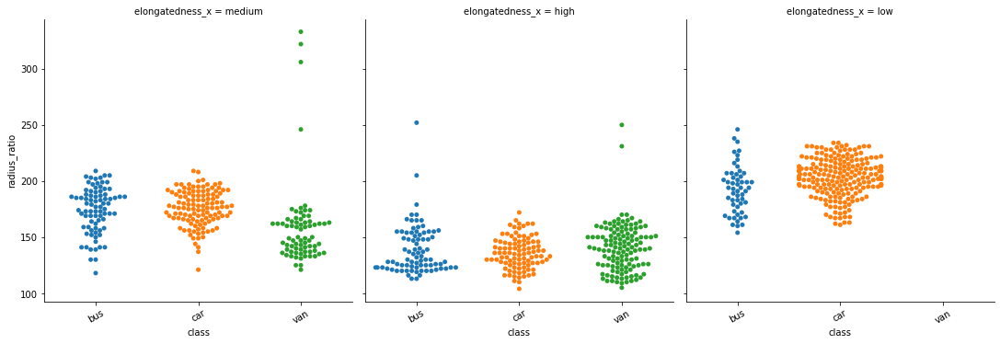

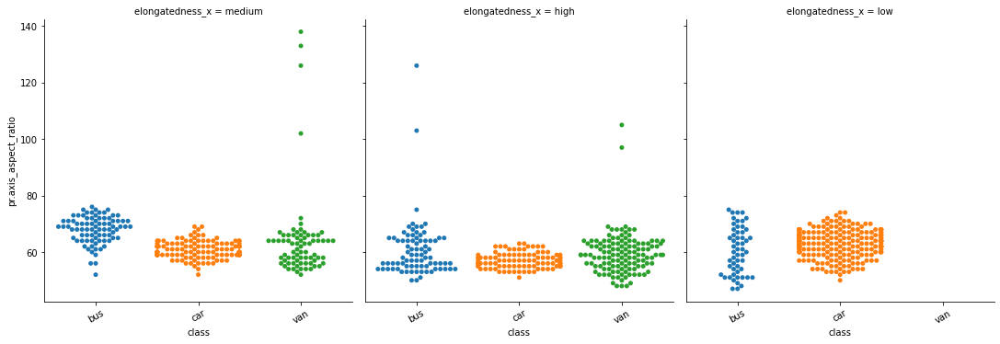

...

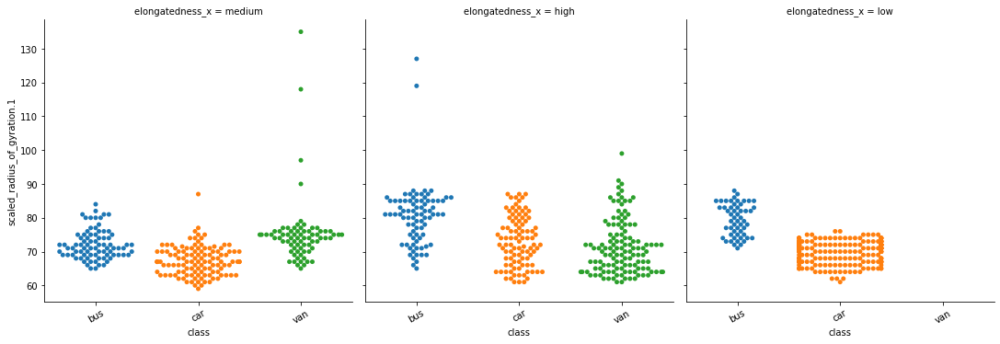

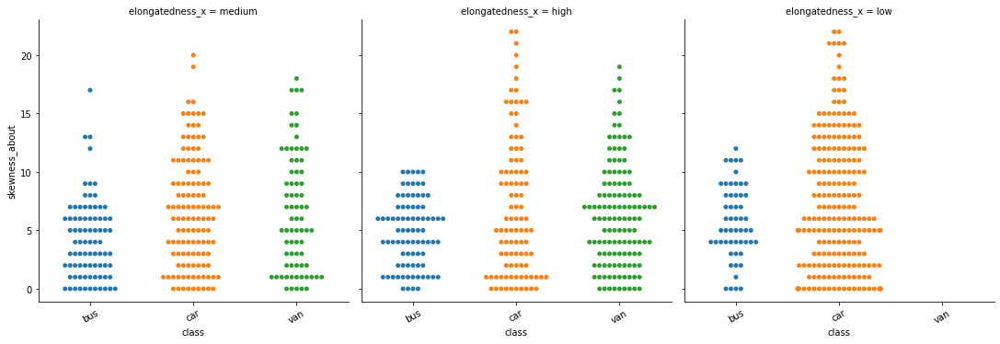

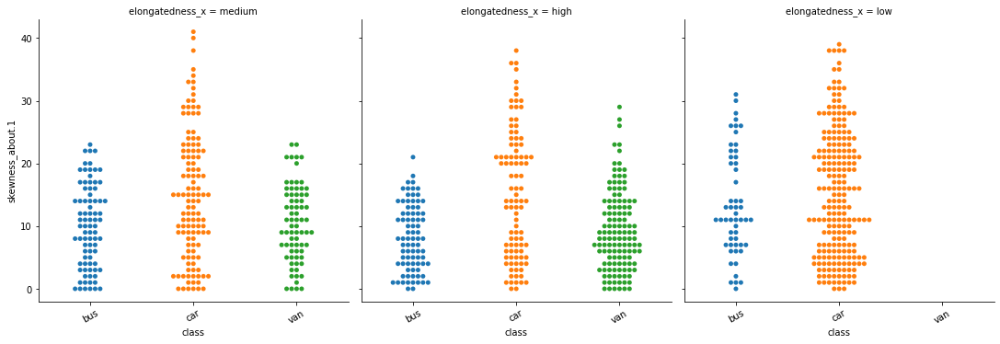

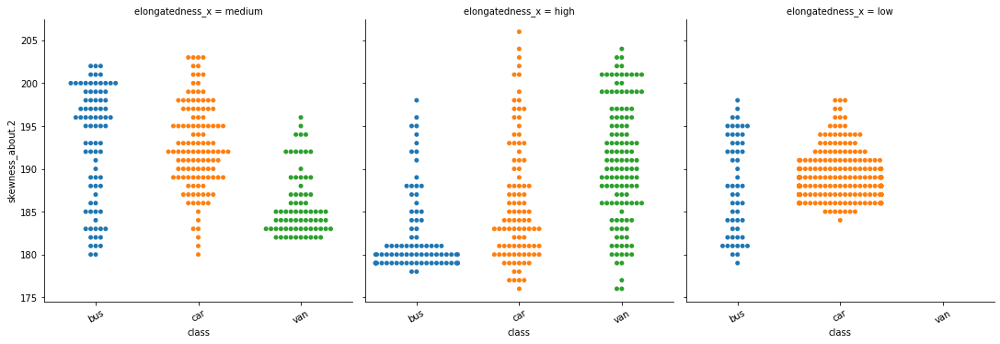

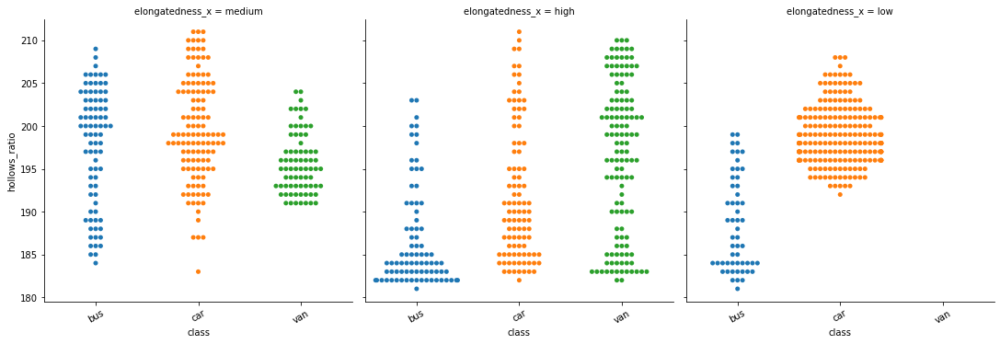

In [88]:
import warnings
warnings.simplefilter("ignore", UserWarning)


quant33 = np.percentile(vehicleDfRaw['elongatedness'],33)
quant66 = np.percentile(vehicleDfRaw['elongatedness'],66)

print(" 33 percentile :", quant33)
print(" 66 percentile :", quant66)

def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawElongatednessCat = vehicleDfRaw.elongatedness.apply(categoriseData)
vehicleDfRawElongatednessGraph = pd.merge(vehicleDfRawElongatednessCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    g = sns.catplot(x="class",y = i ,
               col="elongatedness_x",
               data=vehicleDfRawElongatednessGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the elongatedness column
- The elongatedness column are divided in 3 groups :: 
        
        below value 36 is considered as low
        value between 36 and 45 is considered as medium
        above value 45 are considered as High
        
- elongatedness and scatter ratio seems to have similar kind of distribution.

33 percentile :  4.0
66 percentile :  8.0


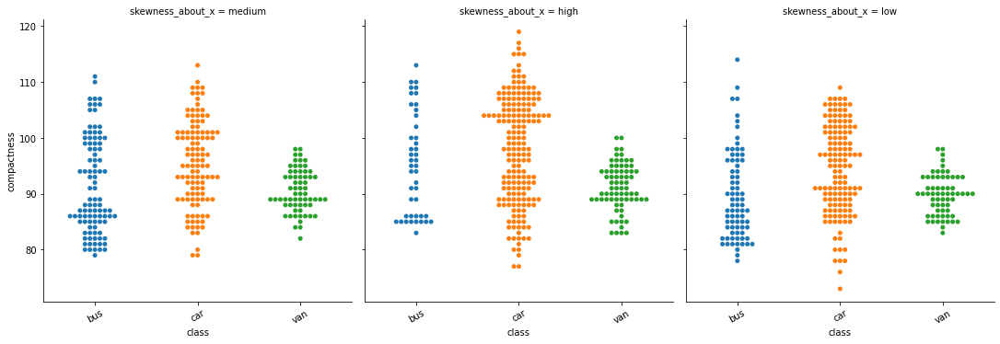

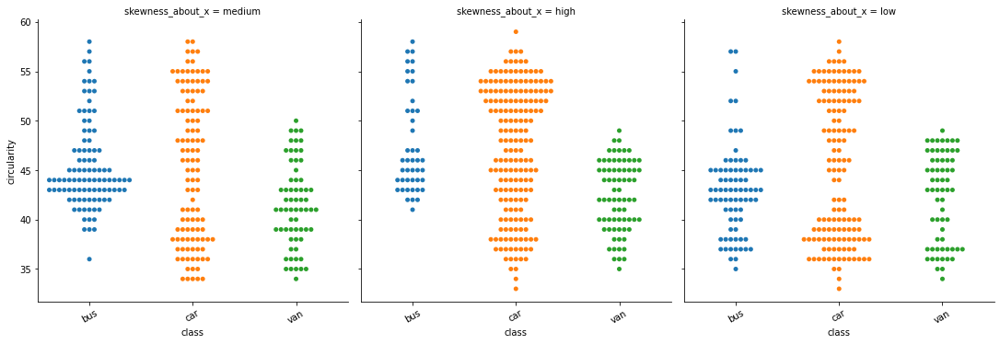

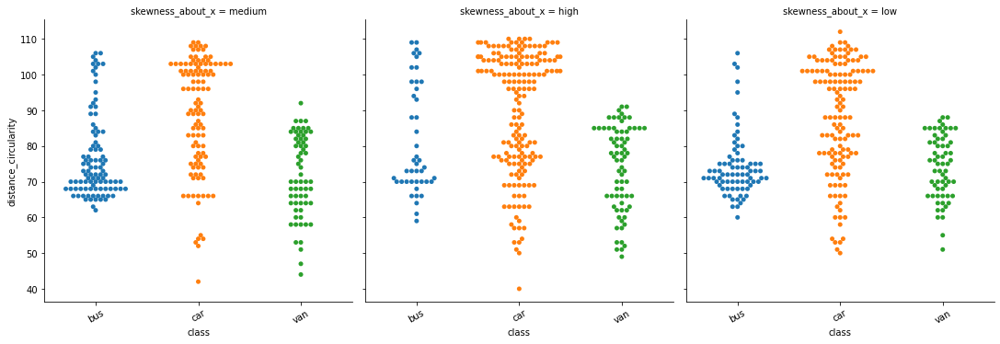

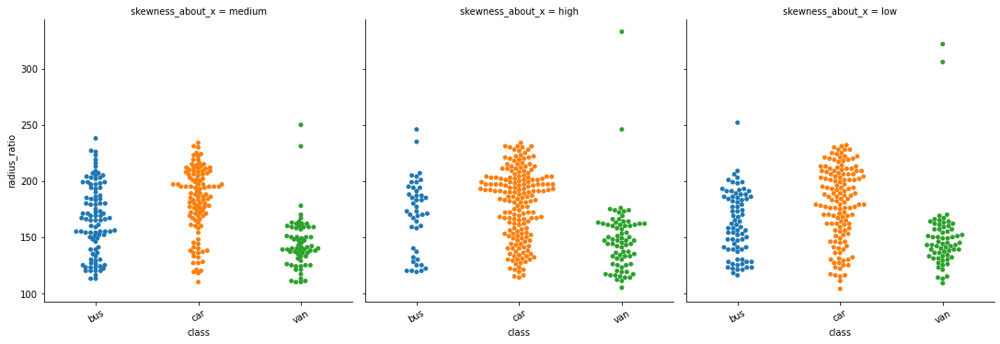

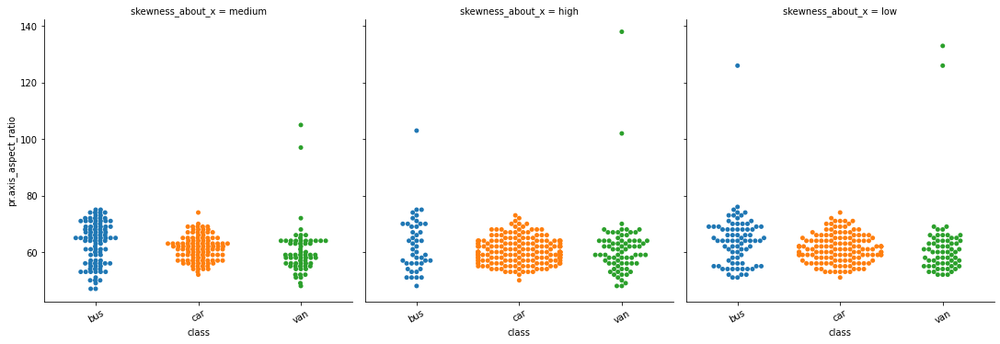

...

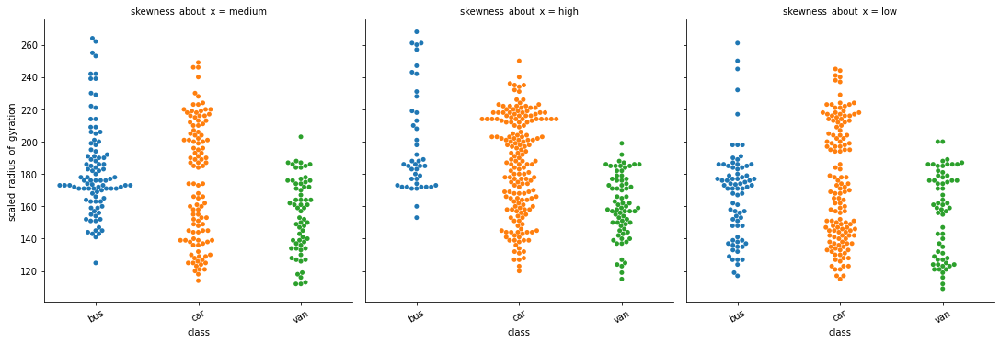

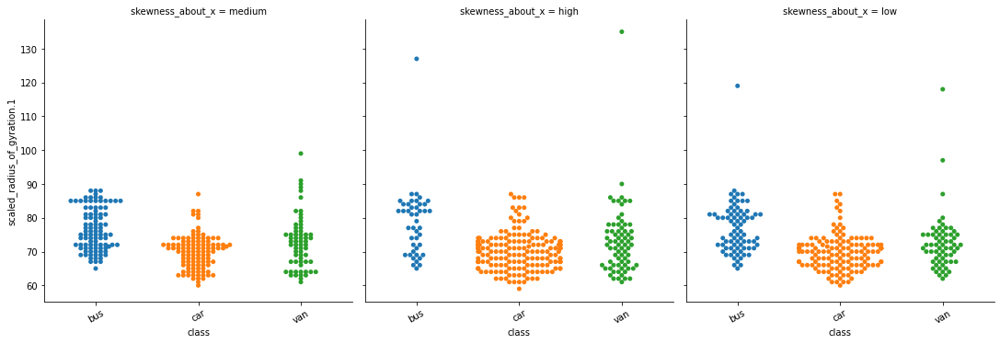

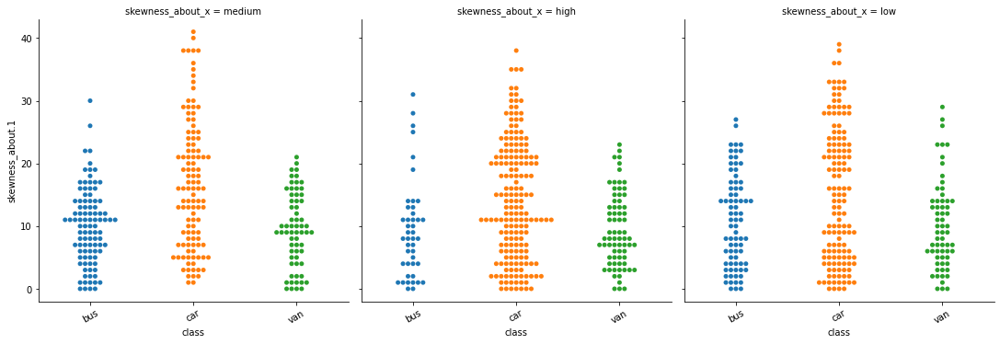

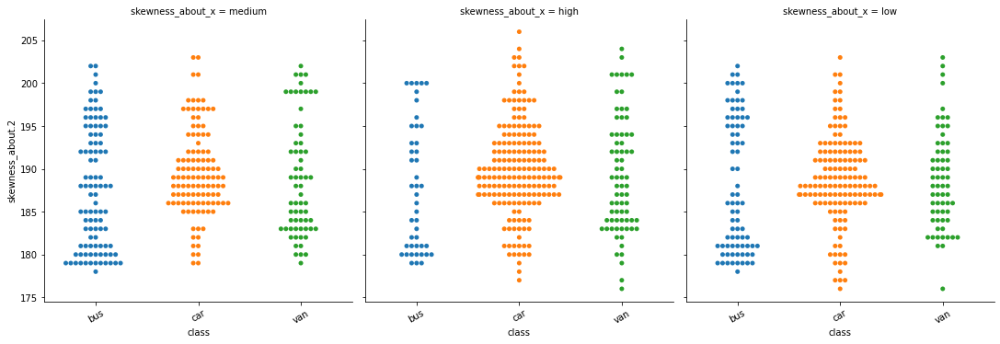

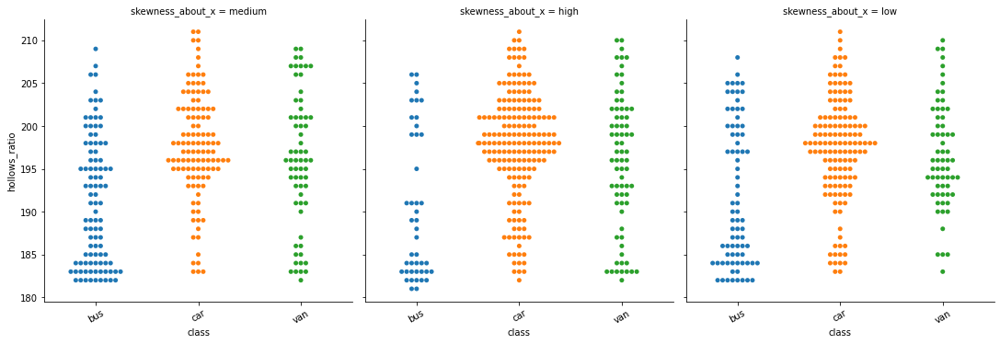

In [89]:
import warnings
warnings.simplefilter("ignore", UserWarning)


quant33 = np.percentile(vehicleDfRaw['skewness_about'],33)
quant66 = np.percentile(vehicleDfRaw['skewness_about'],66)

print("33 percentile : ",quant33)
print("66 percentile : ",quant66)

def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawSkewnessAboutCat = vehicleDfRaw.skewness_about.apply(categoriseData)
vehicleDfRawSkewnessAboutCatGraph = pd.merge(vehicleDfRawSkewnessAboutCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    g = sns.catplot(x="class",y = i ,
               col="skewness_about_x",
               data=vehicleDfRawSkewnessAboutCatGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the skewness_about column
- The skewness_about column are divided in 3 groups :: 
        
        below value 150 is considered as low
        value between 150 and 177 is considered as medium
        above value 177 are considered as High
        
- Class Car is having more data point (dominant) for High skewness_about category.
- Frequncy of data  :: The distribution of data is approximately equal among different skewness_about groups
- When we observe data for scatter_ratio medium and low, the class car and bus have longer distribution against other variables.

33 percentile :  193.0
66 percentile :  199.0


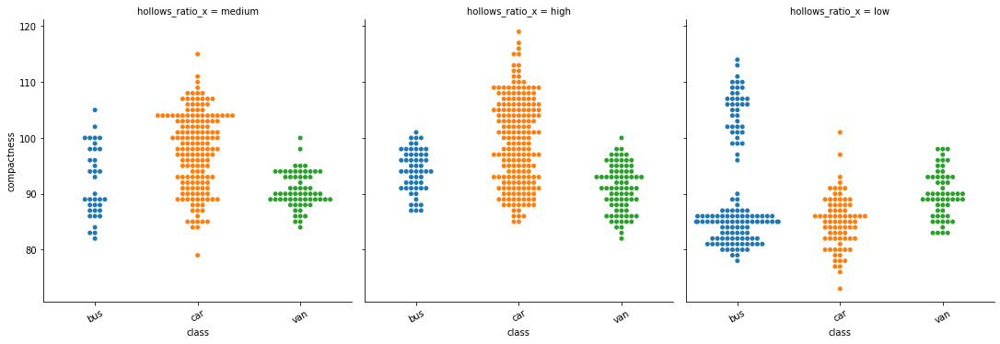

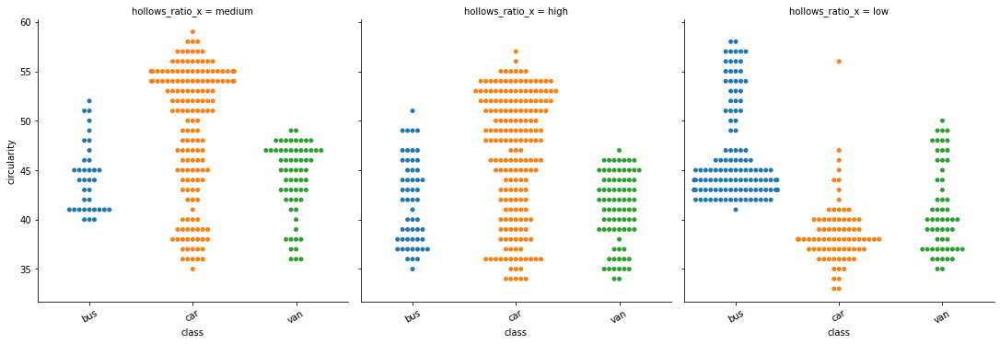

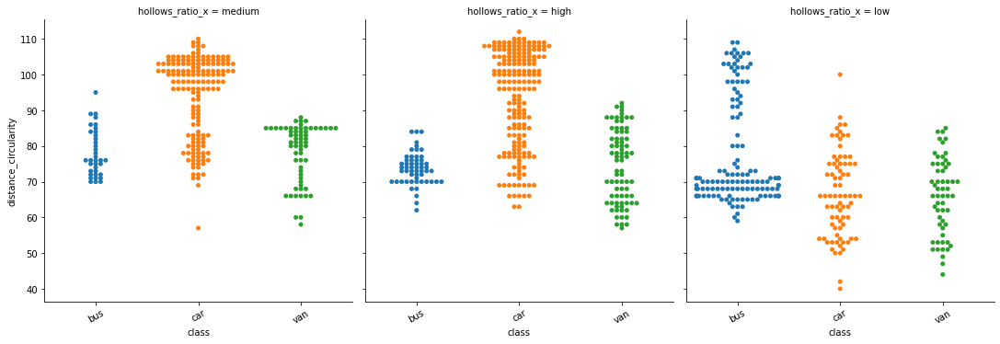

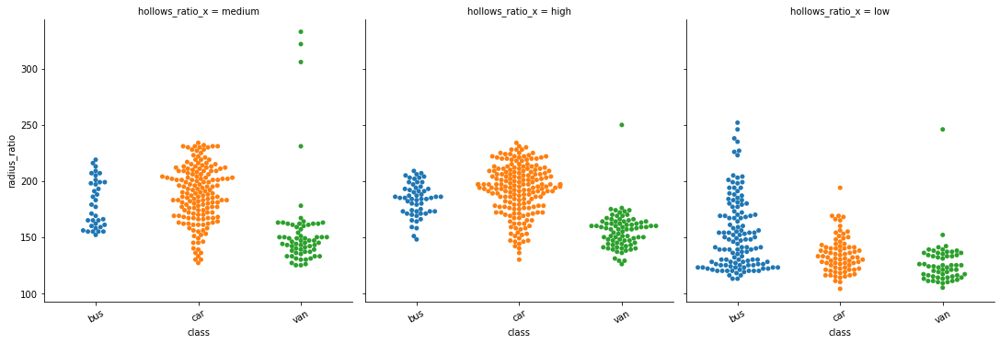

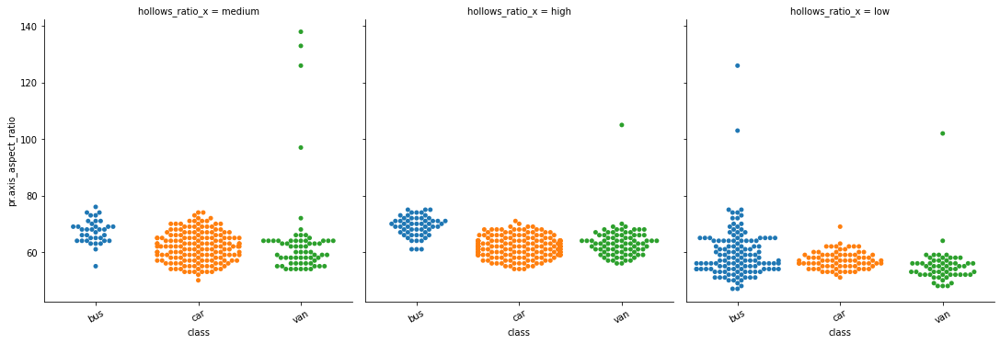

...

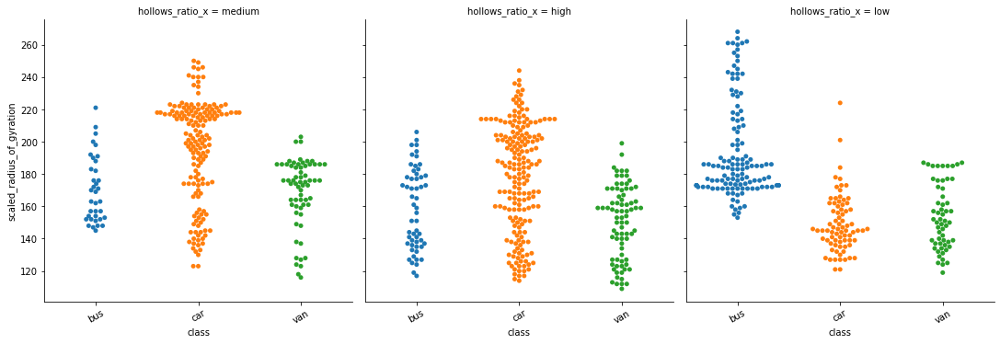

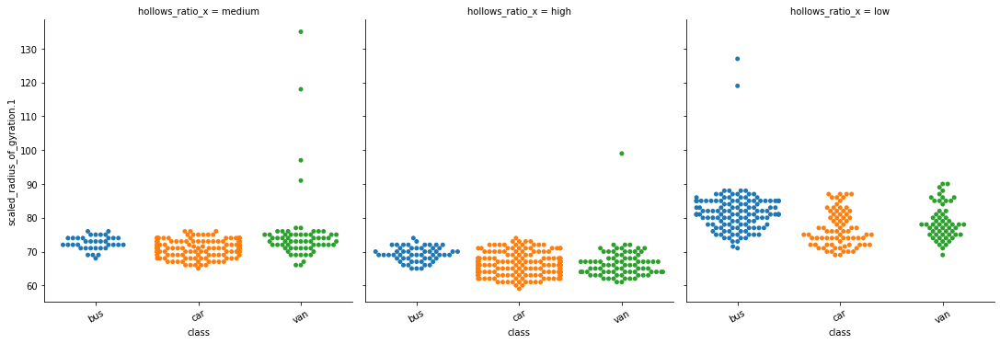

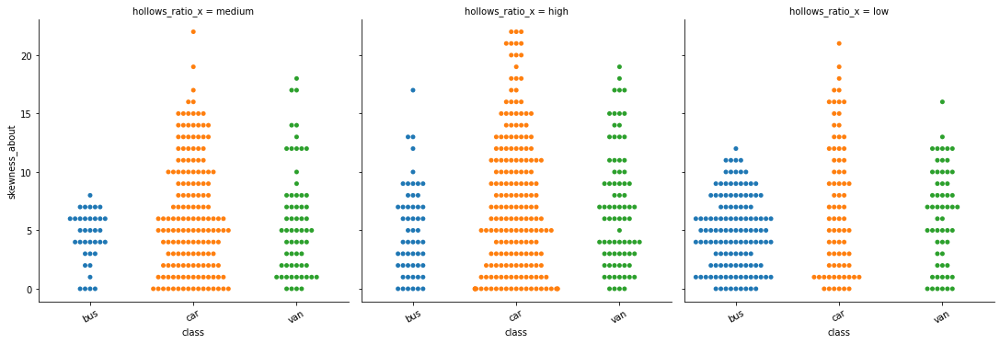

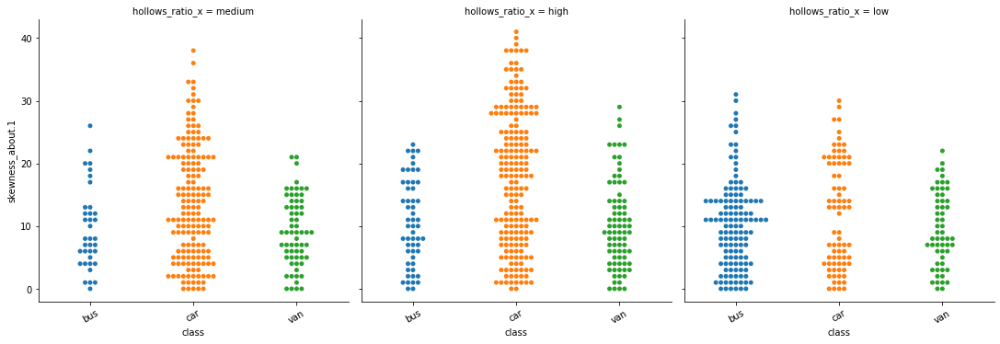

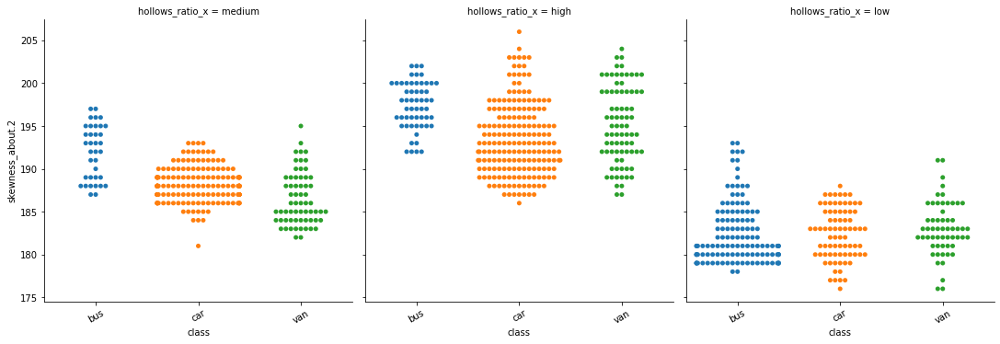

In [90]:
import warnings
warnings.simplefilter("ignore", UserWarning)


quant33 = np.percentile(vehicleDfRaw['hollows_ratio'],33)
quant66 = np.percentile(vehicleDfRaw['hollows_ratio'],66)

print("33 percentile : ",quant33)
print("66 percentile : ",quant66) 

def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawHollowsRatioCat = vehicleDfRaw.hollows_ratio.apply(categoriseData)
vehicleDfRawHollowsRatioCatGraph = pd.merge(vehicleDfRawHollowsRatioCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2']:
    g = sns.catplot(x="class",y = i ,
               col="hollows_ratio_x",
               data=vehicleDfRawHollowsRatioCatGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the hollows_ratio column
- The hollows_ratio column are divided in 3 groups :: 
        
        below value 193 is considered as low
        value between 193 and 199 is considered as medium
        above value 199 are considered as High
        
- Class Car is having more data point (dominant) for High hollows_ratio category.
- Frequncy of data  :: The distribution of data is approximately equal among different skewness_about groups
- When we observe data for scatter_ratio medium and low, the class car and bus have longer distribution against other variables.

In [91]:
import scipy.stats as stats
# Using ChiSquare we determine importance of the variable - if the variable if not important - then we can plan to drop the variable.

alpha=0.05
dropColumnsList=[]

def ChiSquareTestIndependence(colX,colY):
    X = vehicleDfRaw[colX].astype(str)
    Y = vehicleDfRaw[colY].astype(str)
    
    crossT = pd.crosstab(Y,X) 
    chi2, p, dof, expected = stats.chi2_contingency(crossT.values)
    
    if p<alpha:
            print("{0} is IMPORTANT for Prediction".format(colX))
    else:
            print("{0} is      NOT      an important predictor".format(colX))
            dropColumnsList.append(colX)

for var in ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    ChiSquareTestIndependence(colX=var,colY="class" )

compactness is IMPORTANT for Prediction
circularity is IMPORTANT for Prediction
distance_circularity is IMPORTANT for Prediction
radius_ratio is IMPORTANT for Prediction
pr.axis_aspect_ratio is IMPORTANT for Prediction
max.length_aspect_ratio is IMPORTANT for Prediction
scatter_ratio is IMPORTANT for Prediction
elongatedness is IMPORTANT for Prediction
pr.axis_rectangularity is IMPORTANT for Prediction
max.length_rectangularity is IMPORTANT for Prediction
scaled_variance is IMPORTANT for Prediction
scaled_variance.1 is IMPORTANT for Prediction
scaled_radius_of_gyration is IMPORTANT for Prediction
scaled_radius_of_gyration.1 is IMPORTANT for Prediction
skewness_about is IMPORTANT for Prediction
skewness_about.1 is IMPORTANT for Prediction
skewness_about.2 is IMPORTANT for Prediction
hollows_ratio is IMPORTANT for Prediction


In [92]:
# vehicleDfRaw.boxplot(figsize=(35,15))
vehicleDfRaw.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

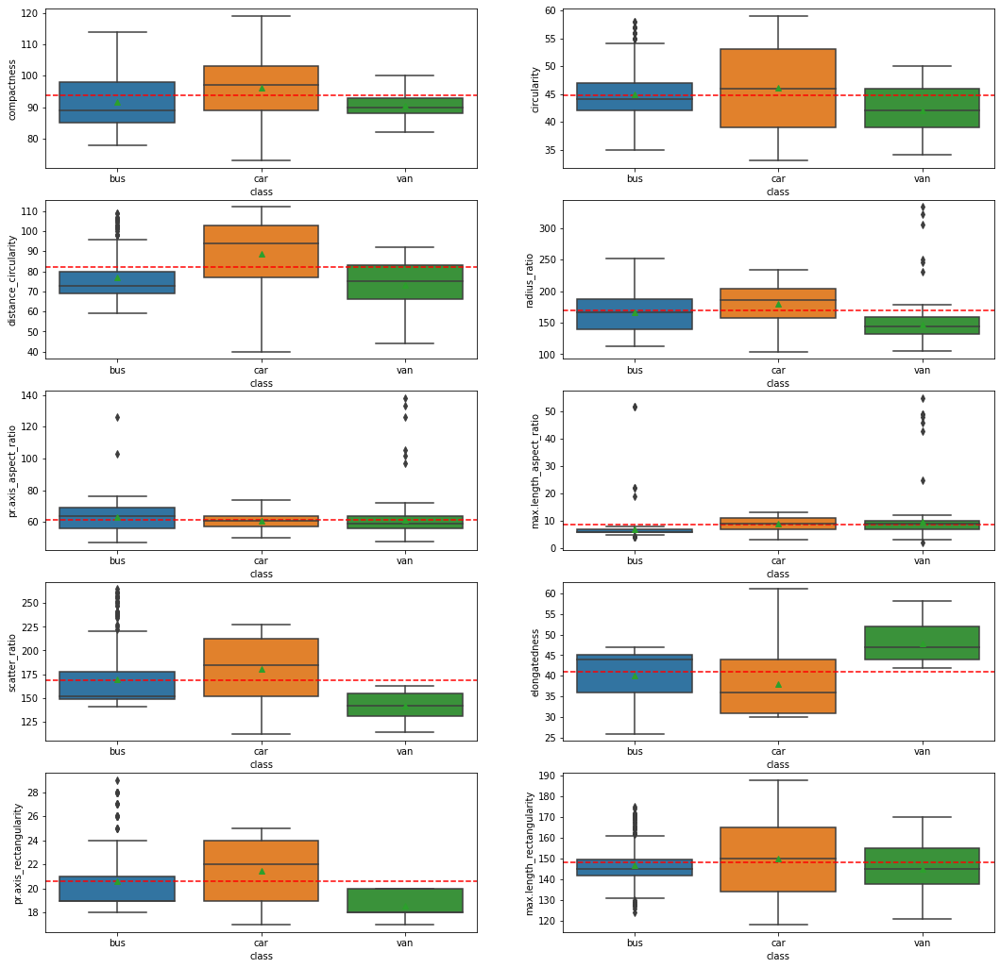

In [93]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig, ax = plt.subplots(5,2, figsize=(18,18))
listOfColumns = ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity']
len_listOfColumns = len(listOfColumns)
index = 0

for j in range(len(ax)):
    for i in range(len(ax[j])):
        if(index < len_listOfColumns):
            ax[j][i] = sns.boxplot(y=vehicleDfRaw[listOfColumns[index]],x=vehicleDfRaw['class'],showmeans=True, ax = ax[j][i]);
            ax[j][i].axhline(vehicleDfRaw[listOfColumns[index]].mean(),color = 'r', ls='--')
            index = index + 1 
fig.show()

- compactness :: In compacteness boxplot, 75% of van class data are below mean taken across dataset compactness variable. Mean and medain for van and car class are close to each other but mean is higher than median in bus class. There are not outlier observed in this column

- circularity :: In circularity boxplot , Mean and Median for all 3 classes are close. There are outliers observed for bus class.

- distance_circularity :: In this boxplot, Mean and median are close for van class, for car class mean is lower than median, for bus class mean is higher then median. 75% of data points are lower than overall mean for bus class. 

- radius_ratio :: In this boxplot, There are outliers observed for van class. Mane and Median are closs for each each class. 75% of data point for van class are below overall mean. Outlier observed in van and bus class.

- pr.axis_aspect_ratio :: Data seems to be equally distributed. Mean , median and overall mean are close to one another.

- max.length_aspect_ratio :: bus class data are below the overall mean. Outlier observed for van and bus class.

- scatter_ratio :: Outlier observed for bus class, Mean is higher than median in bus class. Van class data is below overall mean.

- elongatedness :: mean and median are close to one another for van and car class but mean is well below median for bus class. Van Class data is above overall mean. No Outliers observed.

- pr.axis_rectangularity :: Outliers observed for bus class. Mean and Median are close to one another across all class. Van class data is below overall mean.

- max.length_rectangularity:: Outliers observed for bus class. Mean, median and overall mean are close to one another acorss class.

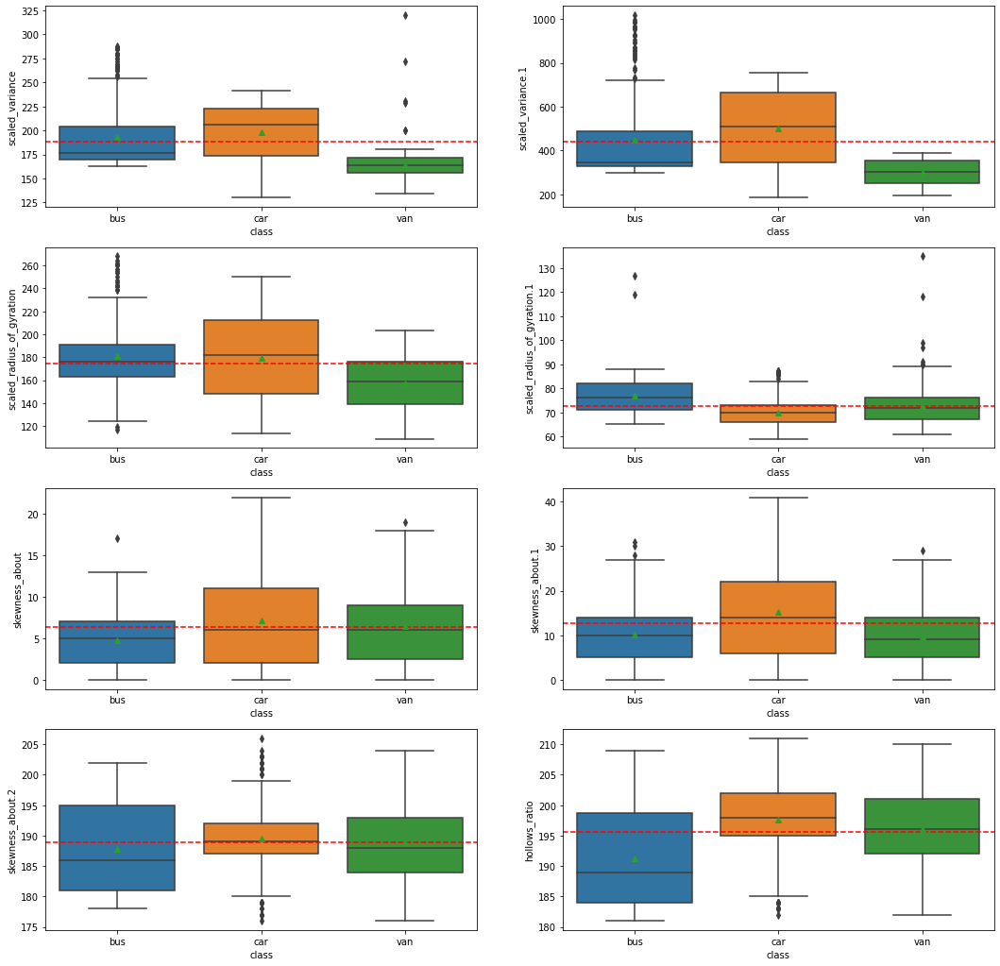

In [94]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig, ax = plt.subplots(4,2, figsize=(18,18))
listOfColumns = ['scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']
len_listOfColumns = len(listOfColumns)
index = 0

for j in range(len(ax)):
    for i in range(len(ax[j])):
        if(index < len_listOfColumns):
            ax[j][i] = sns.boxplot(y=vehicleDfRaw[listOfColumns[index]],x=vehicleDfRaw['class'],showmeans=True, ax = ax[j][i]);
            ax[j][i].axhline(vehicleDfRaw[listOfColumns[index]].mean(),color = 'r', ls='--')
            index = index + 1 
fig.show()

- scaled_variance :: outlier observed for van and bus class. Van class all data points are below overall average. Mean is higher then median in bus class.
- scaled_variance.1 :: outlier observed for bus class.Van class all data points are below overall average. Mean is higher then median in bus class.
- scaled_radius_of_gyration :: outlier observed for bus class. 75% of data point are below overall mean for van class.
- scaled_radius_of_gyration.1 :: outlier observed for all class. Mean , median and overall mean are close to one another.
- skewness_about :: outlier observed for bus, van class. Mean and median are close to one another.
- skewness_about.1  :: outlier observed for bus, van class. Mean and Median are close to one another.
- skewness_about.2 :: outlier observed for car class. Mean, median and overall mean are close to one another. 
- hollows_ratio :: outlier observed for car class. Mean and Median are close to one another in van and car class.  Mean is Above median in bus class. Bus class mean is well below overall mean for bus class

In [95]:
vehicleDfRaw.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

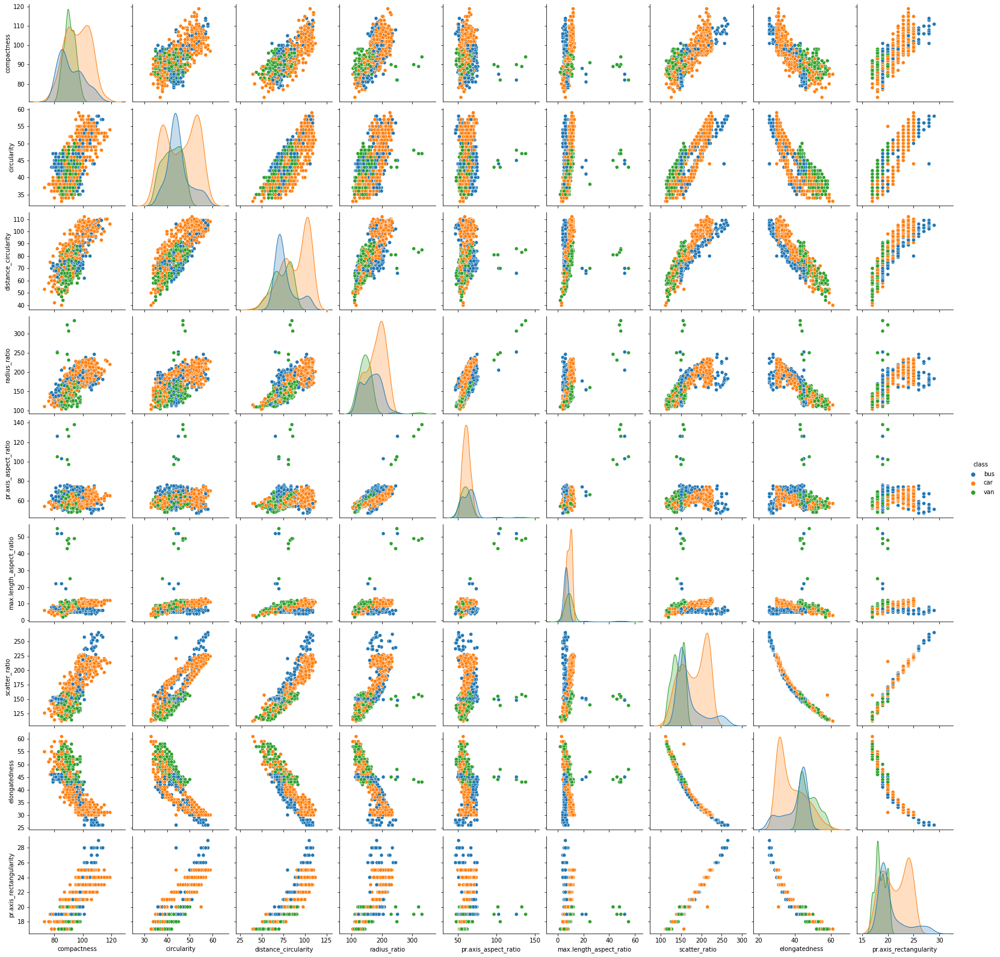

In [96]:
sns.pairplot(vehicleDfRaw[['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity','class']], diag_kind='kde', hue = 'class')  

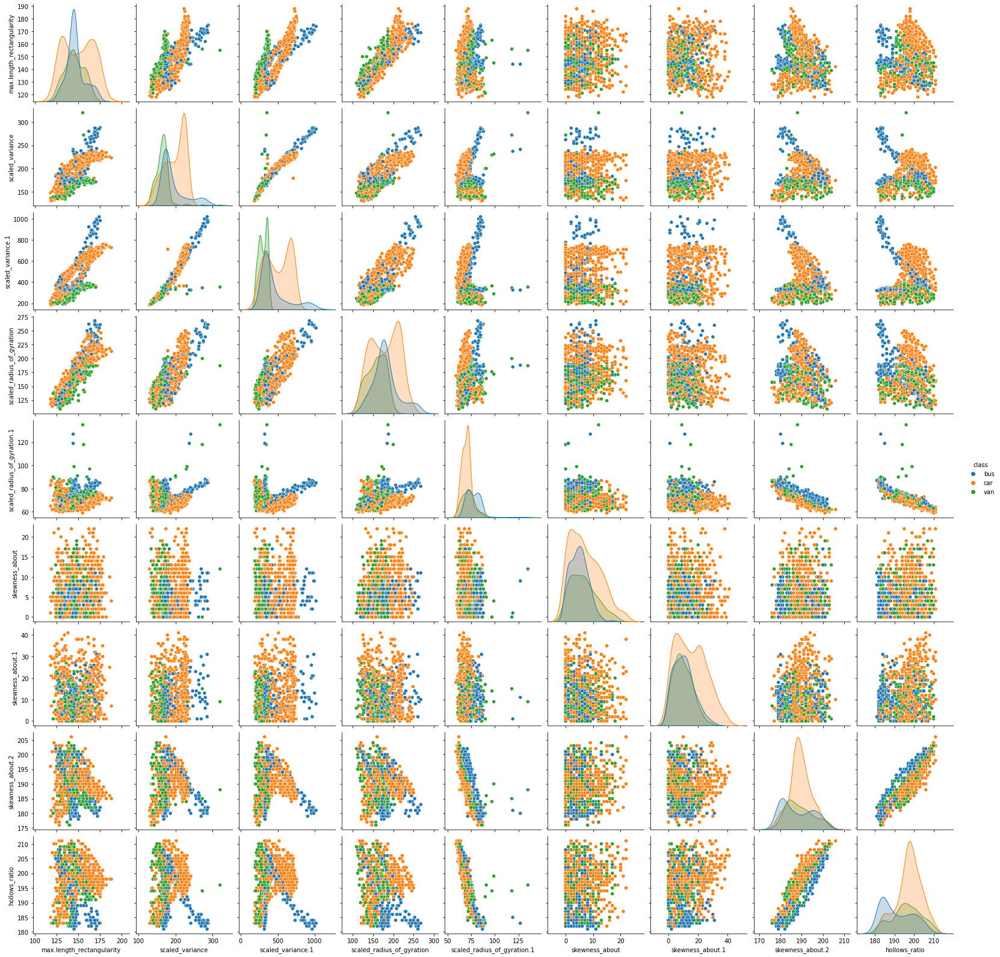

In [97]:
sns.pairplot(vehicleDfRaw[['max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class']], diag_kind='kde', hue = 'class')  

- Looking into diagonal :  we could deduce that there are clear groups in the data which signifies classification in data exists.
- positive and negative correlation exists between many variable - which is signifies that the dataset is good candidate for PCA dimensonality reduction.
- For example: compactness is highly correlated in a positive way with scatter_ratio, pr.axis_rectangularity, scaled_variance1, distance_circularity, scaled_variance, radius_ratio. compactness is highly correlated in a negative way with elongatedness. 
- circularity has positive linear relationship with distance_circularity, scatter_ratio, pr.axis_rectangularity, max.axis_rectangularity, scaled_variance, scaled_variance1, scaled_radius_of_gyration. circularity has negative linear relationship with elongatedness.
- distance_circularity has positive linear relationship with radius_ratio, scatter_ratio, pr.axis_rectangularity, max.axis_rectangularity, scaled_variance, scaled_variance1, scaled_radius_of_gyration. distance_circularity has negative linear relationship with elongatedness.
- radius_ratio has positive linear relationship with pr.axis_aspect_ratio, scatter_ratio, scaled_variance, scaled_variance1, scaled_radius_of_gyration. radius_ratio has negative linear relationship with elongatedness.

- Handling outliers using median value

In [98]:
#find the outliers and replace them by median
for col_name in vehicleDfRaw.columns[:-1]:
    q1 = vehicleDfRaw[col_name].quantile(0.25)
    q3 = vehicleDfRaw[col_name].quantile(0.75)
    iqr = q3 - q1
    
    low = q1-1.5*iqr
    high = q3+1.5*iqr
    
    vehicleDfRaw.loc[(vehicleDfRaw[col_name] < low) | (vehicleDfRaw[col_name] > high), col_name] = vehicleDfRaw[col_name].median()

    Checking if there are any outliers.

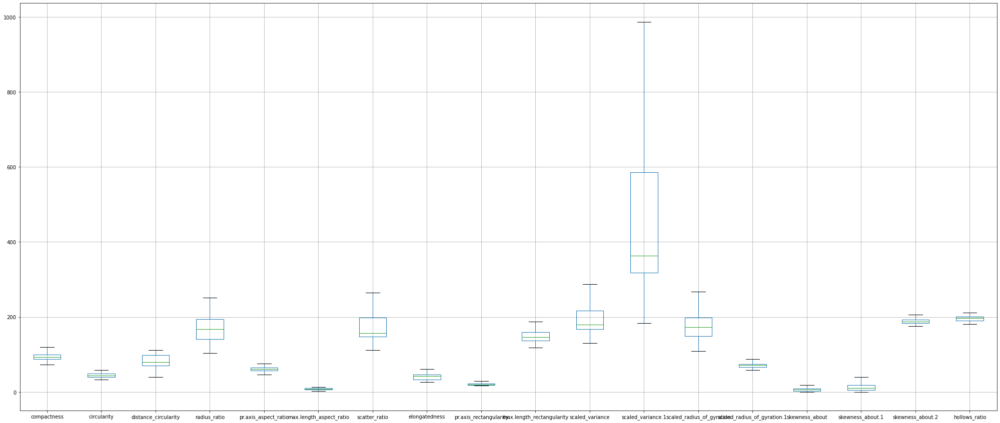

In [99]:
vehicleDfRaw.boxplot(figsize=(35,15));

    There are no outliers observed.

In [100]:
vehicleDfRaw.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

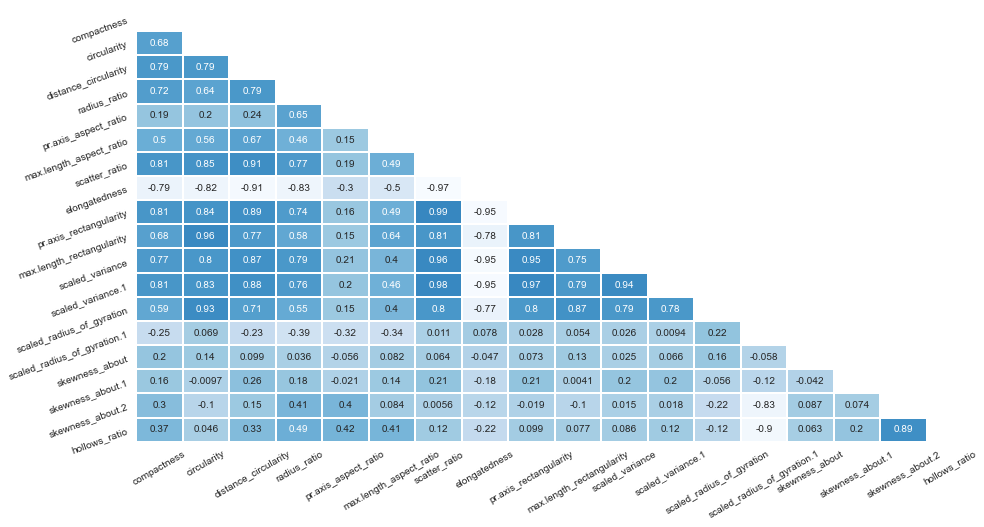

In [101]:
#Correlation Matrix
df = vehicleDfRaw
corr = df.corr() # correlation matrix
lower_triangle = np.tril(corr, k = -1) 
mask = lower_triangle == 0  # to mask the upper triangle in the following heatmap

plt.figure(figsize = (15,8)) 
sns.set_style(style = 'white')  # Setting it to white so that we do not see the grid lines
sns.heatmap(lower_triangle, center=0.5, cmap= 'Blues', annot= True, xticklabels = corr.index, yticklabels = corr.columns, cbar= False, linewidths= 1, mask = mask)  
plt.xticks(rotation = 30)   
plt.yticks(rotation = 20) 
plt.show()

- There are both negative and positive correlation observed between variables.
- There are some values observed which are close to 0.
- Since there are many columns, this data needs PCA and reduce number of features before model training.
- pr.axis_rectagularity is having good correlation with other columns.
- hollows_ratio is having less correaltion with other columns.

###### Classifier: 
Design and train a best fit SVM classier using all the data attribute

In [102]:
#independent and dependent variables
Xvalues= vehicleDfRaw.iloc[:,0:18]
yvalue= vehicleDfRaw.iloc[:,18]

In [103]:
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(Xvalues,yvalue, test_size = 0.3, random_state = 10)

In [104]:
#Creating SVM classifier
#using default params - (Cfloat, default=1.0) , (kernel default=’rbf’)
clf = SVC()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)

In [105]:
print('Accuracy on Training data: ',clf.score(X_train, y_train))
print('Accuracy on Testing data: ', clf.score(X_test , y_test))

Accuracy on Training data:  0.6621621621621622
Accuracy on Testing data:  0.6496062992125984


-  The score seems to be low in accuracy for both test and train data.

In [106]:
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Recall value:  0.6198542982030112
Precision value:  0.6166822284469343
Confusion Matrix:
 [[34  4 22]
 [31 95  0]
 [ 6 26 36]]
Classification Report:
               precision    recall  f1-score   support

         bus       0.48      0.57      0.52        60
         car       0.76      0.75      0.76       126
         van       0.62      0.53      0.57        68

    accuracy                           0.65       254
   macro avg       0.62      0.62      0.62       254
weighted avg       0.66      0.65      0.65       254



 - The recall, precision and f1 are low, this is without applying PCA.

**Dimensional reduction:**
perform dimensional reduction on the data.

In [107]:
#scaling data 
from scipy.stats import zscore
XScaled=Xvalues.apply(zscore)

#applying PCA dimension reduction
covMatrix = np.cov(XScaled,rowvar=False)
pca = PCA(n_components=8)
pca.fit(XScaled)

PCA(n_components=8)

In [108]:
print(pca.components_)

[[ 0.27250289  0.28725469  0.30242111  0.26971354  0.09786073  0.19520014
   0.31052393 -0.3090069   0.307287    0.27815416  0.29976509  0.30553237
   0.26323762 -0.04193594  0.03608321  0.05872048  0.03801314  0.08474   ]
 [-0.08704358  0.13162176 -0.04614301 -0.19793126 -0.25783995 -0.10804563
   0.07528535 -0.01322994  0.0875602   0.12215424  0.07726575  0.07150302
   0.21058205  0.50362158 -0.01576632 -0.09274624 -0.50162122 -0.50761211]
 [-0.03818521 -0.20114691  0.06346211  0.05628517 -0.06199275 -0.14895782
   0.10904283 -0.09085269  0.1060705  -0.21368469  0.1445998   0.11034374
  -0.20287019  0.07386402 -0.55917399  0.6706805  -0.06224071 -0.04170535]
 [ 0.13867501 -0.03805548  0.10895429 -0.25435509 -0.61276572  0.27867816
   0.00539295  0.06521486  0.03089915  0.04146747 -0.06400509 -0.00219687
  -0.08553965 -0.11539962  0.47370331  0.42842603 -0.0274096   0.09603749]
 [ 0.13710147 -0.13899555 -0.08001743  0.13374437  0.12360146 -0.63489336
   0.08555745 -0.07907344  0.08164

In [109]:
pca.explained_variance_ratio_.sum()

0.9723446088994472

In [110]:
print(pca.explained_variance_ratio_)

[0.54099325 0.18593103 0.06616512 0.0629155  0.04905291 0.03697101
 0.01765416 0.01266163]


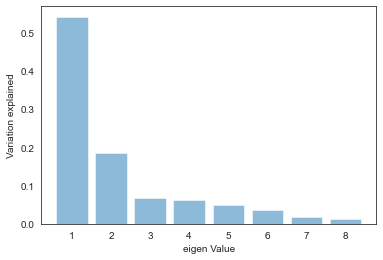

In [111]:
plt.bar(list(range(1,9)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

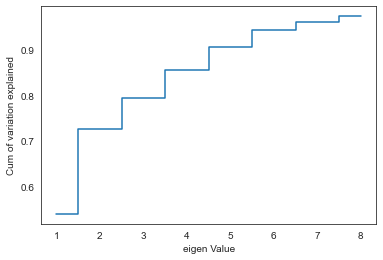

In [112]:
plt.step(list(range(1,9)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

- Dimension reduction eliminiate 10 principal components because almost 97.2% of the data is captured by 8 principal components.

In [113]:
pca8 = PCA(n_components=8)
pca8.fit(XScaled)
print(pca8.components_)
print(pca8.explained_variance_ratio_)
Xpca8 = pca8.transform(XScaled)

[[ 0.27250289  0.28725469  0.30242111  0.26971354  0.09786073  0.19520014
   0.31052393 -0.3090069   0.307287    0.27815416  0.29976509  0.30553237
   0.26323762 -0.04193594  0.03608321  0.05872048  0.03801314  0.08474   ]
 [-0.08704358  0.13162176 -0.04614301 -0.19793126 -0.25783995 -0.10804563
   0.07528535 -0.01322994  0.0875602   0.12215424  0.07726575  0.07150302
   0.21058205  0.50362158 -0.01576632 -0.09274624 -0.50162122 -0.50761211]
 [-0.03818521 -0.20114691  0.06346211  0.05628517 -0.06199275 -0.14895782
   0.10904283 -0.09085269  0.1060705  -0.21368469  0.1445998   0.11034374
  -0.20287019  0.07386402 -0.55917399  0.6706805  -0.06224071 -0.04170535]
 [ 0.13867501 -0.03805548  0.10895429 -0.25435509 -0.61276572  0.27867816
   0.00539295  0.06521486  0.03089915  0.04146747 -0.06400509 -0.00219687
  -0.08553965 -0.11539962  0.47370331  0.42842603 -0.0274096   0.09603749]
 [ 0.13710147 -0.13899555 -0.08001743  0.13374437  0.12360146 -0.63489336
   0.08555745 -0.07907344  0.08164

In [114]:
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(Xpca8,yvalue, test_size = 0.3, random_state = 10)

**Classifier**: Design and train a best fit SVM classier using dimensionally reduced attributes

In [115]:
clf = SVC()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)

In [116]:
# check the accuracy on the training data
print('Accuracy on Training data: ',clf.score(X_train, y_train))
# check the accuracy on the testing data
print('Accuracy on Testing data: ', clf.score(X_test , y_test))
#Calculate the recall value 
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
#Calculate the precision value 
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Accuracy on Training data:  0.9510135135135135
Accuracy on Testing data:  0.9409448818897638
Recall value:  0.9364850250930873
Precision value:  0.9413250975207047
Confusion Matrix:
 [[ 67   2   1]
 [  4 119   4]
 [  0   4  53]]
Classification Report:
               precision    recall  f1-score   support

         bus       0.94      0.96      0.95        70
         car       0.95      0.94      0.94       127
         van       0.91      0.93      0.92        57

    accuracy                           0.94       254
   macro avg       0.94      0.94      0.94       254
weighted avg       0.94      0.94      0.94       254



**Conclusion:** Showcase key pointer on how dimensional reduction helped in this case.

- Accuracy on test and trained data increased when we use data from PCA.
- Reducing number of column from 18 to 8 has improved accuracy.
- recall, precision also increased after using data from PCA.
- When Confusion matrix compared  type 1 and type 2 errors reduced.

## Part Four

### DOMAIN: Sports management 
**CONTEXT**: Company X is a sports management company for international cricket. 
**DATA DESCRIPTION**: The data is collected belongs to batsman from IPL series conducted so far. Attribute Information: 
1. Runs: Runs score by the batsman
2. Ave: Average runs scored by the batsman per match
3. SR: strike rate of the batsman
4. Fours: number of boundary/four scored
5. Six: number of boundary/six scored
6. HF: number of half centuries scored so far

**PROJECT OBJECTIVE**: Goal is to build a data driven batsman ranking model for the sports management company to make business decisions.

**Steps and tasks**:
    
    1. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden  patterns by using all possible methods.

    2. Build a data driven model to rank all the players in the dataset using all or the most important performance feature

In [117]:
#loading packages
import numpy as np   
import pandas as pd    
import matplotlib.pyplot as plt 
from sklearn.cluster import KMeans
from scipy.stats import zscore
from sklearn.metrics import silhouette_samples, silhouette_score
import seaborn as sns
%matplotlib inline 
sns.set(color_codes=True)
%matplotlib inline
import warnings

In [118]:
#importing the data
bbipl_raw=pd.read_csv('./Part4 - batting_bowling_ipl_bat.csv')

In [119]:
#view some sample records
bbipl_raw

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
175,PC Valthaty,30.0,5.00,58.82,4.0,0.0,0.0
176,NaN,NaN,NaN,NaN,NaN,NaN,NaN
177,RP Singh,6.0,3.00,50.00,0.0,0.0,0.0
178,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [120]:
(n_samples, n_features) = bbipl_raw.shape
print("Number of records :: ", n_samples)
print("Number of columns :: ", n_features)

Number of records ::  180
Number of columns ::  7


In [121]:
#checking null values
bbipl_nan = bbipl_raw[bbipl_raw.isna().any(axis=1)]
bbipl_nan.isnull().sum()

Name     90
Runs     90
Ave      90
SR       90
Fours    90
Sixes    90
HF       90
dtype: int64

In [122]:
#removing null values
bbipl=bbipl_raw.dropna(axis=0)
bbipl.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0


In [123]:
bbipl.isnull().sum()

Name     0
Runs     0
Ave      0
SR       0
Fours    0
Sixes    0
HF       0
dtype: int64

    There are no null values observed 

###### EDA and visualisation:
Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods

In [124]:
bbipl.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90 entries, 1 to 179
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 5.6+ KB


    Except Name column, rest are numerical

In [125]:
bbipl.describe().T

,count,mean,std,min,25%,50%,75%,max
Runs,90.0,219.933333,156.253669,2.00,98.000,196.500,330.7500,733.00
Ave,90.0,24.729889,13.619215,0.50,14.665,24.440,32.1950,81.33
SR,90.0,119.164111,23.656547,18.18,108.745,120.135,131.9975,164.10
Fours,90.0,19.788889,16.399845,0.00,6.250,16.000,28.0000,73.00
Sixes,90.0,7.577778,8.001373,0.00,3.000,6.000,10.0000,59.00
HF,90.0,1.188889,1.688656,0.00,0.000,0.500,2.0000,9.00


    Data distribution for Runs seemms to be bit right skewed
    75% of data for runs column are below 330
    75% of data for Fours column are below 28
    75% of data for Sixes column are below 10

In [126]:
#checking duplicate data
print('Duplicated rows: ', bbipl[bbipl.duplicated()].shape[0])

Duplicated rows:  0


In [127]:
bbipl.columns

Index(['Name', 'Runs', 'Ave', 'SR', 'Fours', 'Sixes', 'HF'], dtype='object')

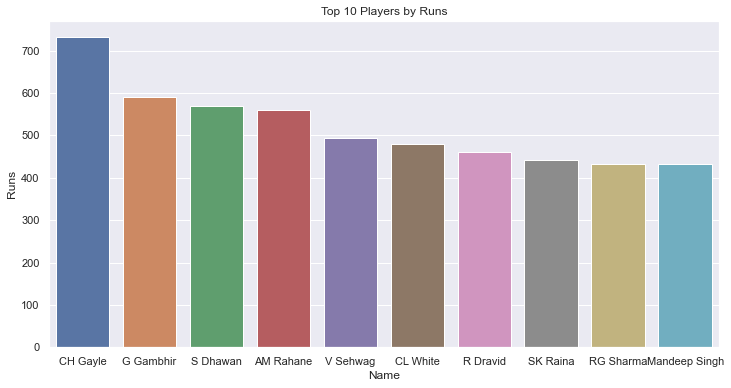

In [128]:
col = 'Runs'
plt.figure(figsize=(12,6))
bbiplRuns=bbipl.groupby('Name')[col].sum().sort_values(ascending = False ).head(10)
bbiplRuns= bbiplRuns.reset_index() 
bbiplRuns.columns = ['Name' ,col]
sns.barplot(data= bbiplRuns , x= 'Name' , y =col);
plt.title("Top 10 Players by Runs");

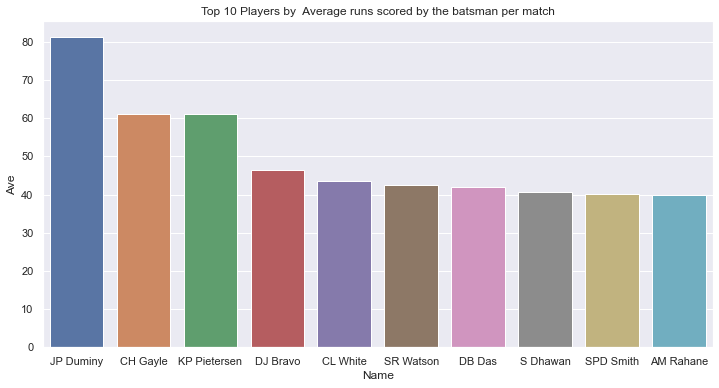

In [129]:
col = 'Ave'
plt.figure(figsize=(12,6))
bbiplRuns=bbipl.groupby('Name')[col].sum().sort_values(ascending = False ).head(10)
bbiplRuns= bbiplRuns.reset_index() 
bbiplRuns.columns = ['Name' ,col]
sns.barplot(data= bbiplRuns , x= 'Name' , y =col);
plt.title("Top 10 Players by  Average runs scored by the batsman per match");

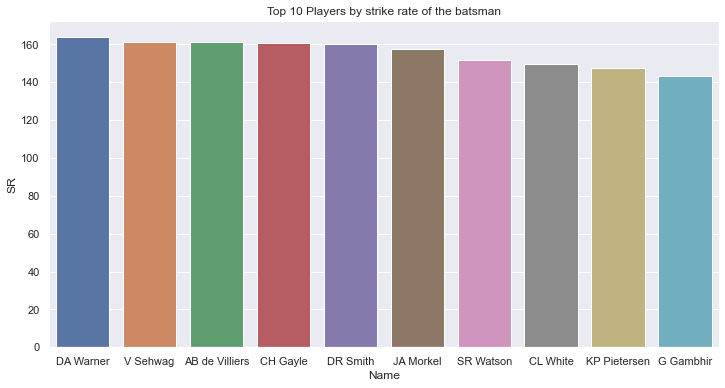

In [130]:
col = 'SR'
plt.figure(figsize=(12,6))
bbiplRuns=bbipl.groupby('Name')[col].sum().sort_values(ascending = False ).head(10)
bbiplRuns= bbiplRuns.reset_index() 
bbiplRuns.columns = ['Name' ,col]
sns.barplot(data= bbiplRuns , x= 'Name' , y =col);
plt.title("Top 10 Players by strike rate of the batsman");

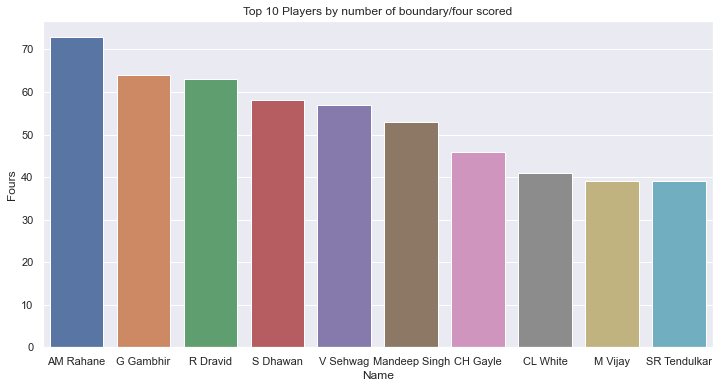

In [131]:
col = 'Fours'
plt.figure(figsize=(12,6))
bbiplRuns=bbipl.groupby('Name')[col].sum().sort_values(ascending = False ).head(10)
bbiplRuns= bbiplRuns.reset_index() 
bbiplRuns.columns = ['Name' ,col]
sns.barplot(data= bbiplRuns , x= 'Name' , y =col);
plt.title("Top 10 Players by number of boundary/four scored");

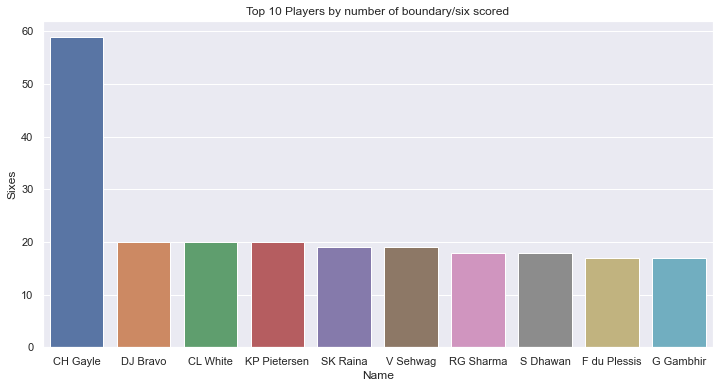

In [132]:
col = 'Sixes'
plt.figure(figsize=(12,6))
bbiplRuns=bbipl.groupby('Name')[col].sum().sort_values(ascending = False ).head(10)
bbiplRuns= bbiplRuns.reset_index() 
bbiplRuns.columns = ['Name' ,col]
sns.barplot(data= bbiplRuns , x= 'Name' , y =col);
plt.title("Top 10 Players by number of boundary/six scored");

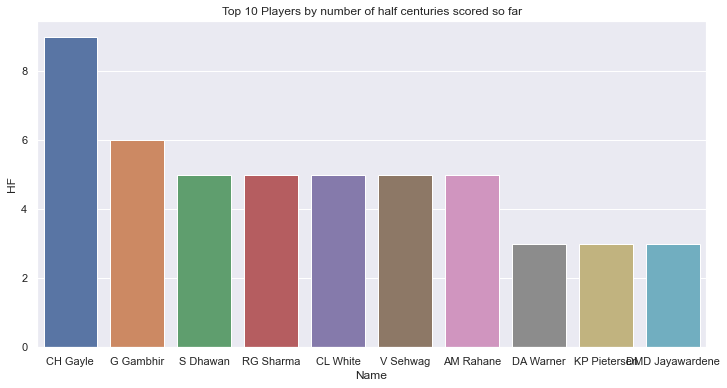

In [133]:
col = 'HF'
plt.figure(figsize=(12,6))
bbiplRuns=bbipl.groupby('Name')[col].sum().sort_values(ascending = False ).head(10)
bbiplRuns= bbiplRuns.reset_index() 
bbiplRuns.columns = ['Name' ,col]
sns.barplot(data= bbiplRuns , x= 'Name' , y =col);
plt.title("Top 10 Players by number of half centuries scored so far");

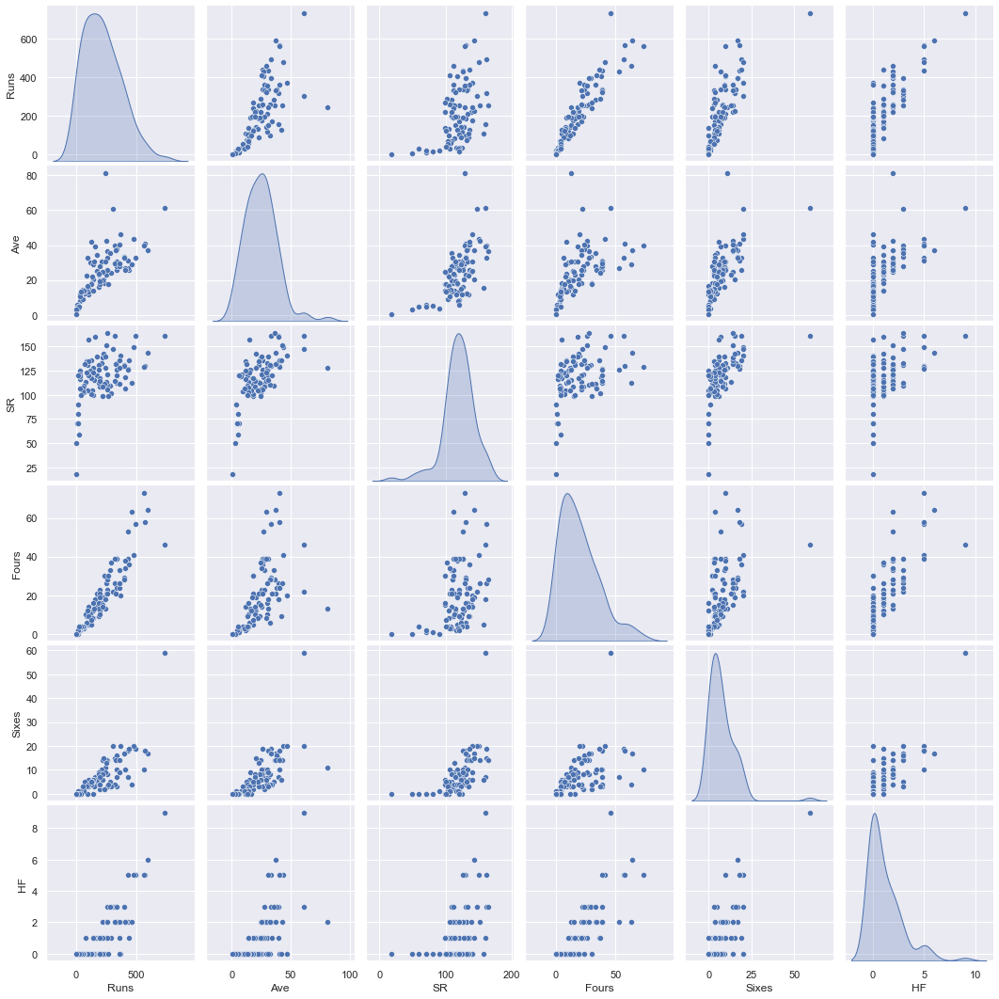

In [134]:
sns.pairplot(bbipl,diag_kind='kde')

    HF column is having good positive correlation against Run, Fours, sixes
    Runs  is having good positive correlation against Run, Fours, sixes
    Data distribution is normal for Runs column, Right Skewed for HF,Sixes, Fours and Ave which signifies there are few good players available in the data set

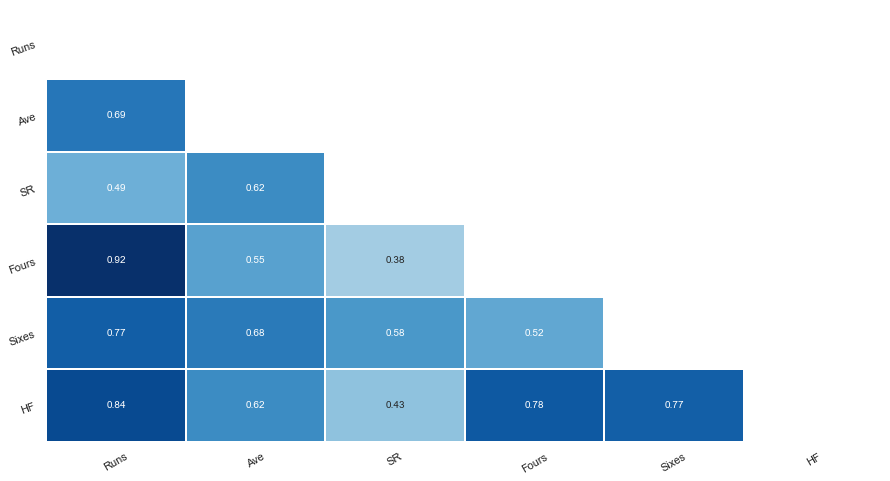

In [135]:
#Correlation Matrix
df = bbipl
corr = df.corr() # correlation matrix
lower_triangle = np.tril(corr, k = -1) 
mask = lower_triangle == 0  # to mask the upper triangle in the following heatmap

plt.figure(figsize = (15,8)) 
sns.set_style(style = 'white')  # Setting it to white so that we do not see the grid lines
sns.heatmap(lower_triangle, center=0.5, cmap= 'Blues', annot= True, xticklabels = corr.index, yticklabels = corr.columns, cbar= False, linewidths= 1, mask = mask)  
plt.xticks(rotation = 30)   
plt.yticks(rotation = 20) 
plt.show()

    As mentioned above, we see good correlation among few variables.

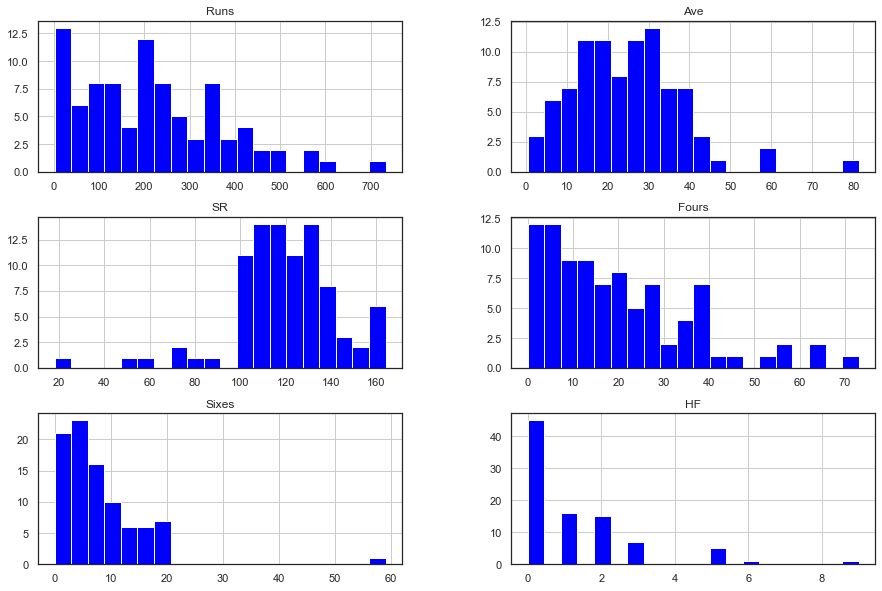

In [136]:
bbipl.hist(bins = 20, figsize = (15, 10), color = 'blue')
plt.show()

    There are more players which have score less than 300.
    Average score seems to be around 40.
    Very few players have scroe more then 30 Fours
    There are very less sixes scored by playes.
    Frequency of number of Half Centuries are very less.


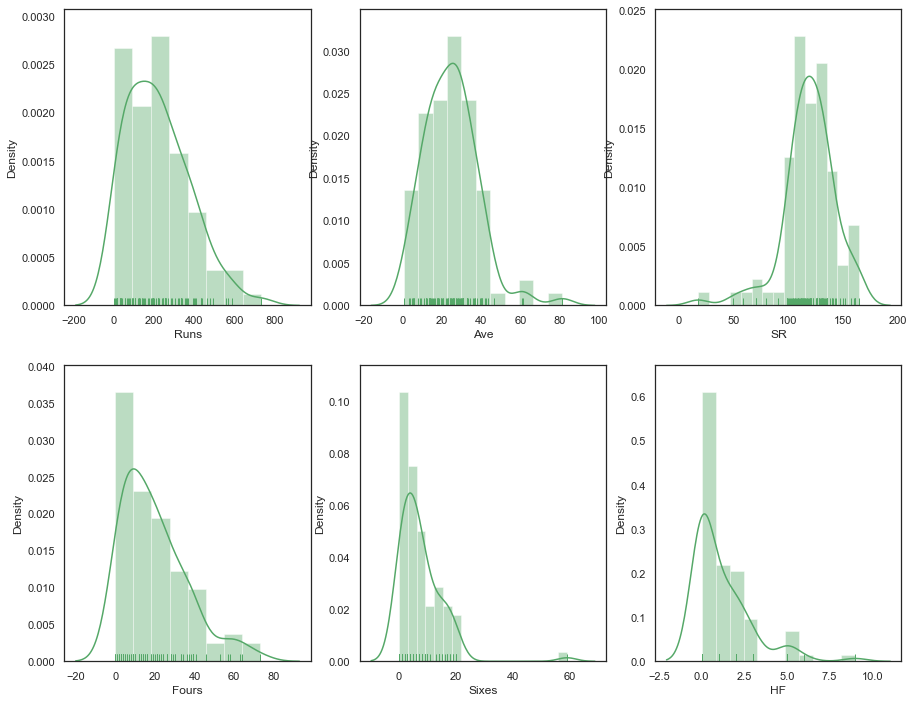

In [137]:
df=bbipl
ColList= df.drop(columns='Name').columns
plt.figure(figsize=(15, 12))
col = 1
for i in ColList:
    plt.subplot(2, 3, col)
    sns.distplot(df[i], color = 'g', rug=True)
    col += 1 

    The above plot would give nice view on distribution of data.

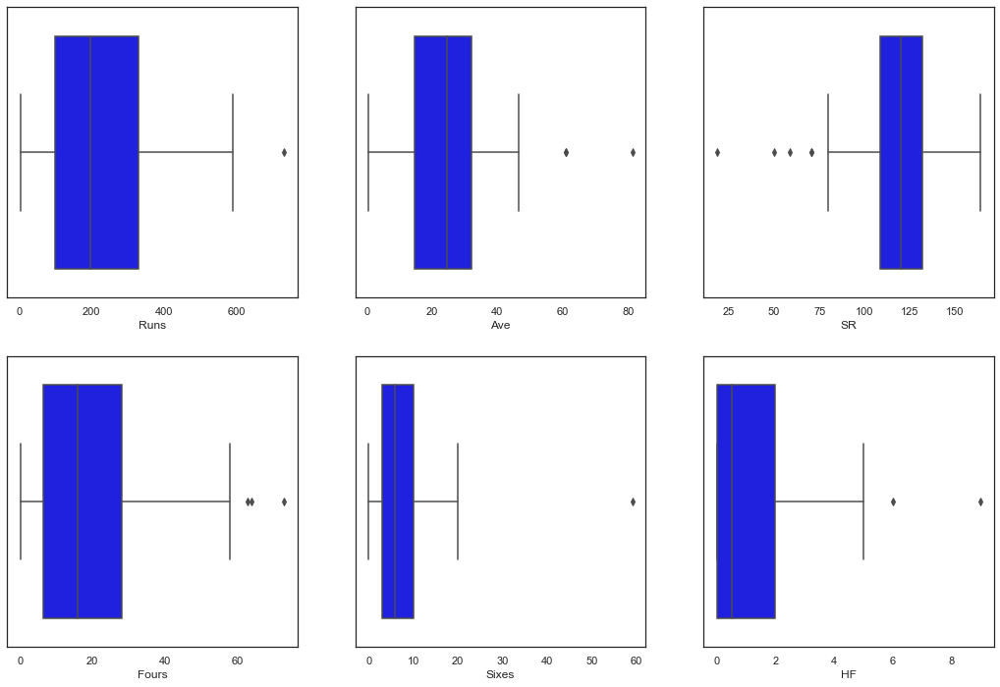

In [138]:
df=bbipl
plt.figure(figsize=(18, 12))
col = 1
for i in df.drop(columns='Name').columns:
    plt.subplot(2, 3, col)
    sns.boxplot(df[i],color='blue')
    col += 1

    There are few outliers observed in all the columns.
    These could be genuine observation as we observed in the data analysis, there are few good players whos score are higher.

In [139]:
kmDf = bbipl.iloc[:,1:7] 
kmDf_z = kmDf.apply(zscore)

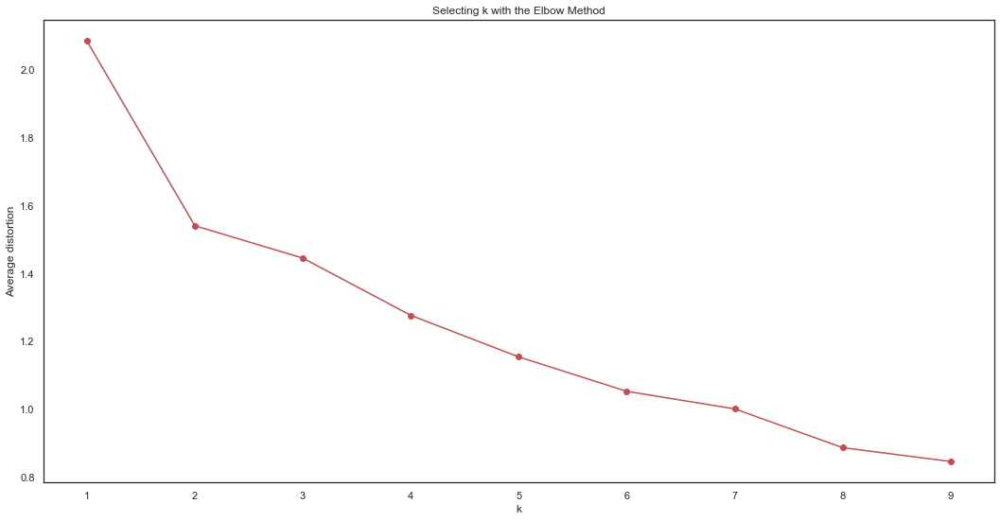

In [140]:
#Finding optimal no. of clusters
from scipy.spatial.distance import cdist
clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k,max_iter=100, n_init=1, verbose=0, random_state=42)
    model.fit(kmDf_z)
    prediction=model.predict(kmDf_z)
    meanDistortions.append(sum(np.min(cdist(kmDf_z, model.cluster_centers_, 'euclidean'), axis=1)) / kmDf_z.shape[0])

plt.figure(figsize=(18,9))
plt.plot(clusters, meanDistortions, 'or-');
plt.xlabel('k');
plt.ylabel('Average distortion');
plt.title('Selecting k with the Elbow Method');

[540.0000000000001, 296.26135354732025, 237.55302272209806, 184.78630867761996, 148.52653974259806, 121.33726607357632, 103.110423176737, 86.51455858107828, 78.31704347874911]


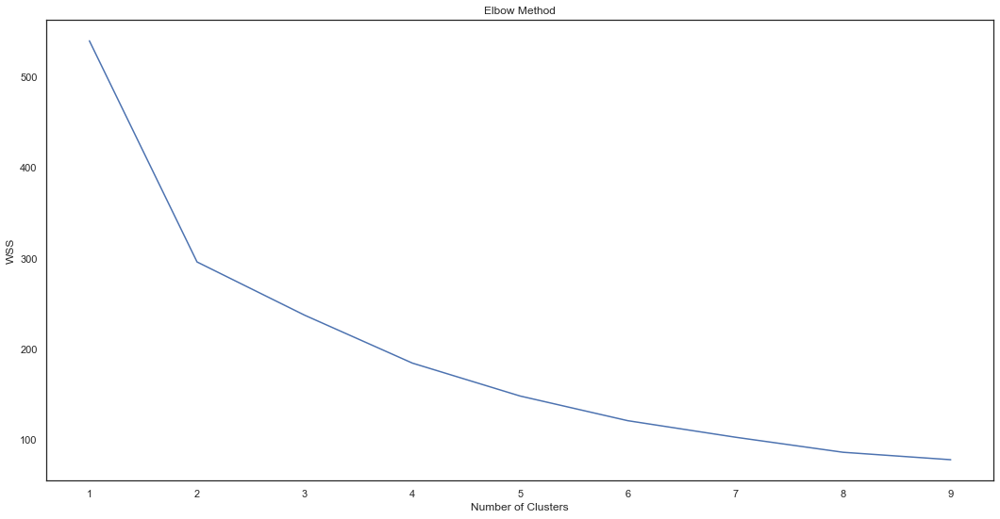

In [141]:
#calculatint the within sum of squares
wss =[] 
for i in range(1,10):
    model = KMeans(n_clusters=i,max_iter=100, n_init=1, verbose=0, random_state=42)
    model.fit(kmDf_z)
    wss.append(model.inertia_)
print(wss)
# using Elbow-method :: plotting the WSS against the number of cluster to come up with optimal number of clusters
plt.figure(figsize=(18,9))
plt.plot(range(1,10), wss);
plt.title('Elbow Method');
plt.xlabel("Number of Clusters")
plt.ylabel("WSS");

For n_clusters = 2 The average silhouette_score is : 0.41
For n_clusters = 3 The average silhouette_score is : 0.41
For n_clusters = 4 The average silhouette_score is : 0.28


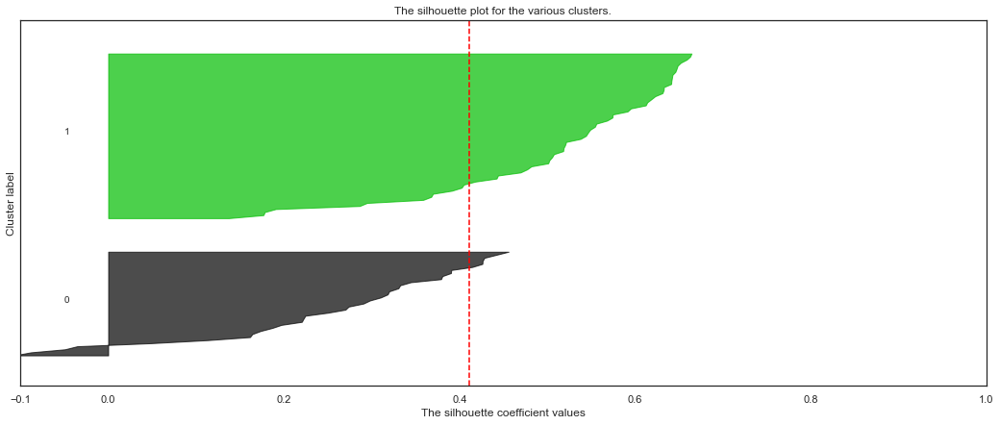

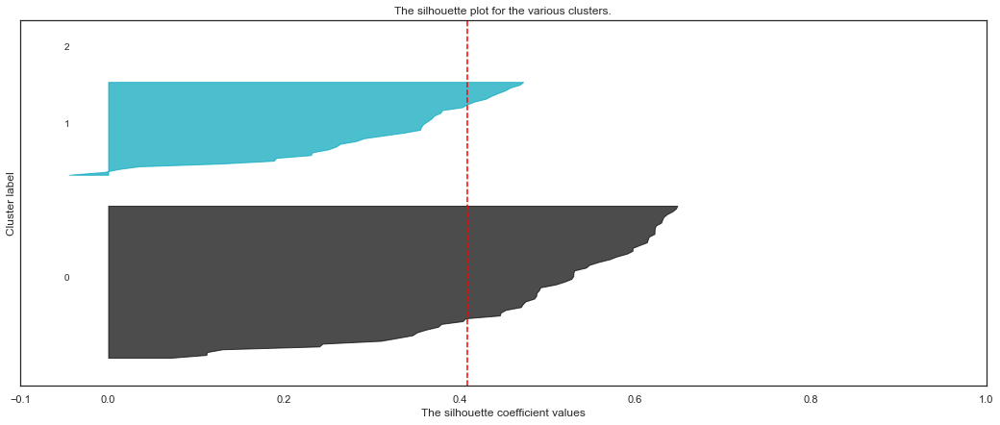

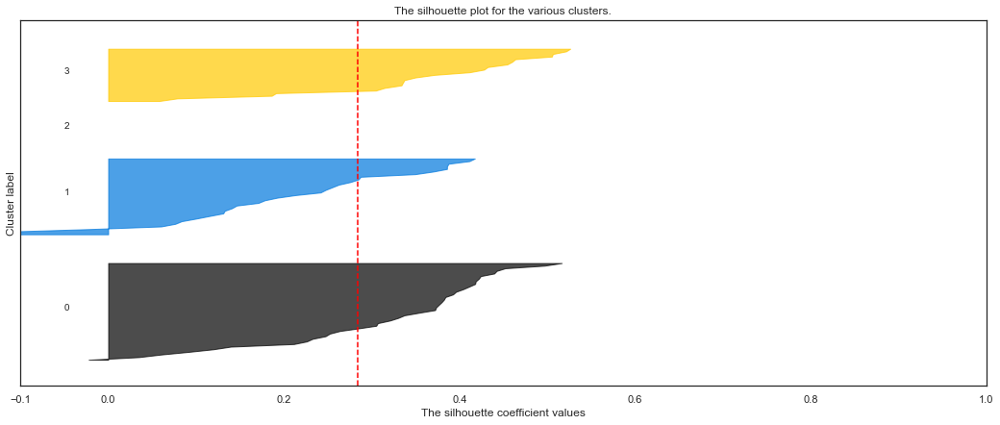

In [142]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from sklearn.metrics import silhouette_samples, silhouette_score
#below mentioned code is derived from https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
#Since there is elbow observed - we can choose to check silhoutte graph for k under 6
range_n_clusters = [2, 3, 4]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(kmDf_z) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters,max_iter=100, n_init=1, verbose=0, random_state=42)
    cluster_labels = clusterer.fit_predict(kmDf_z)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(kmDf_z, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", round(silhouette_avg,2))

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(kmDf_z, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

    Observing above 3 graphs - we can conclude that there are 2 or 3 good cluster.
    We shall consider 2 cluster sicne there are sharp elbow observed in the graphs.

In [143]:
#using 2 centroids
k_means = KMeans(n_clusters = 2,random_state=42)
k_means.fit(kmDf_z)
labels = k_means.labels_

In [144]:
labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1])

In [145]:
#attaching the labels to the original data
bbipl['cluster']=labels
bbipl.head()

D:\anaconda\envs\gl\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Name,Runs,Ave,SR,Fours,Sixes,HF,cluster
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,0
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,0
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,0
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0,0
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,0


In [146]:
bbipl.cluster.value_counts().sort_index()

0    35
1    55
Name: cluster, dtype: int64

In [147]:
meandata=bbipl.iloc[:,0:9].groupby('cluster').mean()
meandata['Freq']=bbipl.cluster.value_counts().sort_index()
meandata

,Runs,Ave,SR,Fours,Sixes,HF,Freq
cluster,,,,,,,
0,372.657143,35.962286,132.808286,34.685714,13.771429,2.714286,35
1,122.745455,17.582000,110.481455,10.309091,3.636364,0.218182,55


In [148]:
bbipl['cluster'] = bbipl['cluster'].replace({1: 'Rank 2', 0: 'Rank 1'})

D:\anaconda\envs\gl\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [149]:
bbipl

,Name,Runs,Ave,SR,Fours,Sixes,HF,cluster
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,Rank 1
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,Rank 1
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,Rank 1
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0,Rank 1
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,Rank 1
...,...,...,...,...,...,...,...,...
171,Z Khan,12.0,6.00,70.58,1.0,0.0,0.0,Rank 2
173,WD Parnell,19.0,4.75,70.37,2.0,0.0,0.0,Rank 2
175,PC Valthaty,30.0,5.00,58.82,4.0,0.0,0.0,Rank 2
177,RP Singh,6.0,3.00,50.00,0.0,0.0,0.0,Rank 2


In [150]:
df  = bbipl[bbipl['cluster'] == 'Rank 1']
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(df)

               Name   Runs    Ave      SR  Fours  Sixes   HF cluster
1          CH Gayle  733.0  61.08  160.74   46.0   59.0  9.0  Rank 1
3         G Gambhir  590.0  36.87  143.55   64.0   17.0  6.0  Rank 1
5          V Sehwag  495.0  33.00  161.23   57.0   19.0  5.0  Rank 1
7          CL White  479.0  43.54  149.68   41.0   20.0  5.0  Rank 1
9          S Dhawan  569.0  40.64  129.61   58.0   18.0  5.0  Rank 1
11        AM Rahane  560.0  40.00  129.33   73.0   10.0  5.0  Rank 1
13     KP Pietersen  305.0  61.00  147.34   22.0   20.0  3.0  Rank 1
15        RG Sharma  433.0  30.92  126.60   39.0   18.0  5.0  Rank 1
17   AB de Villiers  319.0  39.87  161.11   26.0   15.0  3.0  Rank 1
19        JP Duminy  244.0  81.33  128.42   13.0   11.0  2.0  Rank 1
21        DA Warner  256.0  36.57  164.10   28.0   14.0  3.0  Rank 1
23        SR Watson  255.0  42.50  151.78   26.0   14.0  2.0  Rank 1
25     F du Plessis  398.0  33.16  130.92   29.0   17.0  3.0  Rank 1
27          OA Shah  340.0  37.77 

In [151]:
df  = bbipl[bbipl['cluster'] == 'Rank 2']
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(df)

                Name   Runs    Ave      SR  Fours  Sixes   HF cluster
69          MS Bisla  213.0  30.42  133.12   16.0   10.0  1.0  Rank 2
73          BJ Hodge  245.0  30.62  140.00   18.0    9.0  0.0  Rank 2
75           NV Ojha  255.0  23.18  113.83   21.0   13.0  1.0  Rank 2
77            DB Das  126.0  42.00  135.48    9.0    6.0  0.0  Rank 2
79      AC Gilchrist  172.0  34.40  120.27   21.0    4.0  1.0  Rank 2
81       BB McCullum  289.0  24.08  102.12   37.0    3.0  1.0  Rank 2
83         IK Pathan  176.0  25.14  139.68   14.0    6.0  0.0  Rank 2
85     Azhar Mahmood  186.0  23.25  130.98   16.0    8.0  0.0  Rank 2
87         MK Pandey  143.0  20.42  127.67   12.0    6.0  1.0  Rank 2
89       S Badrinath  196.0  28.00  108.28   23.0    2.0  1.0  Rank 2
91         DA Miller   98.0  32.66  130.66    6.0    4.0  0.0  Rank 2
93         MK Tiwary  260.0  26.00  105.69   21.0    3.0  1.0  Rank 2
95         JA Morkel  107.0  15.28  157.35    5.0    6.0  0.0  Rank 2
97       LRPL Taylor

    As observed in the printed table, based on combination of data in the column, players are ranked

## Part 5:

**Questions**:

    1. List down all possible dimensionality reduction techniques that can be implemented using python.
    2. So far you have used dimensional reduction on numeric data. Is it possible to do the same on a multimedia data [images and video] and text data ? Please illustrate your findings using a simple implementation on python

    Dimensionality reduction, or dimension reduction, is the transformation of data from a high-dimensional space into a low-dimensional space so that the low-dimensional representation retains some meaningful properties of the original data.
    
Dimensionality reduction techniques  
    
**Missing Value Ratio** :  
    
    If the dataset has too many missing values, We can drop the variables having a large number of missing values in them. data columns with number of missing values greater than a given threshold can be removed.

**Low Variance filter** : 
    
     Data columns with variance lower than a given threshold are removed, We apply this approach to identify and drop constant variables from the dataset. 

**High Correlation filter** : 

    A pair of variables having high correlation increases multicollinearity in the dataset. So, we can use this technique to find highly correlated features and drop them accordingly.

**Random Forest** : 

    Here the idea is to generate a large and carefully constructed set of trees against a target attribute and then use each attribute’s usage statistics to find the most informative subset of features.

**Both Backward Feature Elimination** : 

    At a given iteration, algorithm is trained on n input features. Then we remove one input feature at a time and train the same model on n-1 input features n times.   The input feature whose removal has produced the smallest increase in the error rate is removed.   Selecting the maximum tolerable error rate, we define the smallest number of features necessary to reach that classification performance.

**Forward Feature Selection** : 

    This is the inverse process to the Backward Feature Elimination. We start with 1 feature only, progressively adding 1 feature at a time,

    Backward Feature Elimination and Forward Feature Construction, are quite time and computationally expensive. 
    
**Factor Analysis**: 
    
    When we have highly correlated set of variables, this technique can be applied. It divides the variables based on their correlation into different groups, and represents each group with a factor.
    
**Principal Component Analysis**: 
    
    This is one of the most widely used techniques for dealing with linear data. It is a dimensionality-reduction method that is often used to reduce the dimensionality of large data sets, by transforming a large set of variables into a smaller one that still contains most of the information in the large set. Reducing the number of variables of a data set naturally comes at the expense of accuracy, but the trick in dimensionality reduction is to trade a little accuracy for simplicity. 

**Independent Component Analysis**:

    Its is a statistical and computational technique for revealing hidden factors that underlie sets of random variables. Unlike principal component analysis which focuses on maximizing the variance of the data points, the independent component analysis focuses on independence, i.e. independent components.
    
**ISOMAP**:
    
    Isomap is a nonlinear dimensionality reduction method. It is one of several widely used low-dimensional embedding methods. In this method, we determine the neighbors of each point, construct a neighborhood graph,  Compute shortest path between two nodes, compute lower-dimensional embedding. 

**t-SNE**:
    
    t-distributed stochastic neighbor embedding (t-SNE) is a statistical method for visualizing high-dimensional data by giving each datapoint a location in a two or three-dimensional map. This technique also works well when the data is strongly non-linear.

**UMAP**:

    Uniform Manifold Approximation and Projection (UMAP) is a dimension reduction technique that can be used for visualisation similarly to t-SNE, but also for general non-linear dimension reduction. 

**References**:
    
    https://en.wikipedia.org
    https://www.kdnuggets.com/2015/05/7-methods-data-dimensionality-reduction.html


**PCA for multimedia data**

Reference : https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_digits.html

    The dataset which is planned to use  contains handwritten digits from 0 to 9. We would like to group images such that the handwritten digits on the image are the same.

In [152]:
import numpy as np
from sklearn.datasets import load_digits
from time import time
from sklearn import metrics
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

data, labels = load_digits(return_X_y=True)
(n_samples, n_features), n_digits = data.shape, np.unique(labels).size

print(" Number of digits : " , n_digits)
print(" Number of samples : ", n_samples)
print(" Number of features : ", n_features)

 Number of digits :  10
 Number of samples :  1797
 Number of features :  64


    Plan is to use PCA and reduce the dimensonality to lower dimension so it can be applied for clustering. This is also helpful for visualization.

In [153]:
pca = PCA(n_components=20).fit(data)
kmeans = KMeans(init=pca.components_, n_clusters=n_digits, n_init=1)

In [154]:
print(pca.components_)

[[-5.55111512e-17 -1.73094634e-02 -2.23428836e-01 ... -8.94184630e-02
  -3.65977051e-02 -1.14684904e-02]
 [ 0.00000000e+00 -1.01064557e-02 -4.90849204e-02 ...  1.76697121e-01
   1.94547070e-02 -6.69693758e-03]
 [ 5.55111512e-17  1.83420711e-02  1.26475541e-01 ...  2.32084156e-01
   1.67026561e-01  3.48043820e-02]
 ...
 [-8.93518115e-17 -2.32390592e-02 -1.30595713e-01 ... -4.49896819e-02
  -9.86978759e-03  5.58786035e-02]
 [-1.04066468e-17 -1.91722360e-02 -2.40706068e-04 ...  8.63290134e-02
   1.77994617e-01  6.53393254e-02]
 [-1.60433758e-16 -3.70287083e-03  3.53273450e-03 ...  2.78472829e-02
   1.07364056e-01  6.56252675e-02]]


In [155]:
pca.explained_variance_ratio_.sum()

0.8942948683085874

In [156]:
print(pca.explained_variance_ratio_)

[0.14890594 0.13618771 0.11794594 0.08409979 0.05782415 0.0491691
 0.04315987 0.03661373 0.03353248 0.03078806 0.02372341 0.02272696
 0.01821861 0.01773843 0.01467097 0.01409696 0.01318568 0.01248087
 0.01017585 0.00905037]


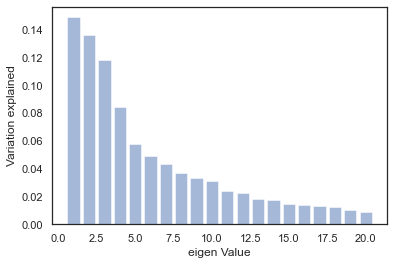

In [157]:
plt.bar(list(range(1,21)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

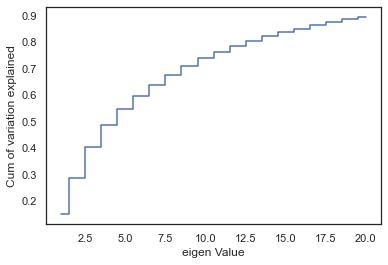

In [158]:
plt.step(list(range(1,21)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

    89% of variance is explained by 20 components, original data set had 64 component
    The PCA is applied on image dataset which is having more features to define a single digit. But using PCA that can be reduced to lower number and use data for clustering.

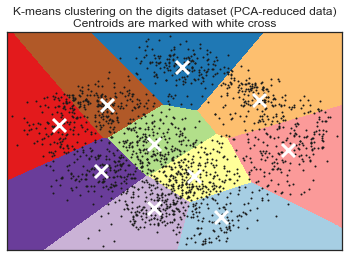

In [159]:
#Lets  visiulize data using below graph which shows dim reduction to 2 
import matplotlib.pyplot as plt

reduced_data = PCA(n_components=2).fit_transform(data)
kmeans = KMeans(init="k-means++", n_clusters=n_digits, n_init=4)
kmeans.fit(reduced_data)

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = .02     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = reduced_data[:, 0].min() - 1, reduced_data[:, 0].max() + 1
y_min, y_max = reduced_data[:, 1].min() - 1, reduced_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.imshow(Z, interpolation="nearest",
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired, aspect="auto", origin="lower")

plt.plot(reduced_data[:, 0], reduced_data[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker="x", s=169, linewidths=3,
            color="w", zorder=10)
plt.title("K-means clustering on the digits dataset (PCA-reduced data)\n"
          "Centroids are marked with white cross")
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()